In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sfrancia import shapiroFrancia

In [69]:
path = '/home/arfrech/Documents/Cursos/data science/Projects/cybersecurity - TCC/tcc-dsa/data/processed'
df = pd.read_parquet(f'{path}/Obfuscated-MalMem2022-processed.parquet')
df.head(3)

,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nfile,handles.nevent,...,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric,Class,Category,Family
0,45,17,10.555556,202.844444,1694,38.50000,9129,212.302326,670,3161,...,26,24,116,121,87,0,8,Benign,Benign,Benign
1,47,19,11.531915,242.234043,2074,44.12766,11385,242.234043,840,3761,...,26,24,118,122,87,0,8,Benign,Benign,Benign
2,40,14,14.725000,288.225000,1932,48.30000,11529,288.225000,1050,3996,...,26,27,118,120,88,0,8,Benign,Benign,Benign


<h4>Metadados</h4>

<b>pslist:</b> Uma lista de todos os processos ativos no sistema, contendo detalhes como PIDs, PPIDs, contagem de threads, etc.

<b>dlllist:</b>	Uma lista de bibliotecas de vínculo dinâmico (DLLs) carregadas na memória, incluindo seus nomes e atributos.

<b>handles:</b>	Identificadores numéricos usados para acessar recursos do sistema, como arquivos, chaves de registro, eventos, threads, etc.

<b>ldrmodules:</b> Informações sobre módulos carregados (executáveis e DLLs), incluindo endereços base e tamanhos.

<b>malfind:</b>	Uma ferramenta para identificar injeções de código, frequentemente usada para detectar atividades suspeitas ou maliciosas.

<b>psxview:</b>	Usado para descobrir processos ocultos ou obscuros que podem indicar atividade de malware ou rootkit.

<b>modules:</b>	Uma lista de todos os arquivos executáveis e DLLs carregados no despejo de memória.

<b>svcscan:</b>	Enumeração e análise de serviços do Windows e drivers presentes no despejo de memória.

<b>callbacks:</b> Exame de funções de retorno registradas usadas em resposta a eventos específicos no sistema.

| Item                                       | Descrição                                                                                       |
|--------------------------------------------|------------------------------------------------------------------------------------------------|
| `pslist.nproc`                             | Número de processos.                                                                            |
| `pslist.nppid`                             | Número de processos por ID do processo pai.                                                     |
| `pslist.avg_threads`                       | Número médio de threads por processo.                                                          |
| `pslist.nprocs64bit`                       | Número de processos de 64 bits.                                                                |
| `pslist.avg_handlers`                      | Número médio de manipuladores por processo.                                                    |
| `dlllist.ndlls`                            | Número de DLLs carregadas.                                                                     |
| `dlllist.avg_dlls_per_proc`                | Número médio de DLLs por processo.                                                              |
| `handles.nhandles`                         | Número de handles.                                                                             |
| `handles.avg_handles_per_proc`             | Número médio de handles por processo.                                                          |
| `handles.nport`                            | Número de portas.                                                                              |
| `handles.nfile`                            | Número de handles de arquivo.                                                                  |
| `handles.nevent`                           | Número de handles de evento.                                                                   |
| `handles.ndesktop`                         | Número de handles de desktop.                                                                  |
| `handles.nkey`                             | Número de handles de chave de registro.                                                        |
| `handles.nthread`                          | Número de handles de thread.                                                                   |
| `handles.ndirectory`                       | Número de handles de diretório.                                                               |
| `handles.nsemaphore`                       | Número de handles de semáforo.                                                                |
| `handles.ntimer`                           | Número de handles de temporizador.                                                            |
| `handles.nsection`                         | Número de handles de seção.                                                                   |
| `handles.nmutant`                          | Número de handles de mutante.                                                                 |
| `ldrmodules.not_in_load`                   | Número de módulos não no estado de carga.                                                      |
| `ldrmodules.not_in_init`                   | Número de módulos não no estado de inicialização.                                             |
| `ldrmodules.not_in_mem`                    | Número de módulos não na memória.                                                             |
| `ldrmodules.not_in_load_avg`               | Número médio de módulos não no estado de carga.                                               |
| `ldrmodules.not_in_init_avg`               | Número médio de módulos não no estado de inicialização.                                       |
| `ldrmodules.not_in_mem_avg`                | Número médio de módulos não na memória.                                                       |
| `malfind.ninjections`                      | Número de injeções de processo.                                                               |
| `malfind.commitCharge`                     | Carga de commit durante injeções de processo.                                                |
| `malfind.protection`                       | Flags de proteção para memória injetada.                                                      |
| `malfind.uniqueInjections`                 | Número de injeções únicas.                                                                    |
| `psxview.not_in_pslist`                    | Processos não na lista de processos.                                                          |
| `psxview.not_in_eprocess_pool`            | Processos não no pool EPROCESS.                                                               |
| `psxview.not_in_ethread_pool`             | Processos não no pool ETHREAD.                                                                |
| `psxview.not_in_pspcid_list`              | Processos não na lista PSPCID.                                                                |
| `psxview.not_in_csrss_handles`            | Processos não nos handles CSRSS.                                                              |
| `psxview.not_in_session`                   | Processos não na sessão.                                                                      |
| `psxview.not_in_deskthrd`                 | Processos não na thread de desktop.                                                           |
| `psxview.not_in_pslist_false_avg`         | Média de falsos positivos para processos não na lista de processos.                            |
| `psxview.not_in_eprocess_pool_false_avg` | Média de falsos positivos para processos não no pool EPROCESS.                                |
| `psxview.not_in_ethread_pool_false_avg`  | Média de falsos positivos para processos não no pool ETHREAD.                                 |
| `psxview.not_in_pspcid_list_false_avg`   | Média de falsos positivos para processos não na lista PSPCID.                                 |
| `psxview.not_in_csrss_handles_false_avg` | Média de falsos positivos para processos não nos handles CSRSS.                               |
| `psxview.not_in_session_false_avg`        | Média de falsos positivos para processos não na sessão.                                       |
| `psxview.not_in_deskthrd_false_avg`      | Média de falsos positivos para processos não na thread de desktop.                            |
| `modules.nmodules`                         | Número de módulos.                                                                             |
| `svcscan.nservices`                        | Número de serviços.                                                                            |
| `svcscan.kernel_drivers`                   | Número de drivers de kernel.                                                                   |
| `svcscan.fs_drivers`                       | Número de drivers de sistema de arquivos.                                                     |
| `svcscan.process_services`                 | Número de serviços de processo.                                                               |
| `svcscan.shared_process_services`         | Número de serviços de processo compartilhado.                                                 |
| `svcscan.interactive_process_services`    | Número de serviços de processo interativo.                                                    |
| `svcscan.nactive`                          | Número de serviços ativos.                                                                    |
| `callbacks.ncallbacks`                     | Número de callbacks.                                                                          |
| `callbacks.nanonymous`                     | Número de callbacks anônimos.                                                                 |
| `callbacks.ngeneric`                       | Número de callbacks genéricos.                                                                |


In [71]:
df.describe()

,pslist.nproc,pslist.nppid,pslist.avg_threads,pslist.avg_handlers,dlllist.ndlls,dlllist.avg_dlls_per_proc,handles.nhandles,handles.avg_handles_per_proc,handles.nfile,handles.nevent,...,modules.nmodules,svcscan.nservices,svcscan.kernel_drivers,svcscan.fs_drivers,svcscan.process_services,svcscan.shared_process_services,svcscan.nactive,callbacks.ncallbacks,callbacks.nanonymous,callbacks.ngeneric
count,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,5.804700e+04,58047.000000,58047.000000,58047.000000,...,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000,58047.000000
mean,41.408342,14.709511,11.350717,247.811707,1813.040829,43.746235,1.027472e+04,249.863197,901.132117,3578.058659,...,137.961876,391.367685,221.410219,25.996210,25.071701,116.887746,122.011852,86.913036,0.000861,7.999879
std,5.777487,2.661170,1.587687,112.298354,329.841136,5.738569,4.885071e+03,146.627514,3448.455209,805.464249,...,0.197346,4.539162,1.999526,0.171596,1.531068,1.551283,2.819465,3.115690,0.029337,0.010981
min,21.000000,8.000000,1.650000,34.962500,670.000000,7.333333,3.514000e+03,71.139241,266.000000,966.000000,...,126.000000,94.000000,55.000000,6.000000,7.000000,26.000000,30.000000,50.000000,0.000000,7.000000
25%,40.000000,12.000000,9.973684,208.775000,1556.000000,38.850000,8.403000e+03,209.756098,646.000000,2923.000000,...,138.000000,389.000000,221.000000,26.000000,24.000000,116.000000,121.000000,87.000000,0.000000,8.000000
50%,41.000000,15.000000,11.022948,244.808456,1739.000000,42.984462,9.444000e+03,248.336575,840.000000,3177.000000,...,138.000000,392.000000,222.000000,26.000000,24.000000,118.000000,122.000000,87.000000,0.000000,8.000000
75%,43.000000,16.000000,12.867830,290.092970,2088.000000,49.625000,1.219600e+04,291.439902,1081.000000,4328.000000,...,138.000000,395.000000,222.000000,26.000000,27.000000,118.000000,123.000000,88.000000,0.000000,8.000000
max,240.000000,72.000000,16.818182,24845.951220,3443.000000,53.170732,1.047310e+06,33784.193550,807008.000000,7892.000000,...,138.000000,395.000000,222.000000,26.000000,27.000000,118.000000,129.000000,89.000000,1.000000,8.000000


In [72]:
print(f'Class: {df.Class.unique().tolist()}\nCategory: {df.Category.unique().tolist()}\nFamily: {df.Family.unique().tolist()}')


Class: ['Benign', 'Malware']
Category: ['Benign', 'Ransomware', 'Spyware', 'Trojan']
Family: ['Benign', 'Ako', 'Conti', 'Maze', 'Pysa', 'Shade', '180solutions', 'CWS', 'Gator', 'TIBS', 'Transponder', 'Emotet', 'Reconyc', 'Refroso', 'Scar', 'Zeus']


In [77]:
mean_analysis = df.iloc[:,:-2].groupby(by='Class',observed=False).mean().T
mean_analysis['diff_means'] = np.abs(mean_analysis['Benign'] - mean_analysis['Malware'])

median_analysis = df.iloc[:,:-2].groupby(by='Class',observed=False).median().T
median_analysis['diff_medians'] = np.abs(median_analysis['Benign'] - median_analysis['Malware'])

mean_median = pd.concat([mean_analysis[['diff_means']],median_analysis[['diff_medians']]],axis=1).sort_values(by='diff_means',ascending=False)

benign = df.iloc[:,:-2].query("Class=='Benign'")
malware = df.iloc[:,:-2].query("Class=='Malware'")
for col_name in df.iloc[:,:-3].columns:
    shapiro_p_value = shapiroFrancia(df[col_name])['p-value'].round(2)
    ttest_p_value = stats.ttest_ind(benign[col_name].values,malware[col_name].values)[1].round(2)
    mann_p_value = stats.mannwhitneyu(benign[col_name].values,malware[col_name].values)[1].round(2)
    mean_median.loc[col_name,['shapiro','ttest','mann']] = [shapiro_p_value,ttest_p_value,mann_p_value]
mean_median.head(10)

/home/arfrech/Documents/Cursos/data science/Projects/cybersecurity - TCC/tcc-dsa/tcc-dsa-venv/lib/python3.9/site-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/home/arfrech/Documents/Cursos/data science/Projects/cybersecurity - TCC/tcc-dsa/tcc-dsa-venv/lib/python3.9/site-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


Class,diff_means,diff_medians,shapiro,ttest,mann
handles.nhandles,3717.146305,3769.0,0.0,0.0,0.0
malfind.commitCharge,1948.236539,2.0,0.0,0.0,0.0
handles.nevent,1411.856018,1397.0,0.0,0.0,0.0
dlllist.ndlls,543.131903,529.0,0.0,0.0,0.0
handles.nthread,414.858655,460.0,0.0,0.0,0.0
handles.nfile,299.544319,434.0,0.0,0.0,0.0
handles.nsection,236.818845,238.0,0.0,0.0,0.0
handles.nkey,209.878064,181.0,0.0,0.0,0.0
handles.nsemaphore,145.211301,135.0,0.0,0.0,0.0
handles.nmutant,125.104104,107.0,0.0,0.0,0.0


In [78]:
def plotFeatures(col_name,data):

    display(data.agg({col_name:['mean','median','std','max','min']}))

    display(data.groupby(by='Class',observed=False).agg({col_name:['mean','median','std','max','min']}))
    sns.displot(x=col_name,hue='Class',data=data,kind='kde',height=4,aspect=2)
    plt.show()

    display(data.groupby(by='Category',observed=False).agg({col_name:['mean','median','std','max','min']}))
    sns.displot(x=col_name,hue='Category',data=data,kind='kde',height=4,aspect=2)
    plt.show()

    display(df.groupby(by='Family',observed=False).agg({col_name:['mean','median','std','max','min']}))
    plt.figure(figsize=(18,5))
    sns.boxplot(x='Family',y=col_name,data=df)
    plt.show()

    corr_matrix = pd.DataFrame(data.iloc[:,:-3].corr(method='kendall')[col_name].sort_values(ascending=False).dropna()[1:])
    plt.figure(figsize=(8,12))
    sns.barplot(x=col_name,y='index',data=corr_matrix.reset_index())
    plt.show()

,pslist.nproc
mean,41.408342
median,41.000000
std,5.777487
max,240.000000
min,21.000000


pslist.nproc                          
                mean median       std  max min
Class                                         
Benign     42.544251   42.0  4.677373   78  22
Malware    40.256073   40.0  6.512374  240  21

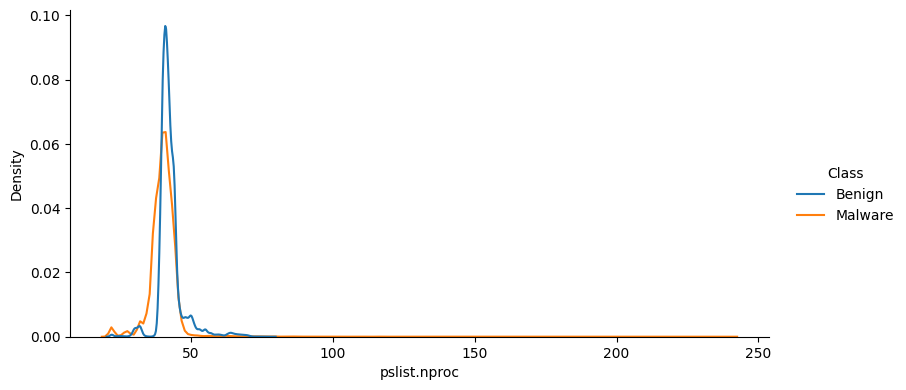

pslist.nproc                          
                   mean median       std  max min
Category                                         
Benign        42.544251   42.0  4.677373   78  22
Ransomware    40.833403   40.0  7.182485  188  22
Spyware       39.889908   40.0  7.650945  188  21
Trojan        40.054852   40.0  3.999597  240  22

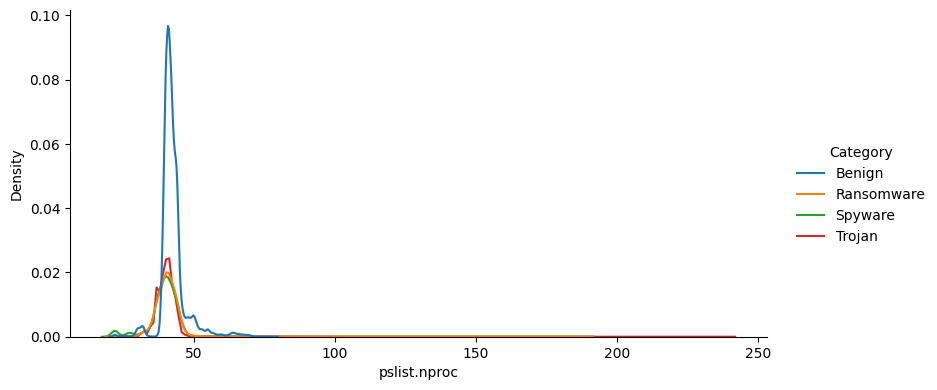

pslist.nproc                           
                     mean median        std  max min
Family                                              
180solutions    39.742371   40.0   3.714830   63  22
Ako             41.831000   40.0  11.026343  188  31
Benign          42.544251   42.0   4.677373   78  22
CWS             42.280000   41.0   9.233701  162  31
Conti           39.879718   40.0   3.117718   57  22
Emotet          40.251652   41.0   3.107962   48  22
Gator           40.813942   41.0   3.404048   48  22
Maze            40.995439   41.0   7.767513  180  22
Pysa            41.294331   41.0   7.512306  176  22
Reconyc         40.373087   41.0   6.806222  240  22
Refroso         39.611723   40.0   2.572272   47  31
Scar            40.273500   41.0   2.750542   58  31
Shade           40.293371   41.0   3.424974   52  25
TIBS            33.823864   37.0   7.841823   58  22
Transponder     40.808634   40.0   9.103246  188  21
Zeus            39.829656   39.0   3.983246   98  31

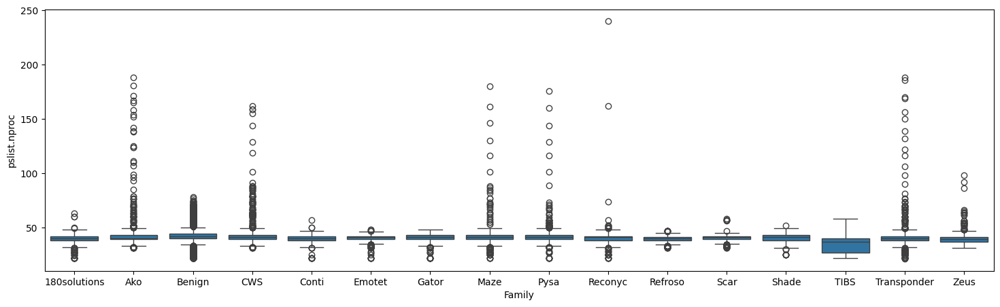

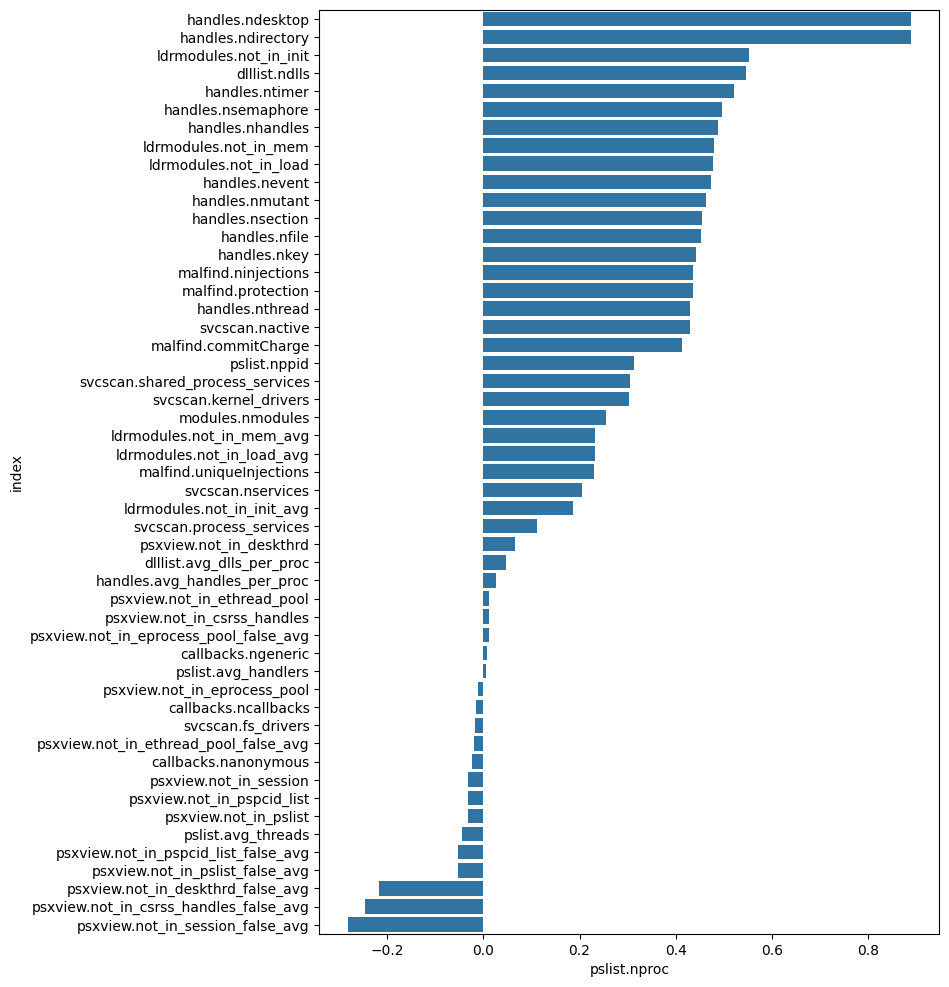

,pslist.nppid
mean,14.709511
median,15.000000
std,2.661170
max,72.000000
min,8.000000


pslist.nppid                         
                mean median       std max min
Class                                        
Benign     13.575109   12.0  2.423985  25   8
Malware    15.860251   16.0  2.382409  72   8

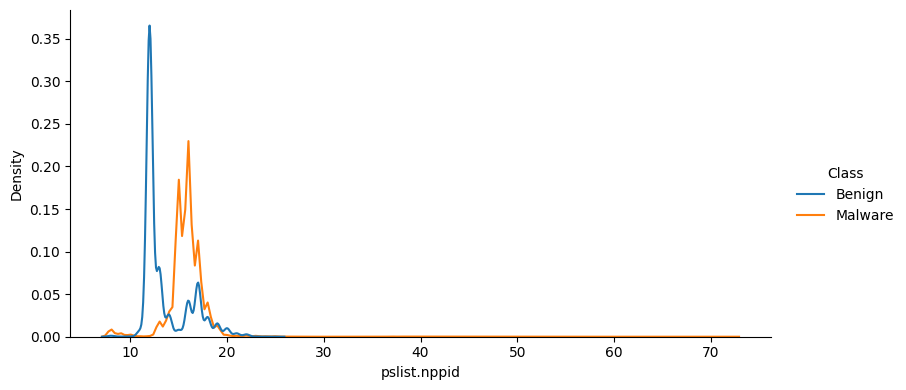

pslist.nppid                         
                   mean median       std max min
Category                                        
Benign        13.575109   12.0  2.423985  25   8
Ransomware    15.924627   16.0  1.449405  27   8
Spyware       15.821713   16.0  3.493395  66   8
Trojan        15.835443   16.0  1.583665  72   8

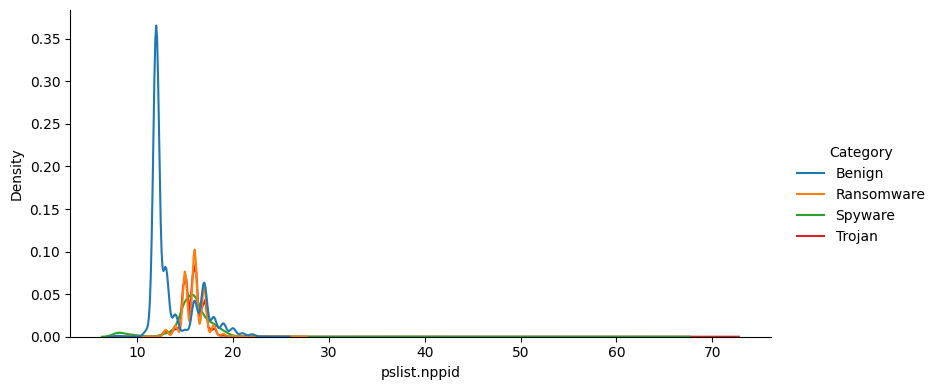

pslist.nppid                         
                     mean median       std max min
Family                                            
180solutions    15.778389   16.0  1.679355  25   8
Ako             16.054500   16.0  1.482777  27  13
Benign          13.575109   12.0  2.423985  25   8
CWS             17.110000   16.0  5.773696  66  12
Conti           15.667841   16.0  1.162258  22   8
Emotet          15.788002   16.0  1.154538  19   8
Gator           16.486459   16.0  1.683445  19   8
Maze            15.840365   16.0  1.502100  25   8
Pysa            16.216526   16.0  1.779191  26   8
Reconyc         15.755740   16.0  1.186891  19   8
Refroso         15.974449   16.0  1.269992  20  13
Scar            15.815500   16.0  0.954419  18  13
Shade           15.884344   16.0  1.266388  21  11
TIBS            13.013494   15.0  3.524384  22   8
Transponder     15.879203   16.0  1.932611  27   8
Zeus            15.825552   15.0  2.666690  72  13

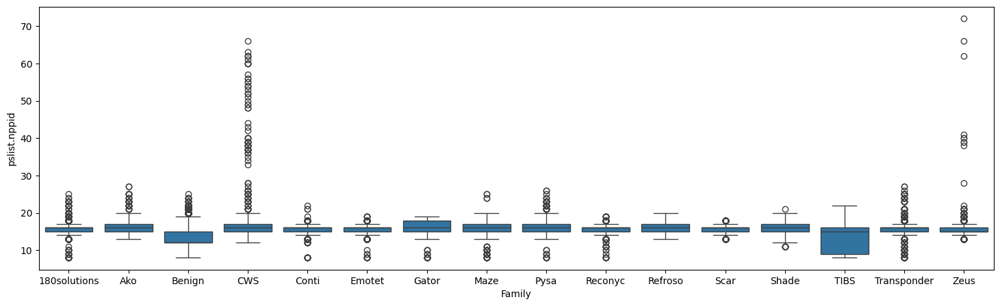

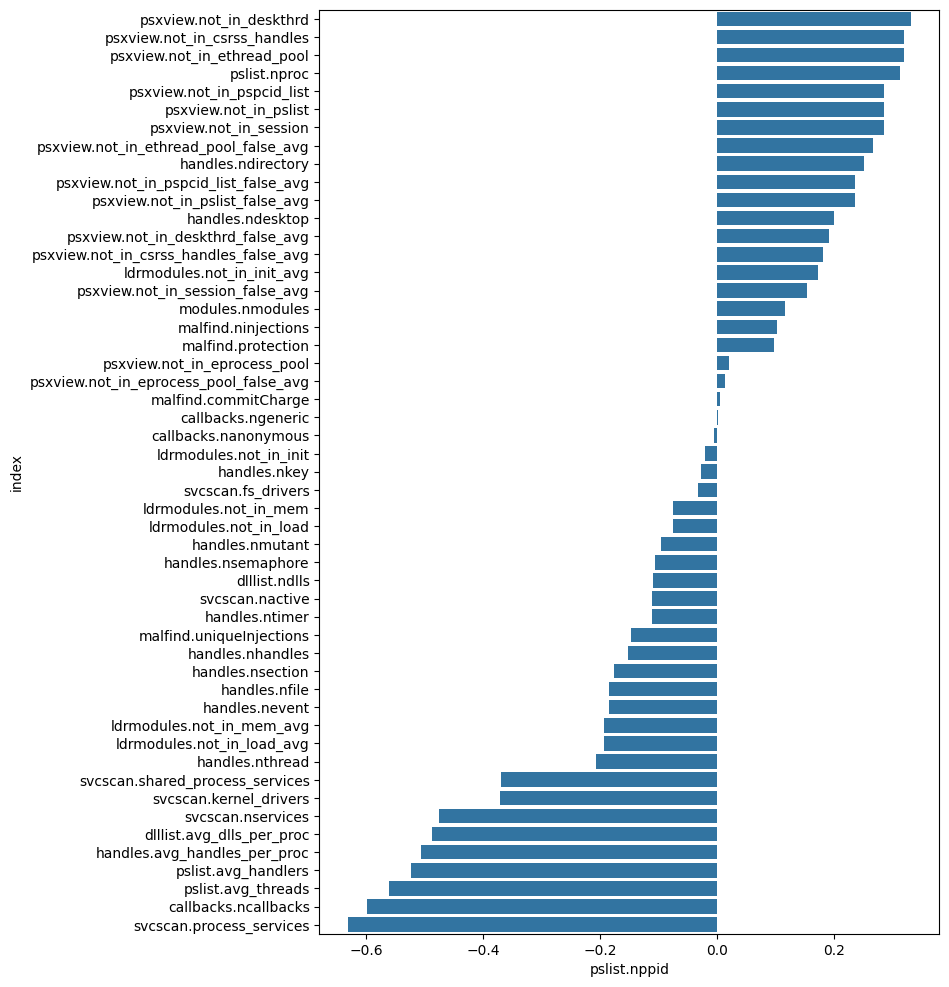

,pslist.avg_threads
mean,11.350717
median,11.022948
std,1.587687
max,16.818182
min,1.650000


pslist.avg_threads                                          
                      mean     median       std        max       min
Class                                                               
Benign           12.597527  12.838170  0.968797  16.409091  9.058824
Malware          10.085951   9.973684  0.974240  16.818182  1.650000

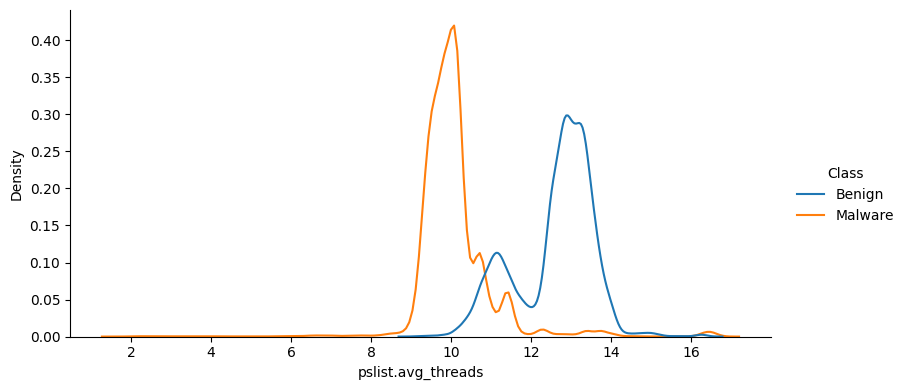

pslist.avg_threads                                          
                         mean     median       std        max       min
Category                                                               
Benign              12.597527  12.838170  0.968797  16.409091  9.058824
Ransomware           9.947460   9.902439  0.827135  16.500000  1.994681
Spyware             10.258749  10.000000  1.295207  16.818182  1.994681
Trojan              10.046301   9.974359  0.640388  16.727273  1.650000

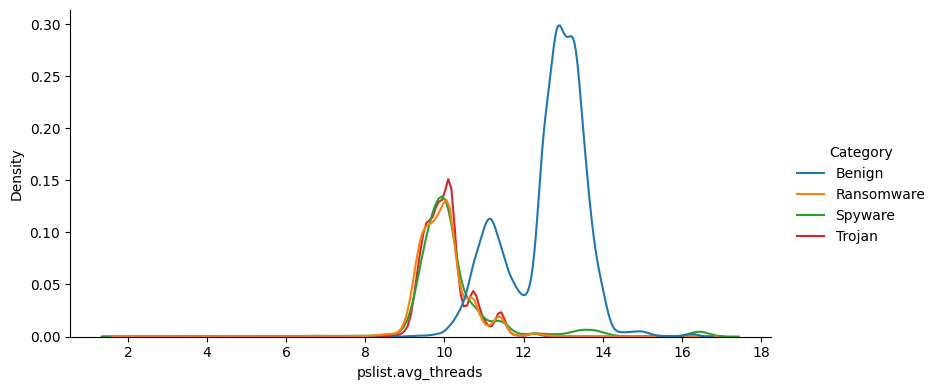

pslist.avg_threads                                          
                           mean     median       std        max       min
Family                                                                   
180solutions          10.096402  10.000000  0.787684  16.818182  7.476190
Ako                    9.922114   9.973684  0.977152  12.875000  1.994681
Benign                12.597527  12.838170  0.968797  16.409091  9.058824
CWS                    9.878692   9.885042  0.791662  12.468750  3.194969
Conti                 10.022421   9.947368  0.663259  16.500000  7.982456
Emotet                 9.999775   9.875000  0.672645  16.727273  9.068182
Gator                  9.993735   9.847826  0.662334  16.363636  9.044444
Maze                   9.928820   9.887626  0.959286  16.045455  2.127778
Pysa                   9.898580   9.900000  0.851063  16.363636  2.227273
Reconyc               10.020211   9.897436  0.815097  16.363636  1.650000
Refroso               10.113530  10.025641  0.549306  12.656250  8.840909
Scar                  10.013614   9.909091  0.589018  12.468750  6.052632
Shade                  9.954738   9.866667  0.651979  14.840000  8.538462
TIBS                  11.675295  10.467818  2.270394  16.727273  7.793103
Transponder           10.100422  10.022727  1.012474  16.590909  1.994681
Zeus                  10.078941  10.054054  0.574367  12.343750  6.653061

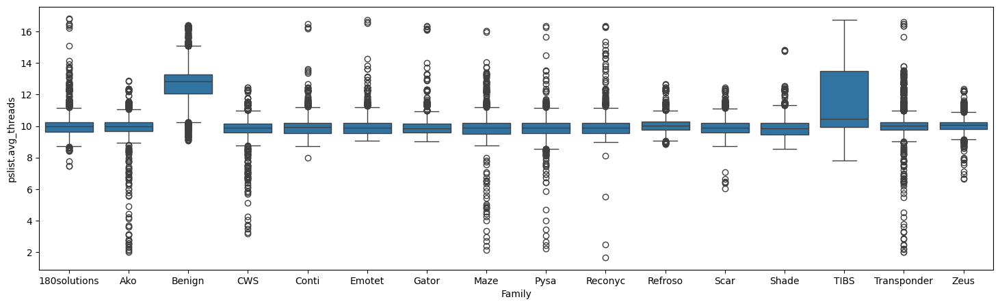

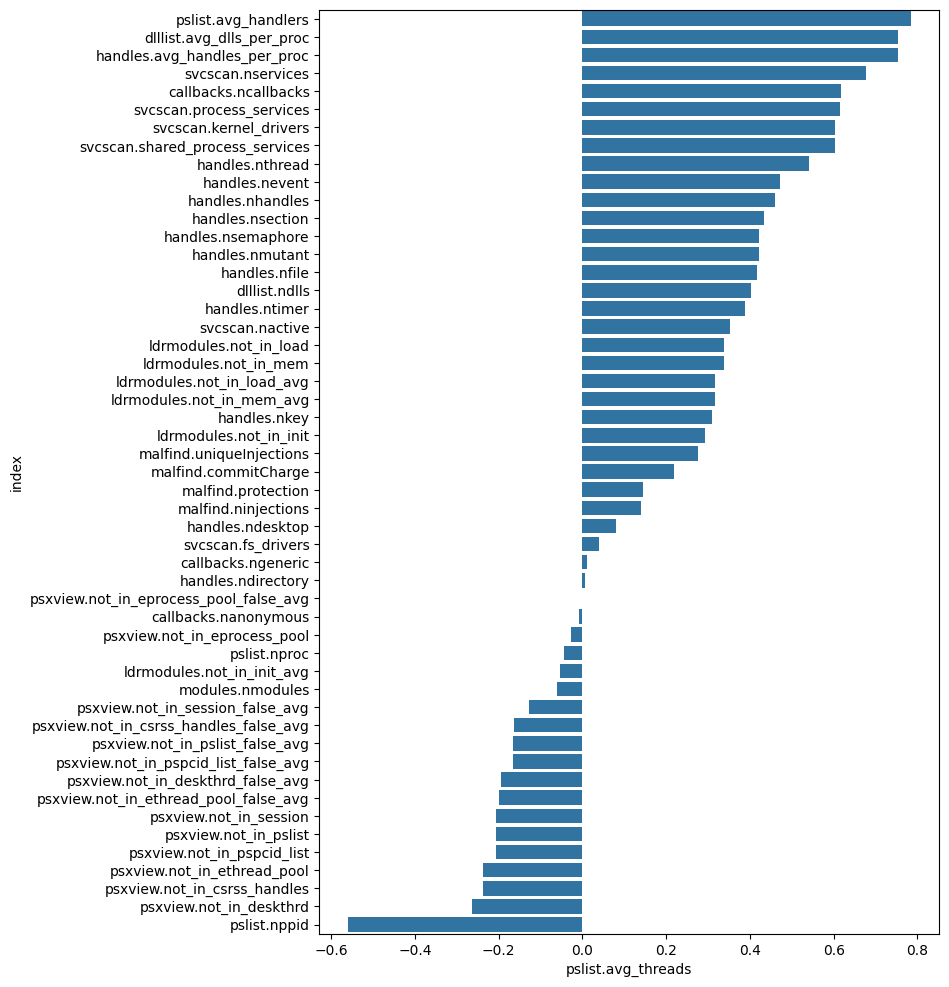

,pslist.avg_handlers
mean,247.811707
median,244.808456
std,112.298354
max,24845.951220
min,34.962500


pslist.avg_handlers                                                  
                       mean      median         std           max         min
Class                                                                        
Benign           284.880241  289.648862   18.940804    318.162791  201.371795
Malware          210.209322  208.738095  149.104260  24845.951220   34.962500

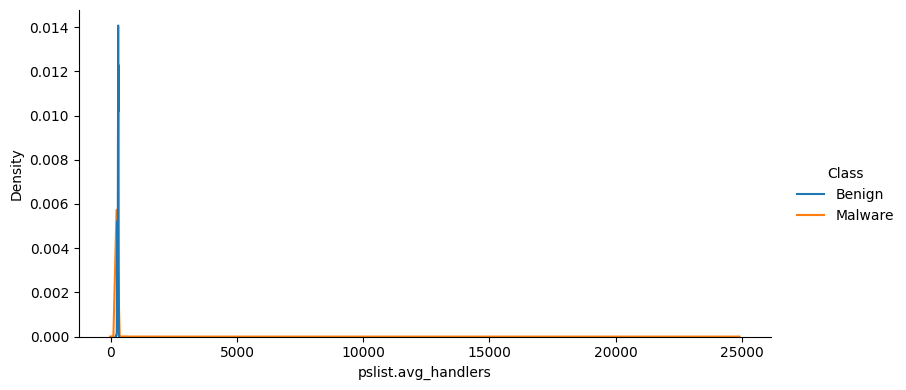

pslist.avg_handlers                                        \
                          mean      median         std           max   
Category                                                               
Benign              284.880241  289.648862   18.940804    318.162791   
Ransomware          210.316867  208.451190  254.717758  24845.951220   
Spyware             211.306462  209.243902   40.965234   1091.025000   
Trojan              208.965923  208.625000   25.444718    783.314286   

                        
                   min  
Category                
Benign      201.371795  
Ransomware   44.186170  
Spyware      44.101064  
Trojan       34.962500

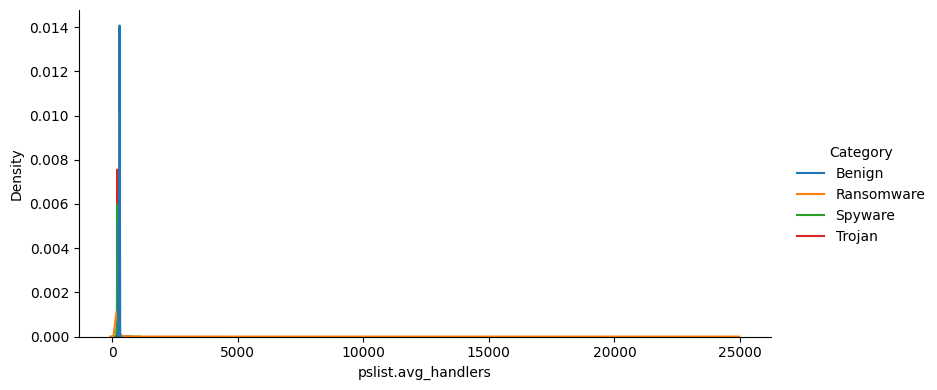

pslist.avg_handlers                                        \
                            mean      median         std           max   
Family                                                                   
180solutions          219.030859  209.261905   81.949209   1091.025000   
Ako                   206.273754  209.512195   24.381146    585.289474   
Benign                284.880241  289.648862   18.940804    318.162791   
CWS                   206.159376  208.851829   18.800738    589.142857   
Conti                 212.290902  208.175000   54.814297   1174.536585   
Emotet                205.660672  205.333333   12.644527    549.000000   
Gator                 204.794719  203.220779   10.117394    260.629630   
Maze                  206.043095  207.780488   17.118563    272.720000   
Pysa                  220.513198  208.642857  605.324803  24845.951220   
Reconyc               215.316759  207.023533   58.083849    783.314286   
Refroso               208.799541  209.158929    7.442482    222.000000   
Scar                  207.148547  208.231548    9.597711    238.162162   
Shade                 207.850714  206.428571   37.003694   1087.131579   
TIBS                  221.327605  214.333591   24.066269    270.680000   
Transponder           208.702789  210.230769   19.365175    273.000000   
Zeus                  209.227681  210.525000    8.771615    224.487179   

                          
                     min  
Family                    
180solutions  143.936508  
Ako            44.186170  
Benign        201.371795  
CWS            69.949686  
Conti         160.596491  
Emotet        168.216216  
Gator         168.108108  
Maze           50.377778  
Pysa           51.750000  
Reconyc        34.962500  
Refroso       170.771429  
Scar          107.403509  
Shade         162.230769  
TIBS          157.107143  
Transponder    44.101064  
Zeus          137.581633

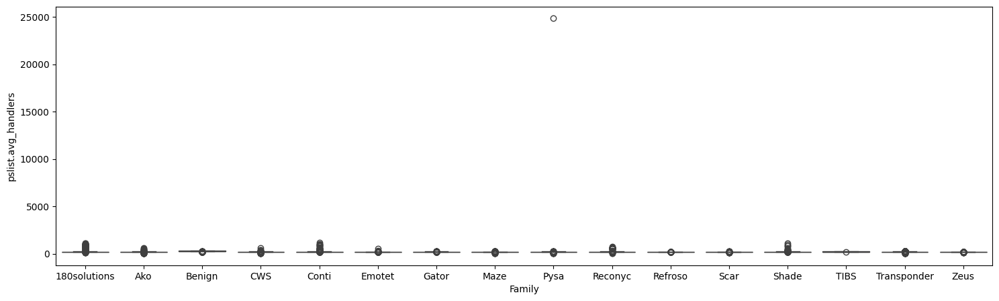

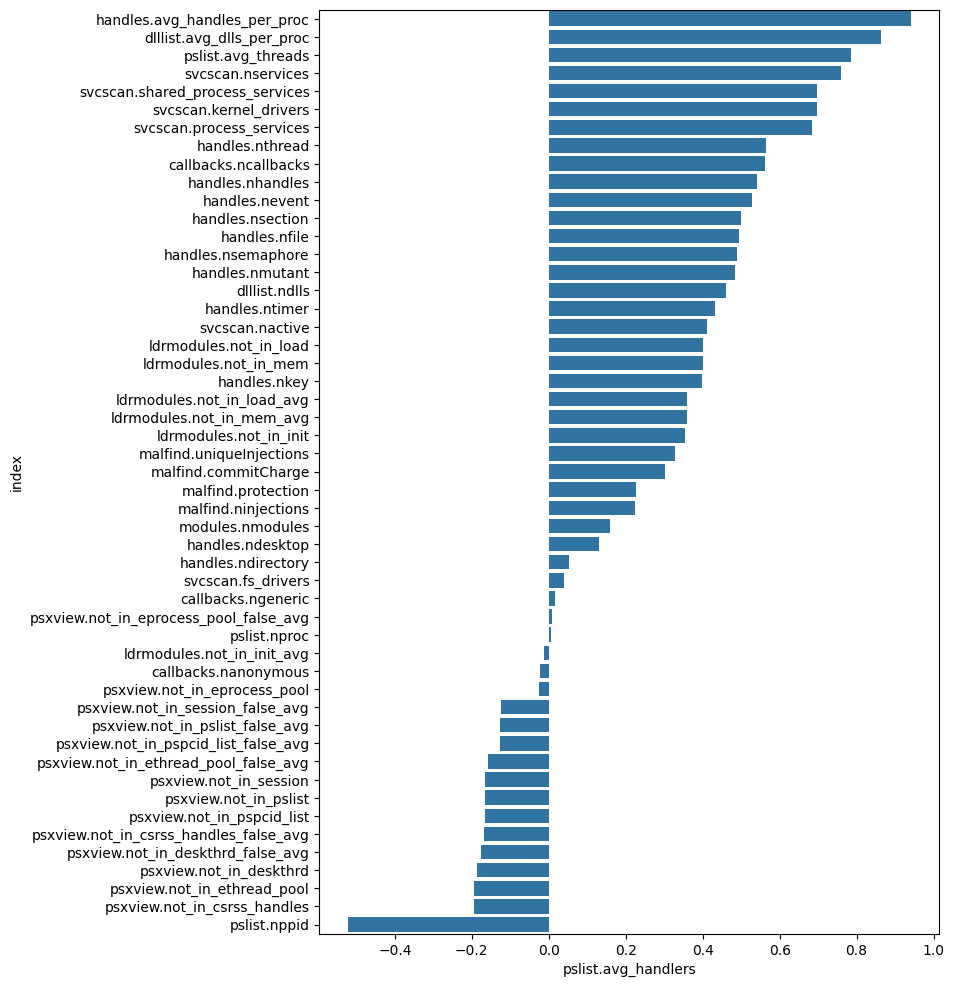

,dlllist.ndlls
mean,1813.040829
median,1739.000000
std,329.841136
max,3443.000000
min,670.000000


dlllist.ndlls                               
                 mean  median         std   max  min
Class                                               
Benign    2082.665253  2086.0  213.655439  3243  911
Malware   1539.533350  1557.0  155.881800  3443  670

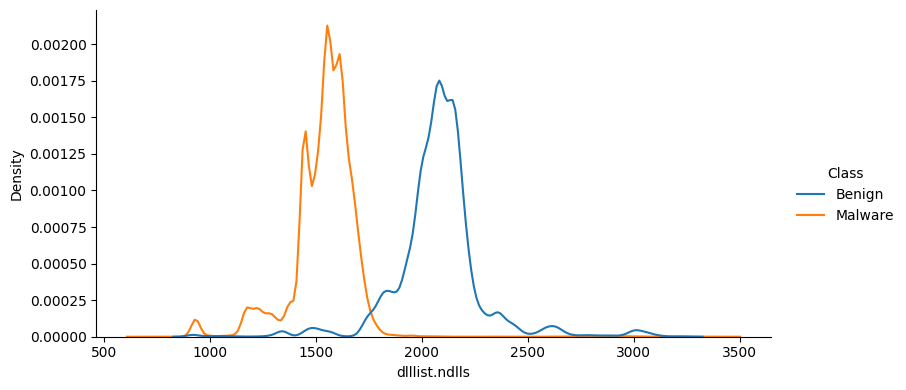

dlllist.ndlls                               
                    mean  median         std   max  min
Category                                               
Benign       2082.665253  2086.0  213.655439  3243  911
Ransomware   1545.353559  1560.0  127.736475  1903  896
Spyware      1529.670540  1556.0  203.671270  3443  670
Trojan       1543.891034  1557.0  119.961547  3050  900

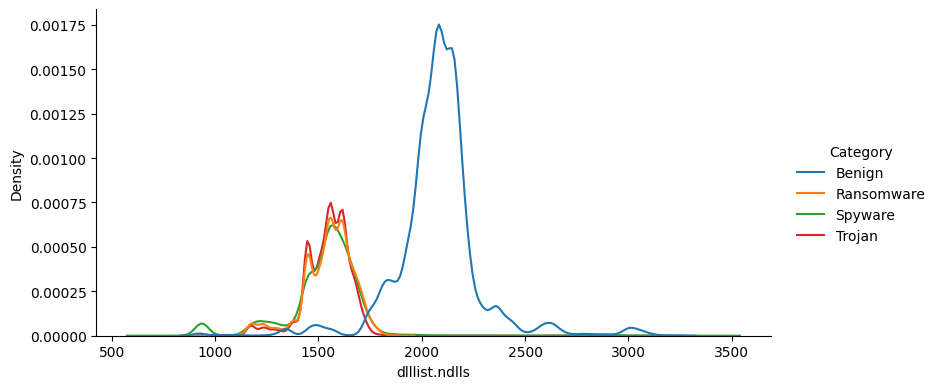

dlllist.ndlls                                
                      mean  median         std   max   min
Family                                                    
180solutions   1526.580790  1555.0  134.648582  1844   919
Ako            1557.229500  1562.5  124.392961  1868   914
Benign         2082.665253  2086.0  213.655439  3243   911
CWS            1606.631500  1576.0  259.832768  3443   776
Conti          1527.447911  1555.0  123.852833  1760   919
Emotet         1540.603457  1561.0  122.370426  1852   924
Gator          1560.383149  1576.0  121.974172  1788   917
Maze           1551.529076  1561.0  122.455480  1838   919
Pysa           1559.912545  1561.0  121.538067  1903   896
Reconyc        1543.649872  1557.0  124.817367  2446   900
Refroso        1540.864228  1557.0  105.877321  1826  1160
Scar           1552.394000  1562.0  106.149746  1925  1166
Shade          1534.472496  1563.0  139.995854  1852   991
TIBS           1346.620739  1425.5  260.048008  1823   898
Transponder    1549.906185  1557.0  142.654921  2130   670
Zeus           1541.777322  1549.0  138.702119  3050  1168

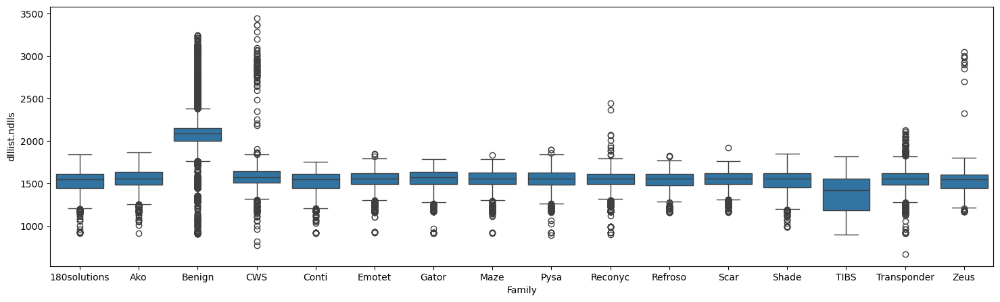

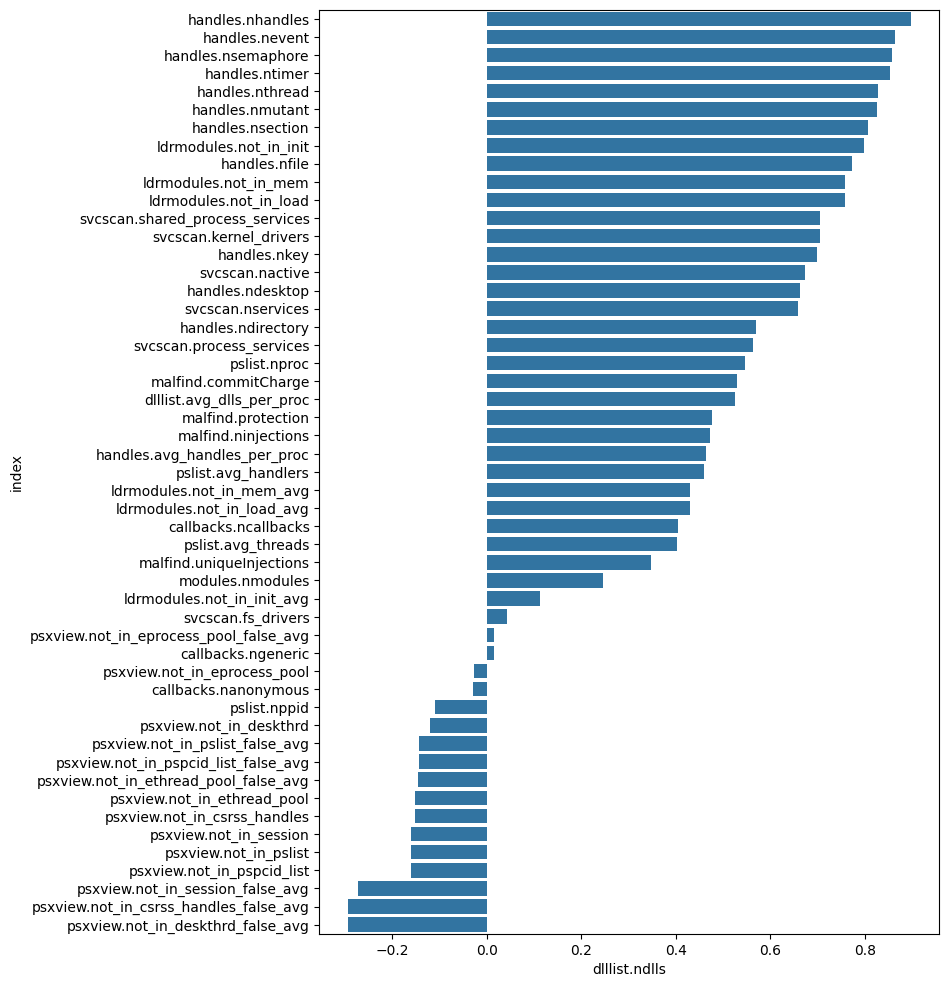

,dlllist.avg_dlls_per_proc
mean,43.746235
median,42.984462
std,5.738569
max,53.170732
min,7.333333


dlllist.avg_dlls_per_proc                                           
                             mean     median       std        max        min
Class                                                                       
Benign                  48.923975  49.597260  2.711583  53.170732  34.538462
Malware                 38.493927  38.840909  2.023730  46.968254   7.333333

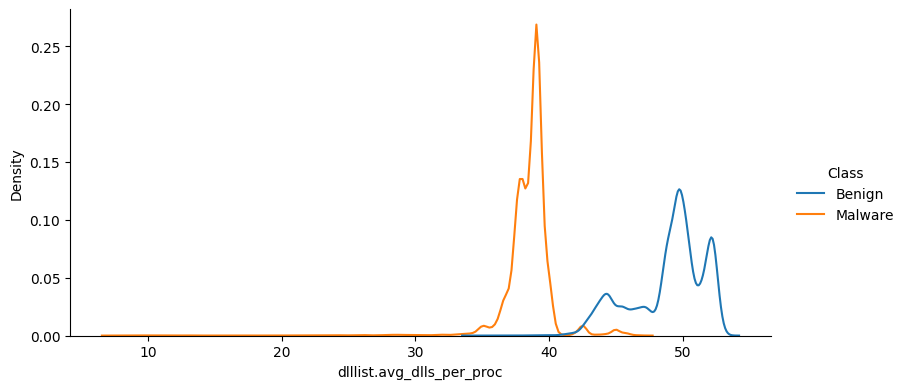

dlllist.avg_dlls_per_proc                                  \
                                mean     median       std        max   
Category                                                               
Benign                     48.923975  49.597260  2.711583  53.170732   
Ransomware                 38.195409  38.690476  2.300668  45.960000   
Spyware                    38.684141  38.875000  2.310433  46.968254   
Trojan                     38.597059  38.925000  1.212201  46.754098   

                       
                  min  
Category               
Benign      34.538462  
Ransomware   8.632979  
Spyware      8.638298  
Trojan       7.333333

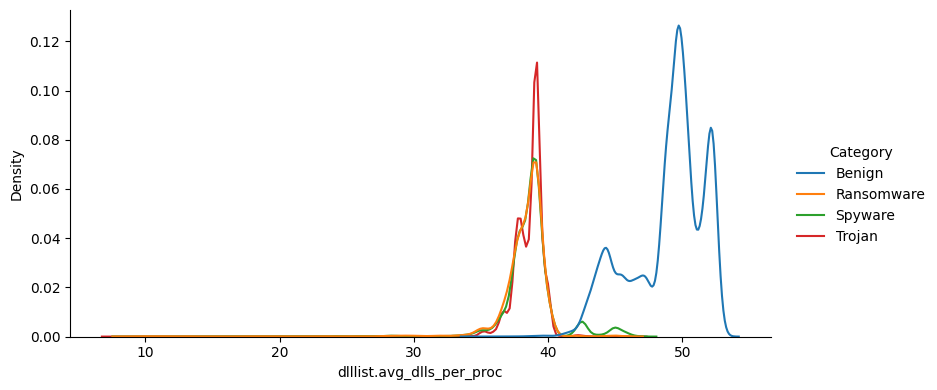

dlllist.avg_dlls_per_proc                                  \
                                  mean     median       std        max   
Family                                                                   
180solutions                 38.499538  38.925000  1.439370  45.920000   
Ako                          38.022721  38.767442  3.256024  40.380952   
Benign                       48.923975  49.597260  2.711583  53.170732   
CWS                          38.307748  38.678963  2.284059  46.968254   
Conti                        38.356345  38.625000  1.258374  44.960000   
Emotet                       38.298833  38.272727  1.085949  45.178571   
Gator                        38.291744  38.139535  1.125072  45.000000   
Maze                         38.281244  38.581395  2.660185  45.960000   
Pysa                         38.153012  38.725000  2.376687  45.107143   
Reconyc                      38.417513  38.543040  1.590073  46.392157   
Refroso                      38.897545  39.081081  0.850575  40.400000   
Scar                         38.566998  38.862051  1.243204  44.571429   
Shade                        38.169709  38.422222  1.403100  42.838710   
TIBS                         40.286921  39.263158  2.738019  45.862069   
Transponder                  38.537828  38.900000  2.910319  45.920000   
Zeus                         38.765603  39.051282  1.166913  46.754098   

                         
                    min  
Family                   
180solutions  26.833333  
Ako            8.632979  
Benign        34.538462  
CWS           20.949045  
Conti         27.263158  
Emotet        29.078947  
Gator         33.432432  
Maze           9.527778  
Pysa           9.767045  
Reconyc        7.333333  
Refroso       34.857143  
Scar          22.596491  
Shade         27.368421  
TIBS          30.000000  
Transponder    8.638298  
Zeus          27.262295

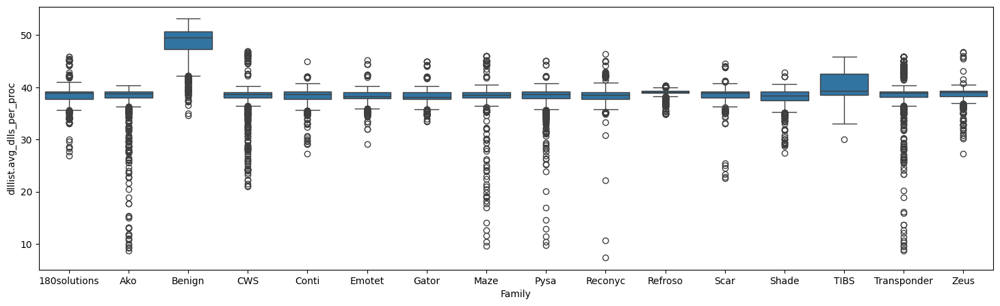

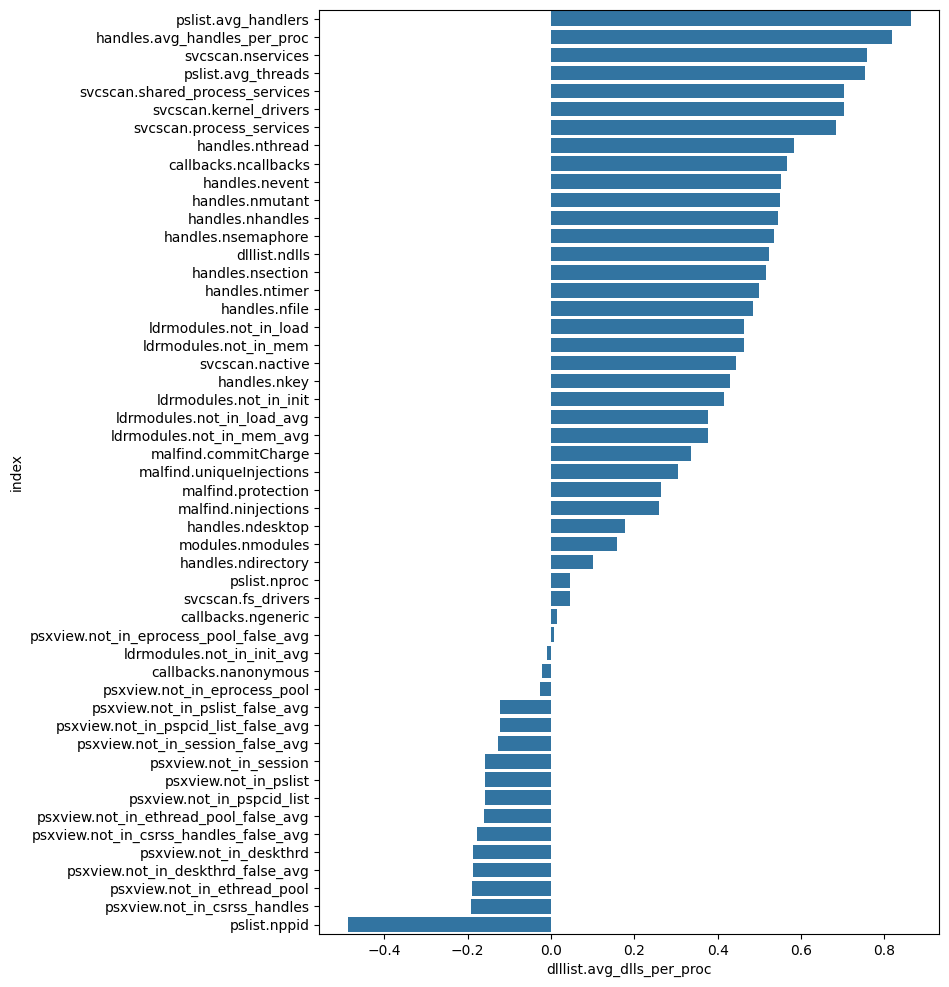

,handles.nhandles
mean,1.027472e+04
median,9.444000e+03
std,4.885071e+03
max,1.047310e+06
min,3.514000e+03


handles.nhandles                                     
                    mean   median          std      max   min
Class                                                        
Benign      12120.002600  12186.0  1171.994686    18794  5176
Malware      8402.856295   8417.0  6302.442364  1047310  3514

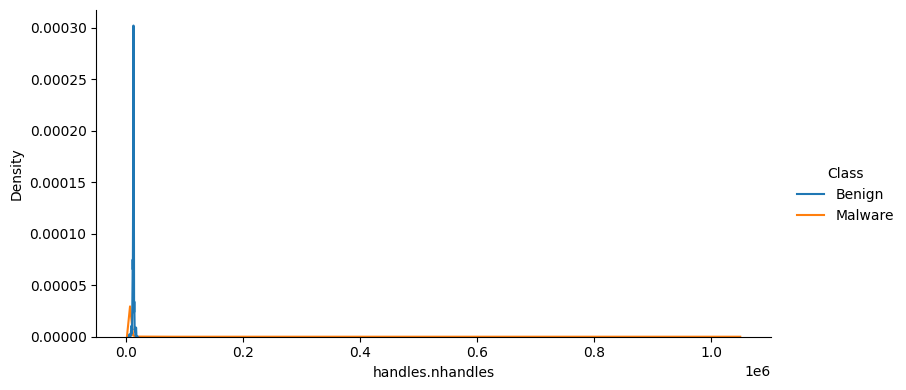

handles.nhandles                                      
                       mean   median           std      max   min
Category                                                         
Benign         12120.002600  12186.0   1171.994686    18794  5176
Ransomware      8512.119043   8469.0  10737.337937  1047310  4972
Spyware         8340.352294   8446.0   1832.076333    43641  3514
Trojan          8357.743143   8367.0   1185.312630    27416  5010

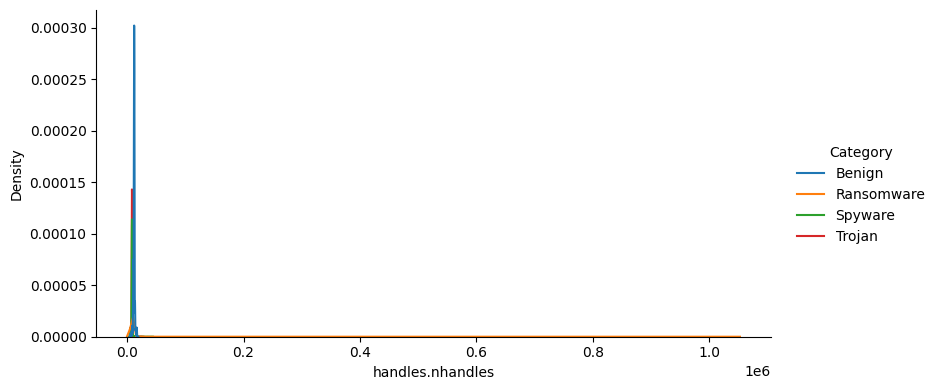

handles.nhandles                                      
                         mean   median           std      max   min
Family                                                             
180solutions      8708.590295   8375.0   3473.996114    43641  5001
Ako               8444.069500   8552.0    891.331672    22241  5813
Benign           12120.002600  12186.0   1171.994686    18794  5176
CWS               8606.938000   8556.0   1070.490523    24744  5805
Conti             8463.356819   8355.0   2346.626210    48156  5073
Emotet            8272.770717   8384.0    810.269839    25809  5087
Gator             8343.277834   8505.0    645.322811     9510  4982
Maze              8341.815279   8470.0    622.062381     9505  4972
Pysa              9028.928227   8517.5  25521.845823  1047310  4975
Reconyc           8660.269770   8353.0   2501.966060    27416  5010
Refroso           8268.533066   8349.0    553.817700     9441  5807
Scar              8336.926500   8424.5    596.267921    10018  5806
Shade             8359.243065   8423.0   1544.270776    41311  5234
TIBS              7355.174006   7691.0   1326.958313     9599  4982
Transponder       8386.852221   8484.0    769.970712    11887  3514
Zeus              8312.835813   8354.0    606.585712    13541  5827

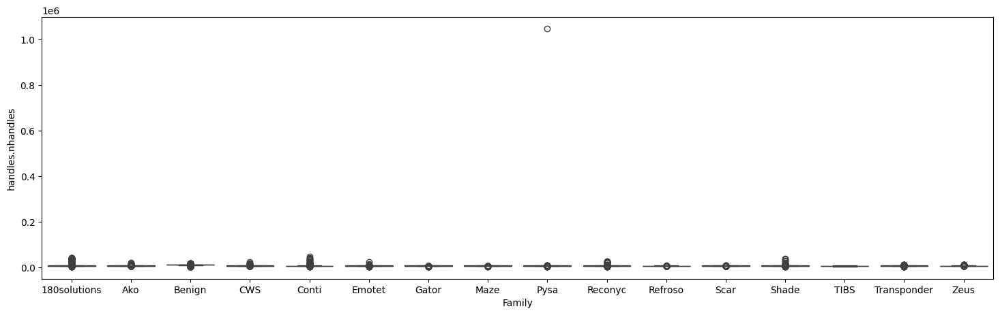

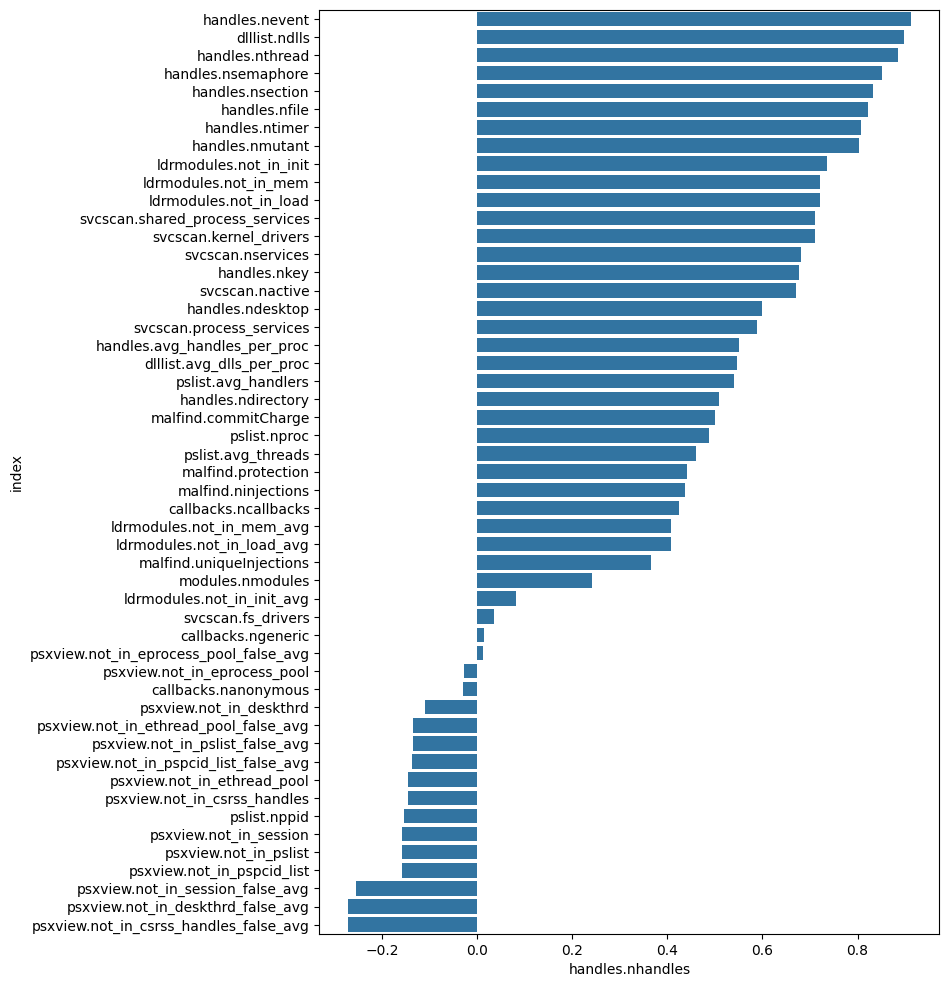

,handles.avg_handles_per_proc
mean,249.863197
median,248.336575
std,146.627514
max,33784.193550
min,71.139241


handles.avg_handles_per_proc                                        \
                                mean      median         std           max   
Class                                                                        
Benign                    286.780925  291.257965   17.466239    318.162791   
Malware                   212.413791  209.675000  200.536978  33784.193550   

                     
                min  
Class                
Benign   208.270833  
Malware   71.139241

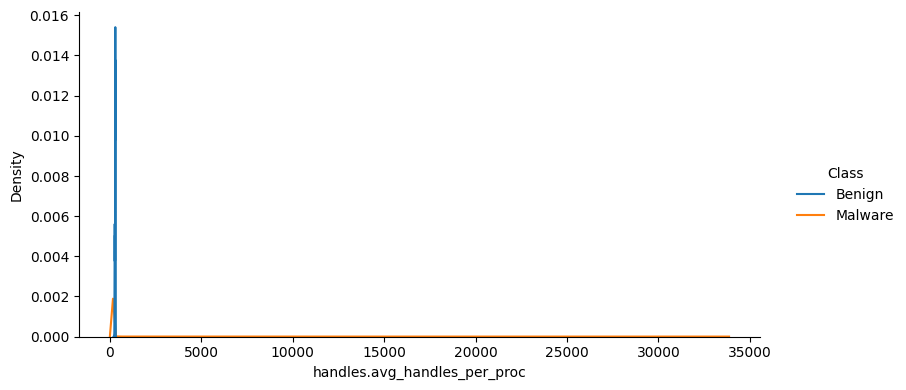

handles.avg_handles_per_proc                                        \
                                   mean      median         std           max   
Category                                                                        
Benign                       286.780925  291.257965   17.466239    318.162791   
Ransomware                   213.950072  209.300000  345.493950  33784.193550   
Spyware                      213.415395  210.558481   39.989970   1091.025000   
Trojan                       209.833586  209.059884   25.271459    783.314286   

                        
                   min  
Category                
Benign      208.270833  
Ransomware  142.078125  
Spyware      71.139241  
Trojan      161.692308

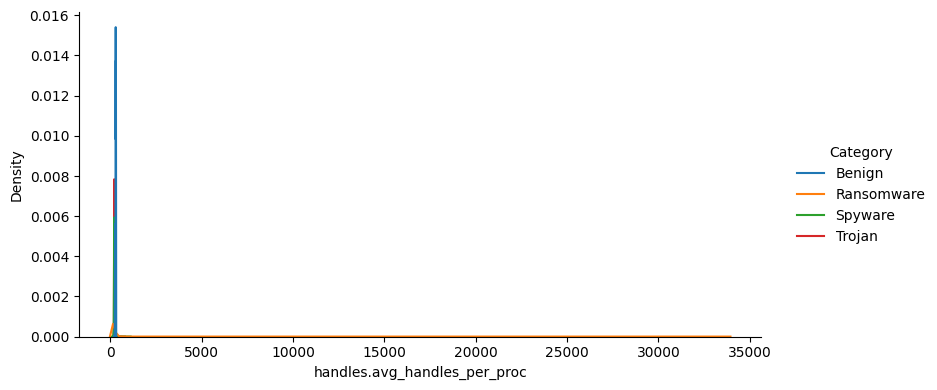

handles.avg_handles_per_proc                          \
                                     mean      median         std   
Family                                                              
180solutions                   220.458592  210.317073   81.770243   
Ako                            211.210629  212.683569   17.704465   
Benign                         286.780925  291.257965   17.466239   
CWS                            209.967313  211.551282   16.660949   
Conti                          213.156205  208.675000   54.769336   
Emotet                         206.483731  206.272727   13.890335   
Gator                          205.182955  204.307895   10.012870   
Maze                           208.859387  208.296341   11.216607   
Pysa                           229.560435  210.537679  824.619568   
Reconyc                        216.339537  208.450000   57.732611   
Refroso                        209.313491  209.802439    7.119214   
Scar                           208.087750  209.108304    8.507992   
Shade                          209.297215  208.487805   36.868110   
TIBS                           222.317854  215.126587   23.359147   
Transponder                    212.044549  213.000000   13.371146   
Zeus                           210.304399  211.878049    7.521024   

                                        
                       max         min  
Family                                  
180solutions   1091.025000  168.944444  
Ako             585.289474  151.711111  
Benign          318.162791  208.270833  
CWS             589.142857   71.139241  
Conti          1174.536585  168.702703  
Emotet          629.487805  168.216216  
Gator           260.629630  168.081081  
Maze            272.720000  172.714286  
Pysa          33784.193550  142.078125  
Reconyc         783.314286  171.857143  
Refroso         222.000000  170.771429  
Scar            238.162162  161.692308  
Shade          1087.131579  168.567568  
TIBS            270.680000  164.540540  
Transponder     273.000000  151.152174  
Zeus            224.487179  168.796296

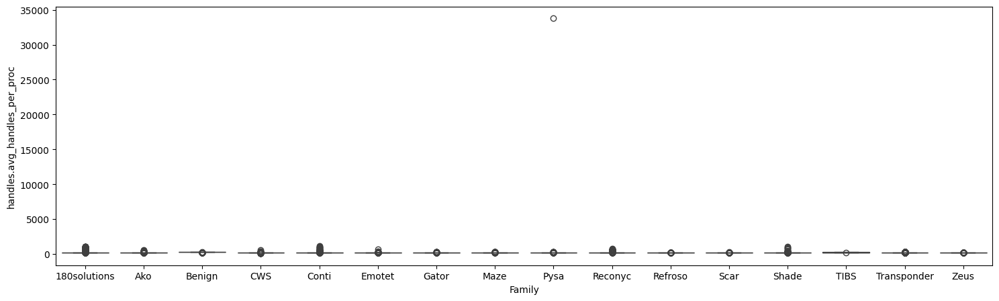

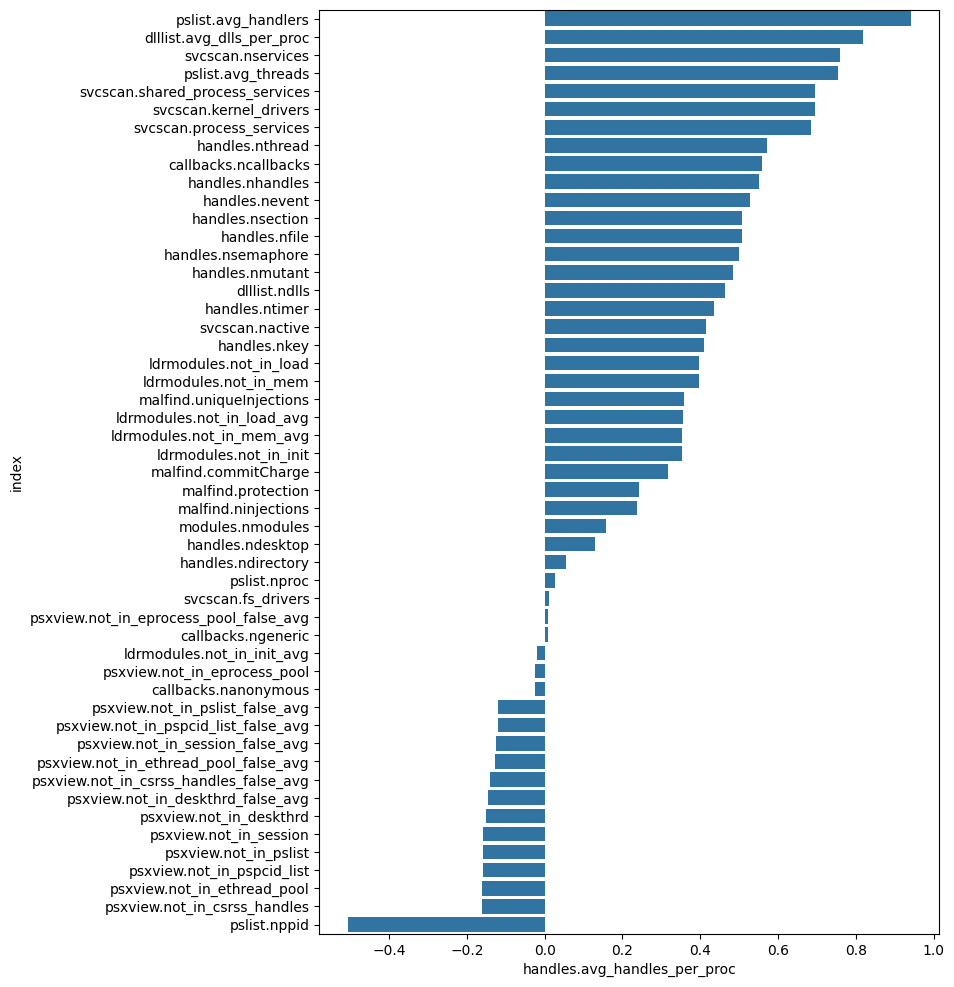

,handles.nfile
mean,901.132117
median,840.000000
std,3448.455209
max,807008.000000
min,266.000000


handles.nfile                                  
                 mean  median          std     max  min
Class                                                  
Benign    1049.833499  1080.0   131.695921    1678  405
Malware    750.289180   646.0  4888.004602  807008  266

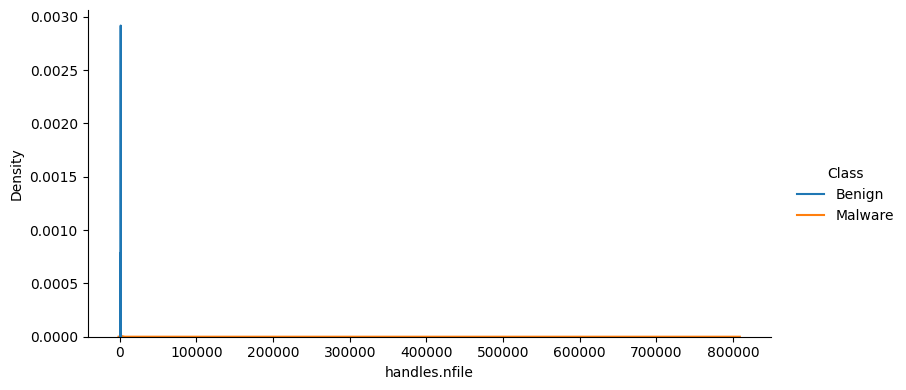

handles.nfile                                  
                    mean  median          std     max  min
Category                                                  
Benign       1049.833499  1080.0   131.695921    1678  405
Ransomware    841.355133   648.0  8354.837563  807008  358
Spyware       762.528236   646.0  1542.233155   36124  266
Trojan        646.116245   645.0    88.672017    6784  347

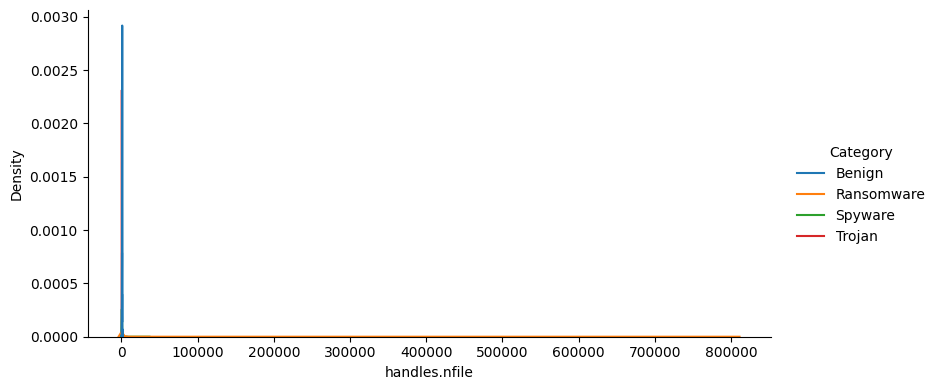

handles.nfile                                   
                      mean  median           std     max  min
Family                                                       
180solutions   1107.941971   645.0   3372.763001   36124  413
Ako             729.453500   650.0    574.028042   15011  548
Benign         1049.833499  1080.0    131.695921    1678  405
CWS             722.118500   660.0    349.685326   10511  549
Conti           889.760443   645.0   2236.361533   40605  456
Emotet          653.195730   649.0    185.719740    6784  470
Gator           647.598295   651.0     28.564706     710  414
Maze            667.710946   649.0     76.884562    1495  409
Pysa           1165.974065   647.0  19802.672664  807008  358
Reconyc         646.327168   648.0     33.094276     906  347
Refroso         639.109218   642.0     20.280764     707  548
Scar            647.056500   648.0     23.437128     708  548
Shade           791.508228   650.0   1409.987502   35242  449
TIBS            615.916903   623.0    121.366190    1067  354
Transponder     690.272727   646.0    100.857531    1240  266
Zeus            645.012827   640.0     38.478711     955  551

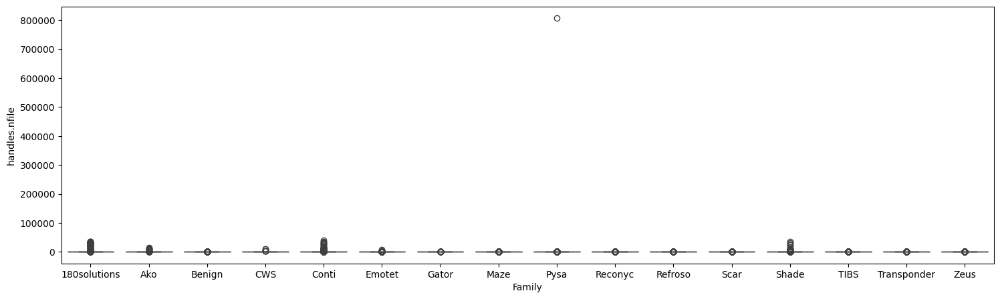

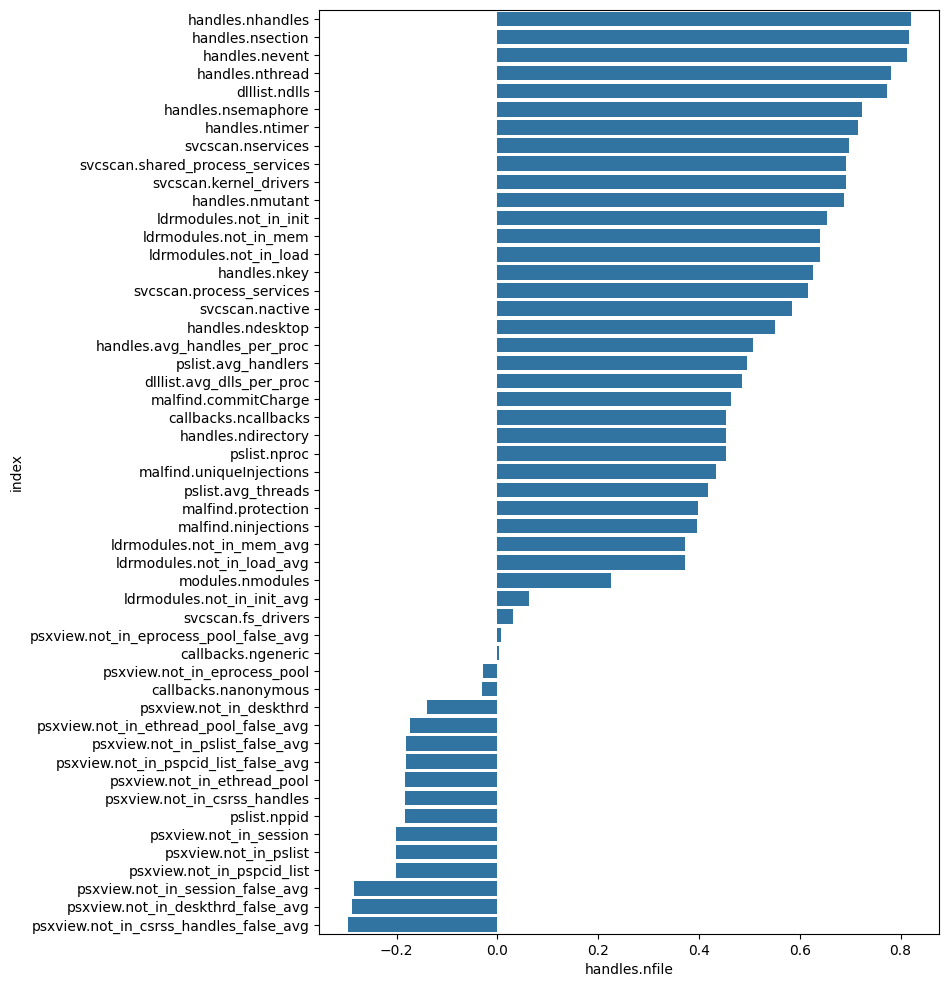

,handles.nevent
mean,3578.058659
median,3177.000000
std,805.464249
max,7892.000000
min,966.000000


handles.nevent                                
                  mean  median         std   max   min
Class                                                 
Benign     4278.939722  4322.0  465.809494  7892  1636
Malware    2867.083703  2925.0  288.060814  4357   966

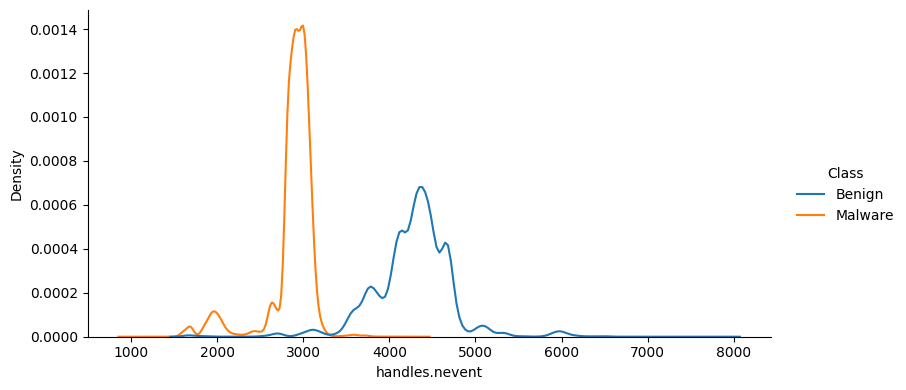

handles.nevent                                
                     mean  median         std   max   min
Category                                                 
Benign        4278.939722  4322.0  465.809494  7892  1636
Ransomware    2878.549759  2929.0  262.289431  4357  1568
Spyware       2833.452192  2923.0  347.203143  3982   966
Trojan        2890.364241  2923.0  237.749742  4074  1599

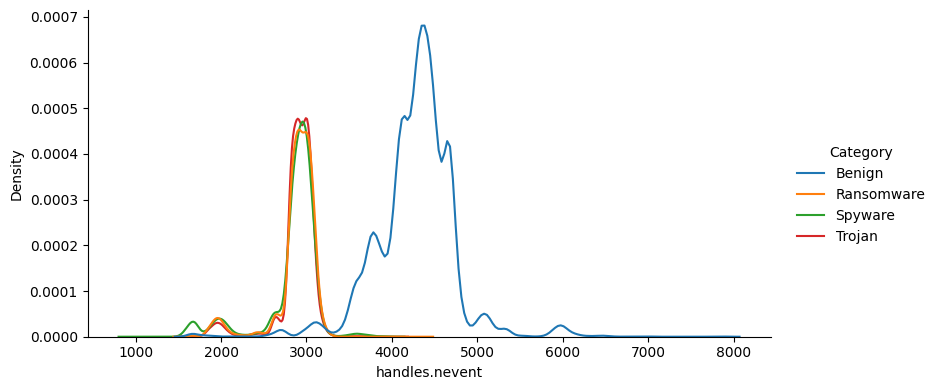

handles.nevent                                
                       mean  median         std   max   min
Family                                                     
180solutions    2848.605803  2920.0  296.854123  3300  1589
Ako             2894.369000  2932.0  242.444469  3269  1840
Benign          4278.939722  4322.0  465.809494  7892  1636
CWS             2929.702500  2944.0  236.175296  3887  1841
Conti           2859.395571  2919.0  270.705956  3213  1650
Emotet          2870.682766  2929.0  275.305248  3449  1623
Gator           2889.736710  2951.0  254.802804  3233  1587
Maze            2894.417332  2931.5  231.576620  3286  1576
Pysa            2907.495778  2934.0  222.201913  4357  1568
Reconyc         2891.845026  2923.0  259.564506  4074  1599
Refroso         2884.561122  2918.0  217.225032  3232  1836
Scar            2905.073500  2941.0  238.902410  3384  1831
Shade           2845.920075  2931.0  315.106932  3282  1672
TIBS            2503.553977  2697.0  529.558980  3263  1570
Transponder     2887.197592  2926.0  277.508394  3982   966
Zeus            2899.885069  2918.0  191.644156  3744  1836

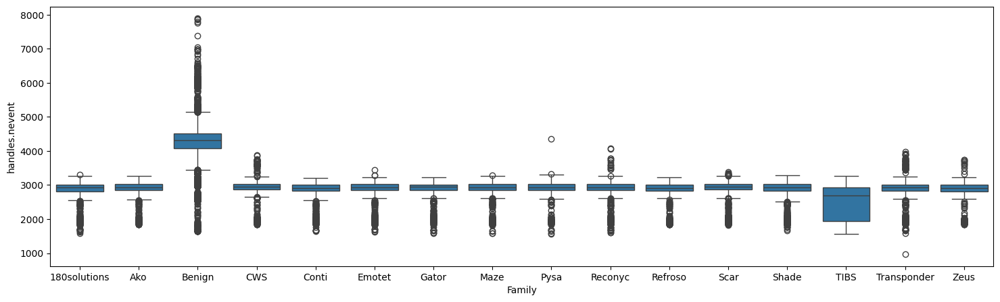

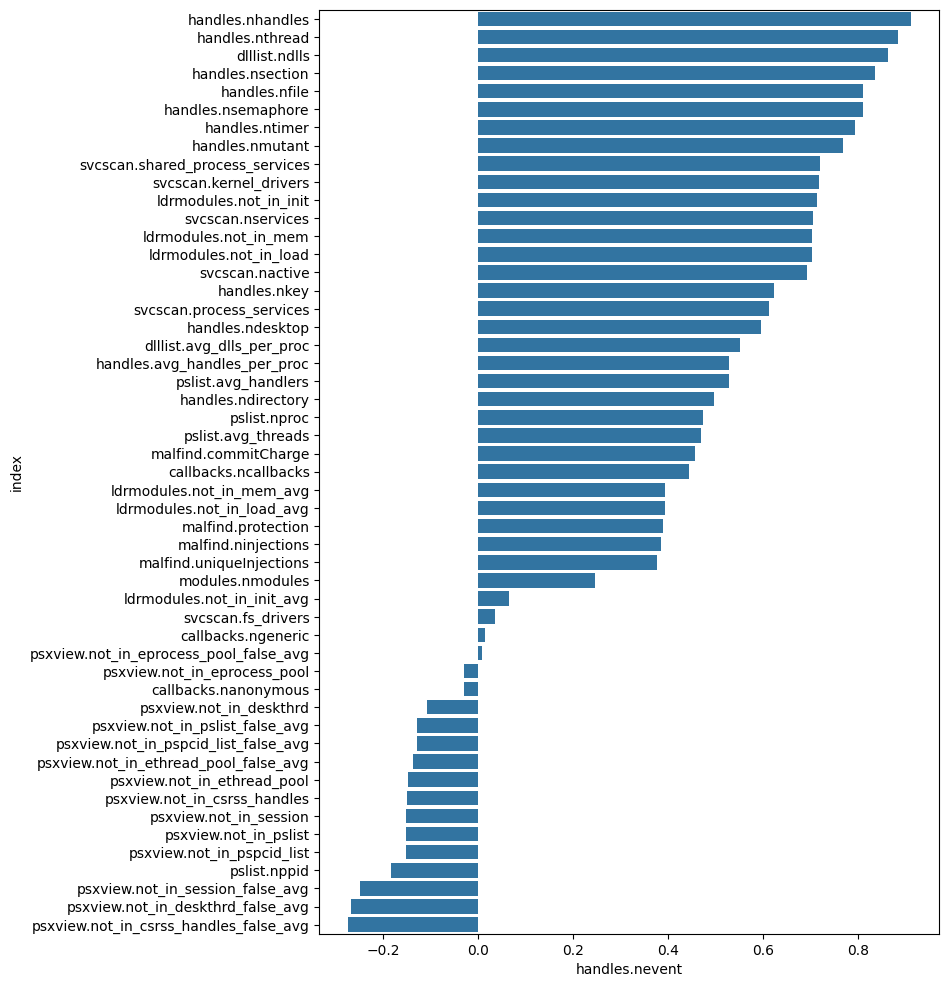

,handles.ndesktop
mean,44.550209
median,45.000000
std,5.162780
max,159.000000
min,22.000000


handles.ndesktop                          
                    mean median       std  max min
Class                                             
Benign         46.560227   46.0  4.899502   75  23
Malware        42.511244   43.0  4.592007  159  22

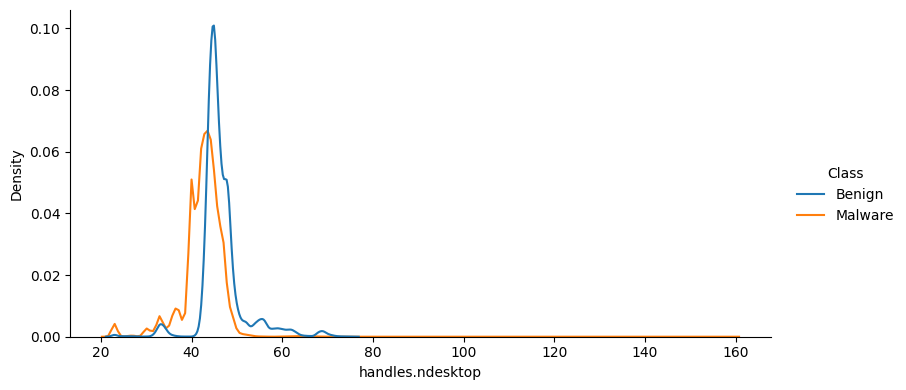

handles.ndesktop                          
                       mean median       std  max min
Category                                             
Benign            46.560227   46.0  4.899502   75  23
Ransomware        42.789523   43.0  3.653884   96  23
Spyware           42.053007   43.0  6.220655  159  22
Trojan            42.705802   43.0  3.210623   67  23

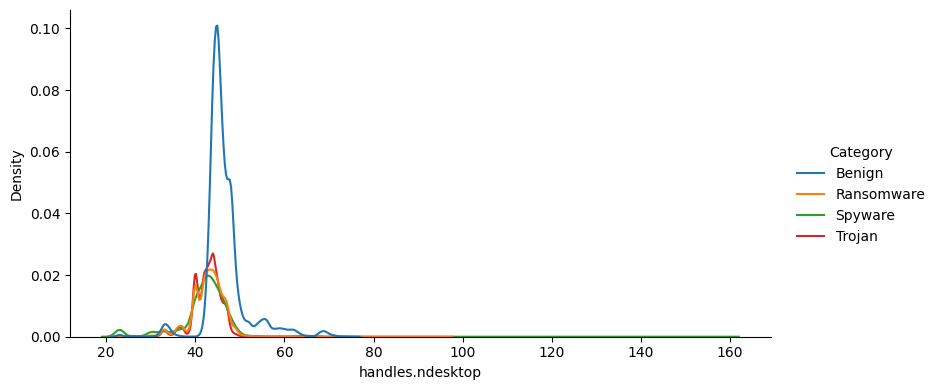

handles.ndesktop                          
                         mean median       std  max min
Family                                                 
180solutions        42.231116   43.0  3.945400   51  23
Ako                 42.824000   43.0  3.434665   53  26
Benign              46.560227   46.0  4.899502   75  23
CWS                 44.133500   43.0  7.725381  159  28
Conti               42.470559   43.0  3.472886   50  23
Emotet              42.920691   44.0  3.480042   51  23
Gator               43.589268   44.0  3.670075   50  23
Maze                42.897948   43.0  3.673088   53  23
Pysa                43.089867   43.0  3.775665   96  23
Reconyc             42.862245   43.0  3.517324   57  23
Refroso             42.391283   43.0  2.796113   49  32
Scar                42.926000   43.0  2.858953   48  32
Shade               42.731547   43.0  3.878306   53  26
TIBS                35.916903   39.0  8.282386   51  23
Transponder         42.492736   43.0  4.019374   56  22
Zeus                42.459210   42.0  3.363349   67  32

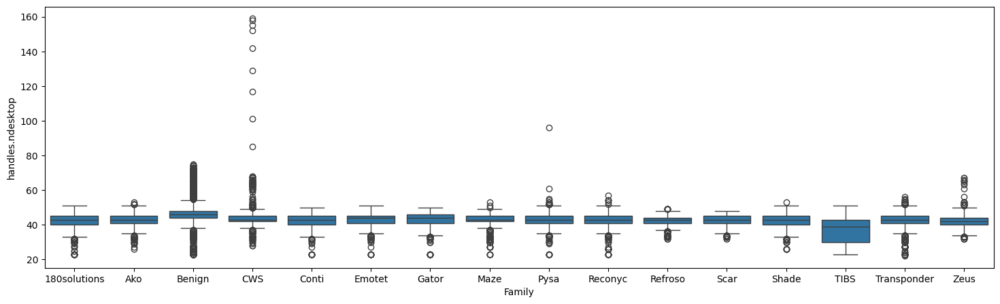

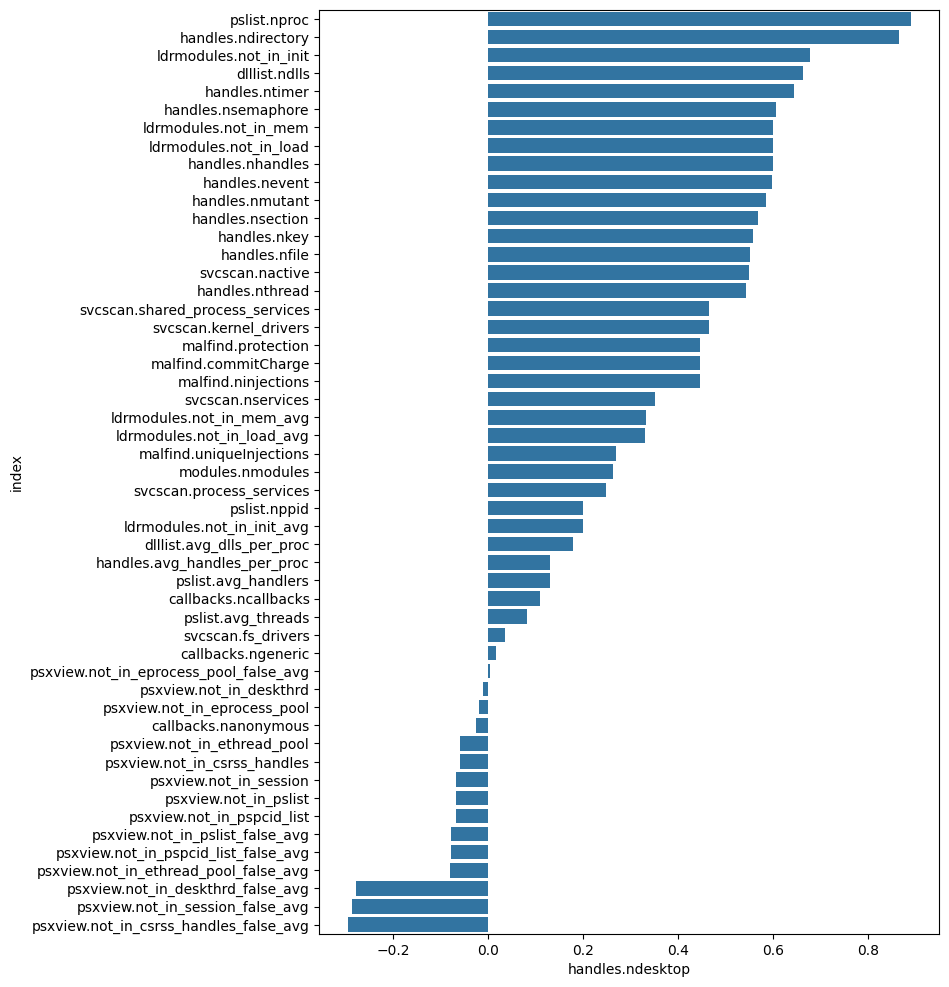

,handles.nkey
mean,775.224990
median,760.000000
std,150.520166
max,2668.000000
min,284.000000


handles.nkey                              
                mean median         std   max  min
Class                                             
Benign    879.413773  857.0  115.842483  1525  327
Malware   669.535709  676.0   99.218677  2668  284

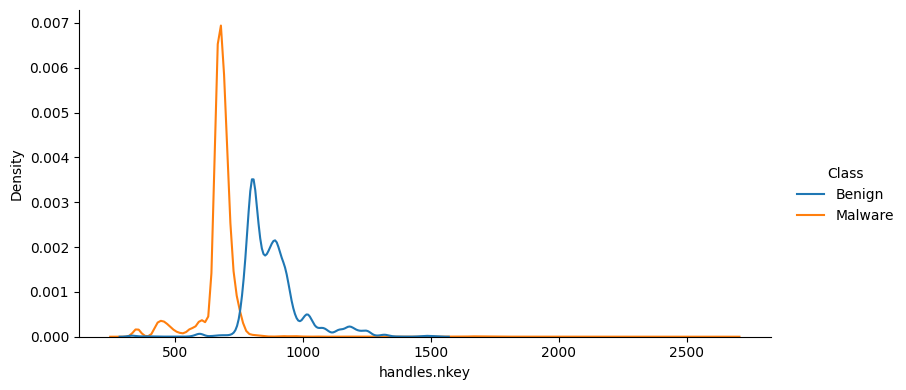

handles.nkey                              
                   mean median         std   max  min
Category                                             
Benign       879.413773  857.0  115.842483  1525  327
Ransomware   670.181083  679.0   63.645812   916  331
Spyware      668.538838  675.0  144.372068  2668  284
Trojan       669.918776  674.0   65.457145  1818  331

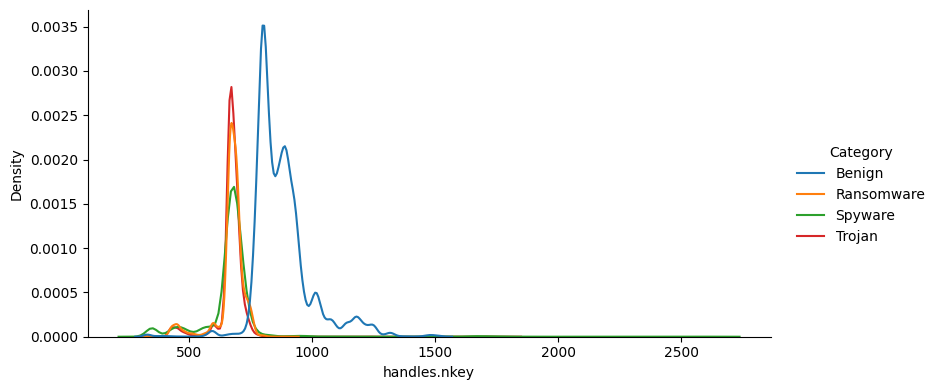

handles.nkey                              
                     mean median         std   max  min
Family                                                 
180solutions   687.647324  673.0  200.760561  2668  331
Ako            672.592500  679.0   58.783843   775  365
Benign         879.413773  857.0  115.842483  1525  327
CWS            706.859500  687.0  170.884214  1821  416
Conti          666.009562  675.0   64.797223   776  333
Emotet         665.649720  680.0   64.574079   823  337
Gator          672.361083  682.0   61.690673   760  330
Maze           673.673888  682.5   58.265740   818  331
Pysa           676.882388  679.0   54.925472   916  331
Reconyc        672.443878  682.5   65.754950  1235  331
Refroso        662.516533  669.0   48.938673   750  418
Scar           676.394000  680.0   57.980502   913  419
Shade          663.706629  679.0   75.616746   766  364
TIBS           574.732955  624.0  141.494610   854  336
Transponder    672.531341  675.0   75.348333  1066  284
Zeus           673.131862  667.0   84.422343  1818  419

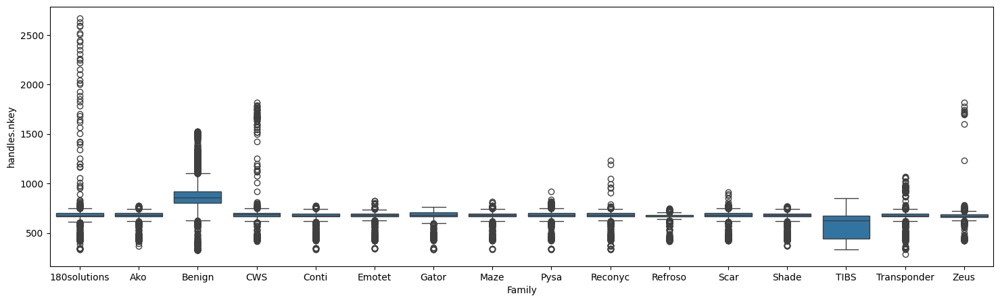

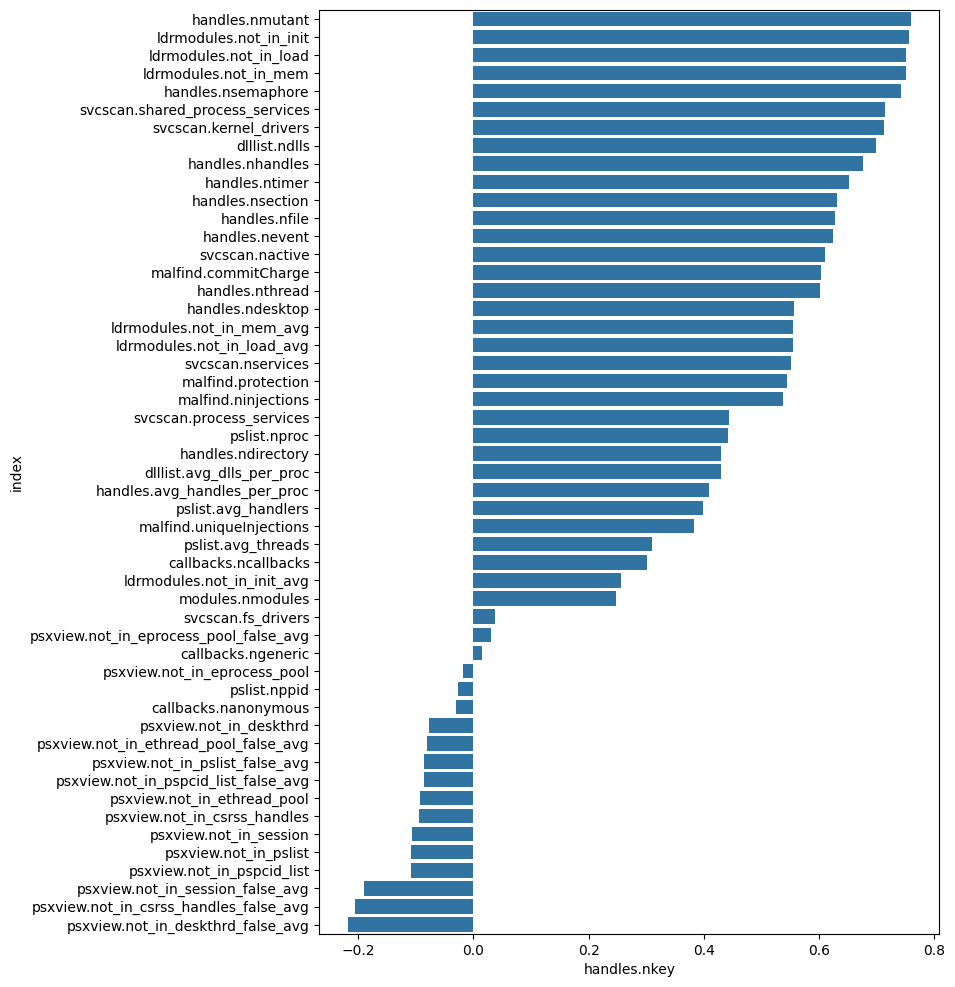

,handles.nthread
mean,930.164470
median,852.000000
std,237.880099
max,5637.000000
min,388.000000


handles.nthread                               
                   mean  median         std   max  min
Class                                                 
Benign      1136.110807  1169.0  141.976707  2006  583
Malware      721.252152   709.0   82.891714  5637  388

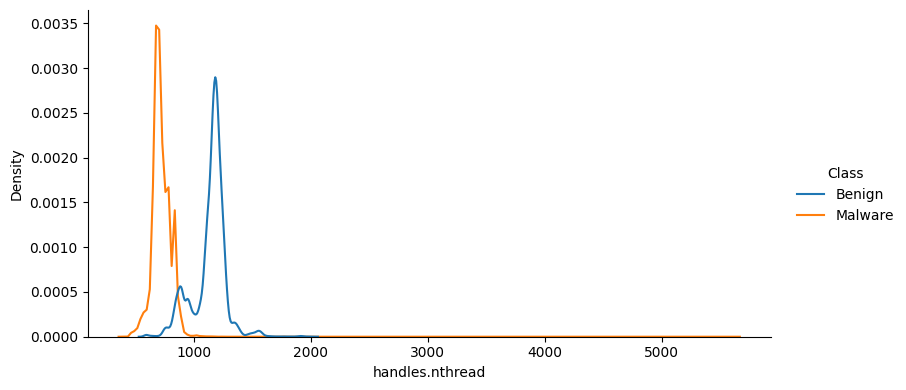

handles.nthread                               
                      mean  median         std   max  min
Category                                                 
Benign         1136.110807  1169.0  141.976707  2006  583
Ransomware      722.398488   710.0   88.259438  5637  455
Spyware         719.955352   711.0   82.896414  1235  388
Trojan          721.442194   705.0   77.106628  2026  467

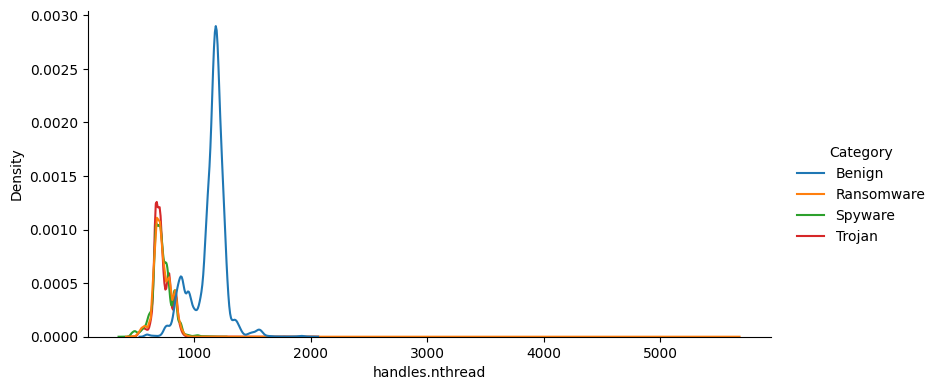

handles.nthread                               
                        mean  median         std   max  min
Family                                                     
180solutions      716.995498   706.0   73.438557   987  461
Ako               731.246500   720.0   72.657445   979  517
Benign           1136.110807  1169.0  141.976707  2006  583
CWS               742.283500   722.0   86.082014  1235  516
Conti             714.061399   703.0   71.321635   915  469
Emotet            719.313676   708.0   70.713474   983  483
Gator             729.753260   729.0   69.636396   926  460
Maze              721.531357   709.0   70.680551   935  455
Pysa              731.562123   715.0  140.135433  5637  464
Reconyc           723.290816   703.0  105.780194  2026  467
Refroso           719.240481   704.0   67.693947   929  513
Scar              724.018500   709.0   69.821026   942  517
Shade             715.439116   706.0   74.203364   933  471
TIBS              661.657670   664.0   90.519660   923  458
Transponder       729.837692   716.0   77.323955  1069  388
Zeus              721.714212   703.0   71.890131  1180  516

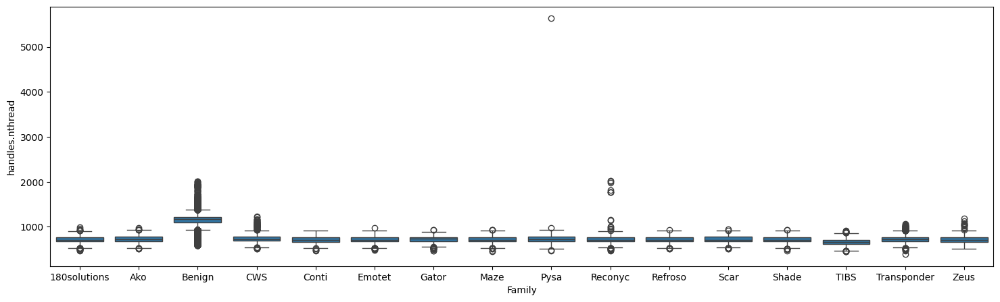

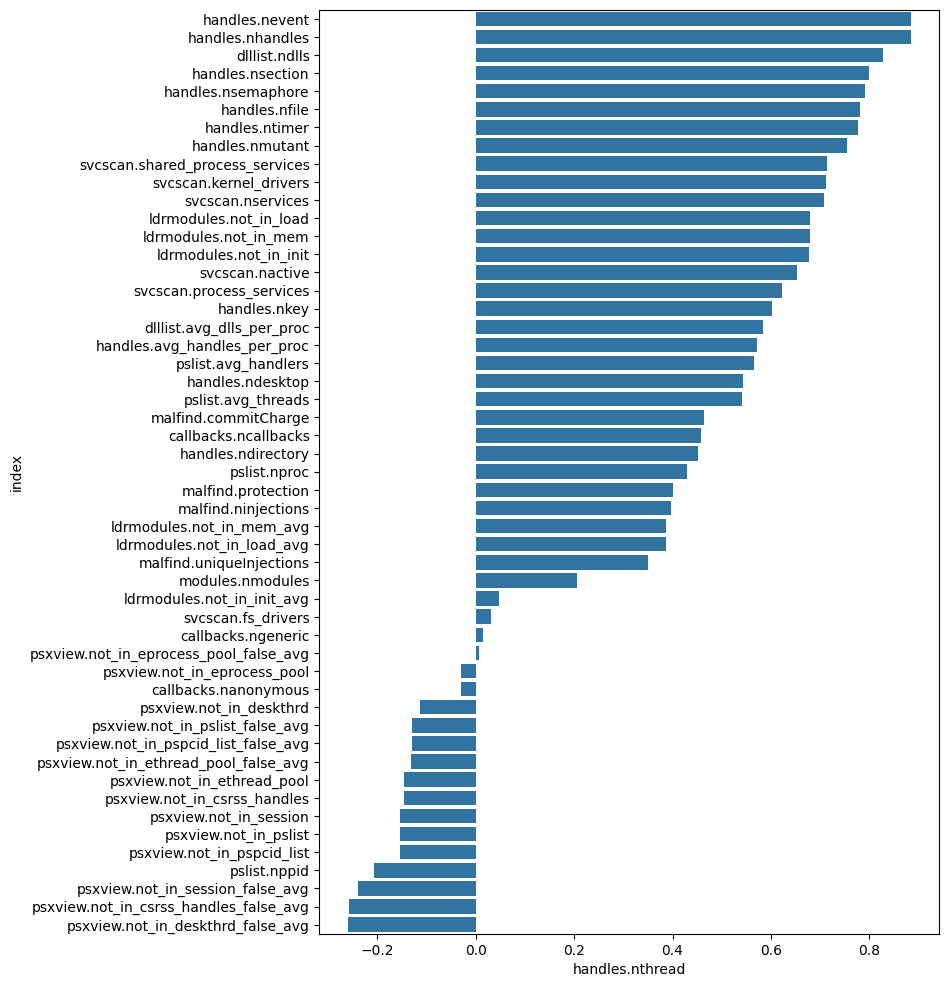

,handles.ndirectory
mean,102.434476
median,103.000000
std,9.781233
max,498.000000
min,57.000000


handles.ndirectory                          
                      mean median       std  max min
Class                                               
Benign          105.387021  104.0  8.811483  156  61
Malware          99.439409  101.0  9.805696  498  57

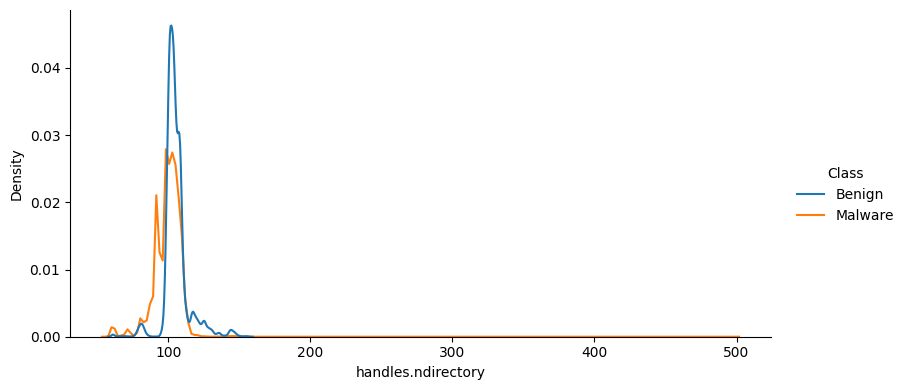

handles.ndirectory                           
                         mean median        std  max min
Category                                                
Benign             105.387021  104.0   8.811483  156  61
Ransomware          99.922948  101.0   8.743264  498  60
Spyware             98.535882  100.0  12.587052  311  57
Trojan              99.888502  101.0   7.088198  150  61

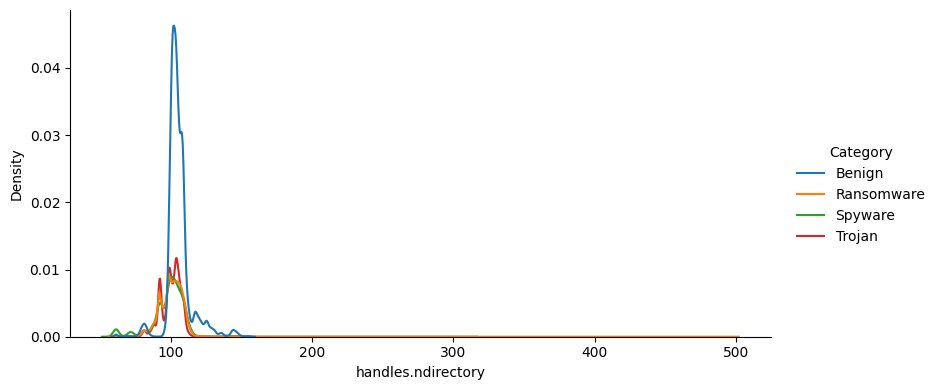

handles.ndirectory                           
                           mean median        std  max min
Family                                                    
180solutions          98.982991  100.0   8.321416  118  61
Ako                  100.101500  101.0   7.403418  125  67
Benign               105.387021  104.0   8.811483  156  61
CWS                  102.947500  102.0  14.858066  311  72
Conti                 99.222446  100.0   7.451274  115  61
Emotet               100.454499  103.0   7.495325  117  61
Gator                101.637914  102.0   7.850733  115  61
Maze                  99.990878  101.0   7.966697  125  61
Pysa                 100.535585  101.0  12.433830  498  60
Reconyc              100.198342  101.0   7.574826  129  61
Refroso               99.462425  101.0   6.452300  114  79
Scar                 100.401500  101.0   6.329718  113  79
Shade                 99.875882  101.0   8.091586  121  67
TIBS                  85.787642   91.0  16.695515  120  60
Transponder           99.385637  101.0   8.410185  127  57
Zeus                  98.977937   99.0   7.495928  150  79

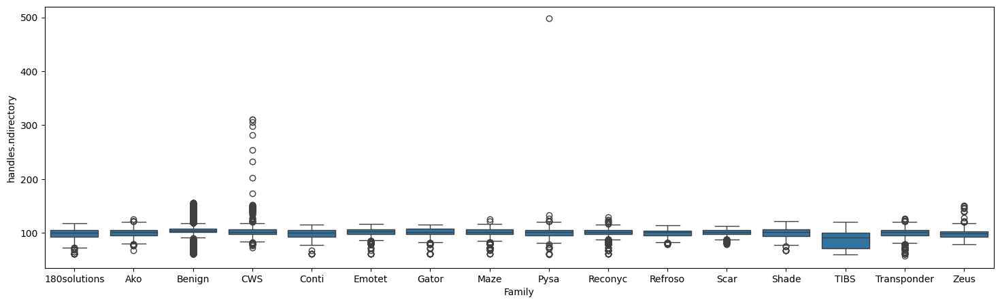

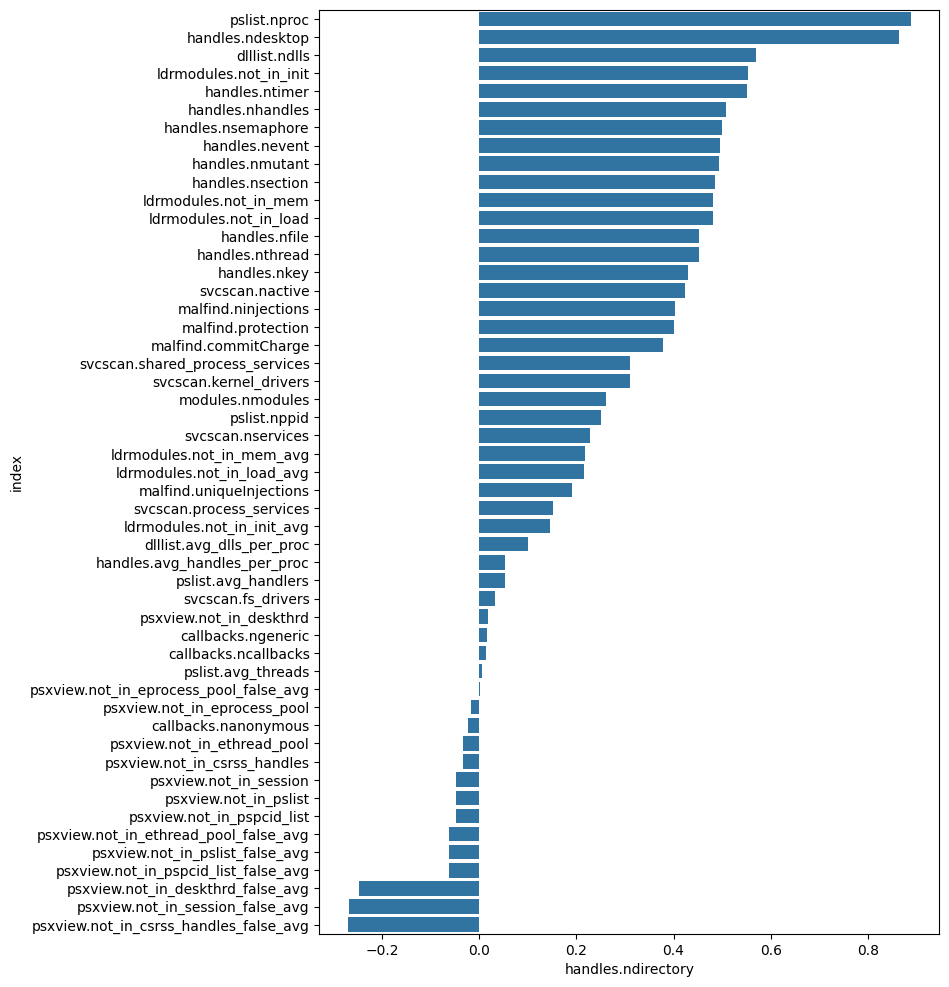

,handles.nsemaphore
mean,683.990887
median,690.000000
std,94.425631
max,4268.000000
min,296.000000


handles.nsemaphore                             
                      mean median        std   max  min
Class                                                  
Benign          756.077452  750.0  54.470258  1029  371
Malware         610.866151  615.0  65.821541  4268  296

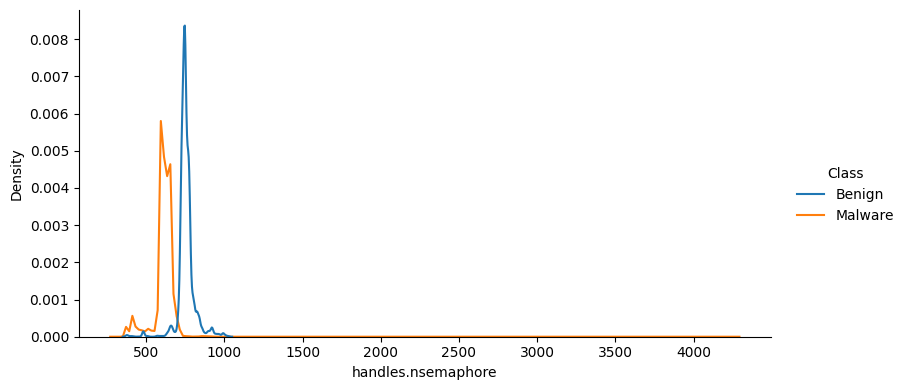

handles.nsemaphore                             
                         mean median        std   max  min
Category                                                  
Benign             756.077452  750.0  54.470258  1029  371
Ransomware         613.781755  617.0  68.961787  4268  369
Spyware            606.664832  614.0  74.785574   947  296
Trojan             612.283966  613.0  50.744215   922  368

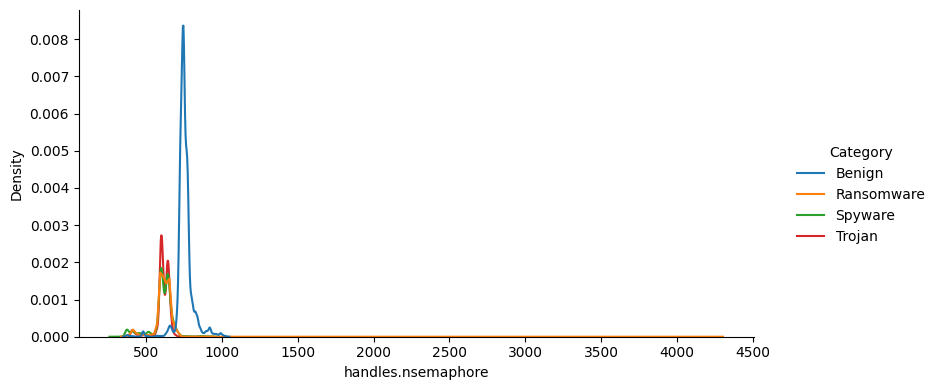

handles.nsemaphore                              
                           mean median         std   max  min
Family                                                       
180solutions         605.181091  608.0   61.164960   716  372
Ako                  624.112500  640.0   56.702738   730  406
Benign               756.077452  750.0   54.470258  1029  371
CWS                  633.276000  635.0   65.316414   947  406
Conti                605.400101  608.0   58.087751   704  372
Emotet               608.732079  616.0   57.751589   688  375
Gator                615.499498  634.0   55.229878   685  371
Maze                 615.885975  619.0   51.506296   720  372
Pysa                 626.045838  626.0  102.432251  4268  369
Reconyc              609.859056  608.0   53.214211   815  368
Refroso              611.701403  612.0   47.071726   696  405
Scar                 614.473000  617.0   50.294195   704  406
Shade                600.602727  609.0   65.618102   707  384
TIBS                 537.884233  594.0  106.757223   713  369
Transponder          618.690743  624.0   58.201301   811  296
Zeus                 616.169831  608.0   44.532230   922  406

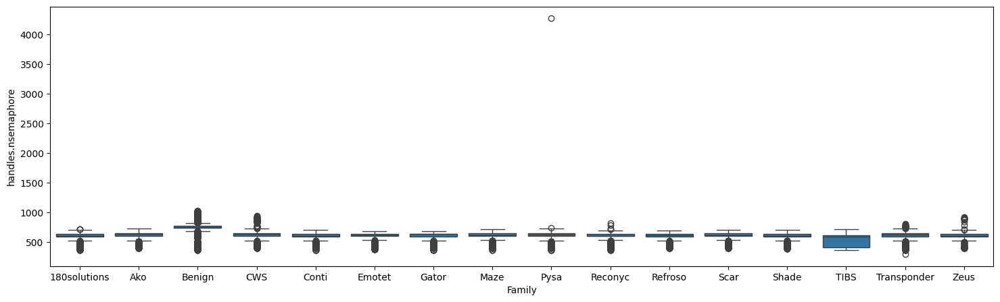

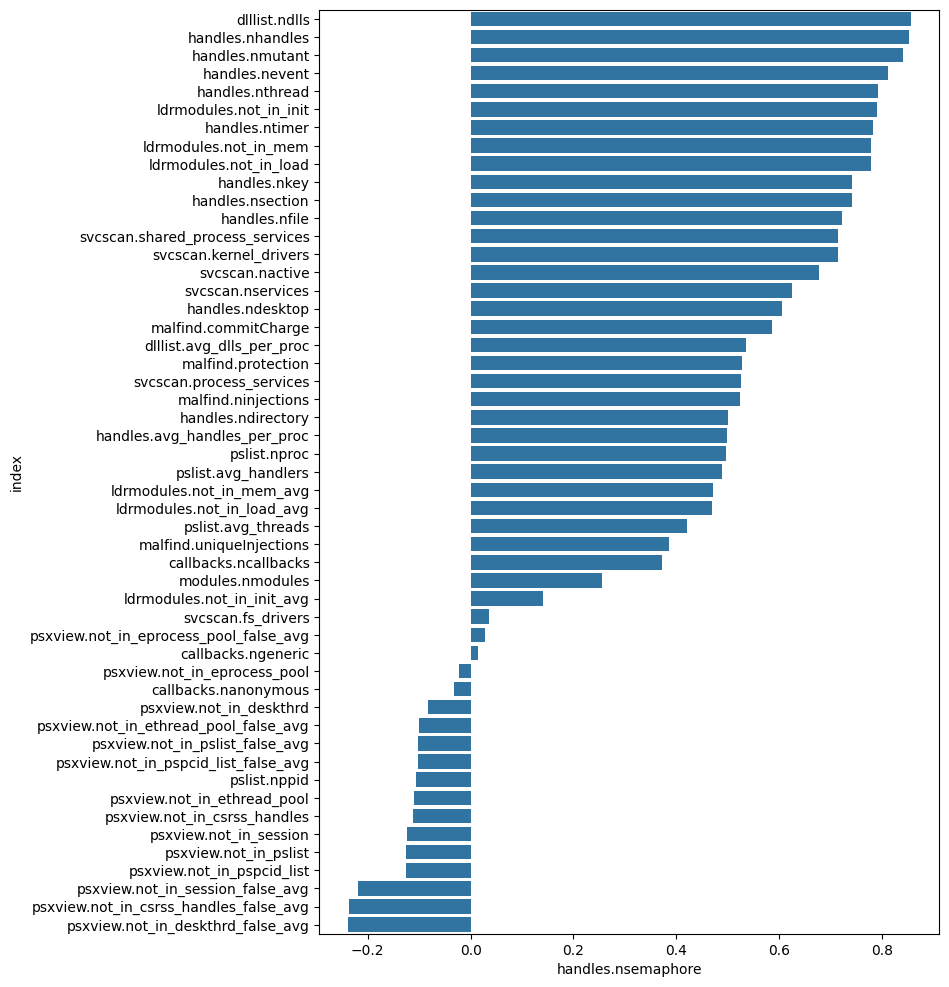

,handles.ntimer
mean,130.426723
median,131.000000
std,14.955566
max,382.000000
min,69.000000


handles.ntimer                           
                  mean median        std  max min
Class                                            
Benign      142.053129  142.0   8.066658  183  85
Malware     118.632878  120.0  10.408384  382  69

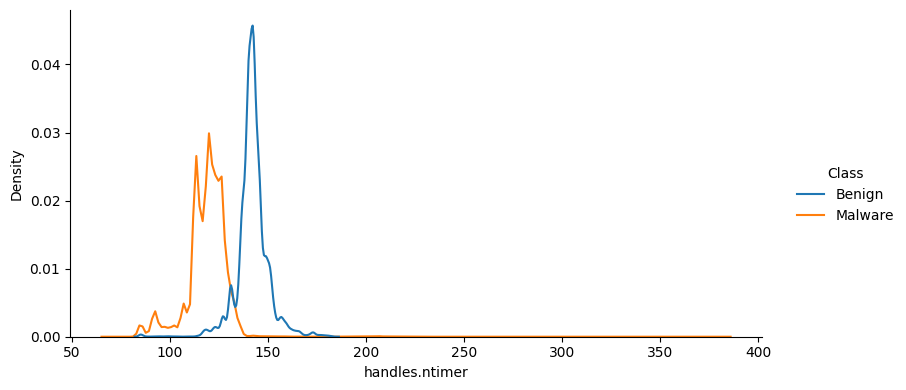

handles.ntimer                           
                     mean median        std  max min
Category                                            
Benign         142.053129  142.0   8.066658  183  85
Ransomware     118.693471  120.0   9.511374  382  84
Spyware        118.424261  120.0  12.557050  222  69
Trojan         118.787869  120.0   8.670440  218  85

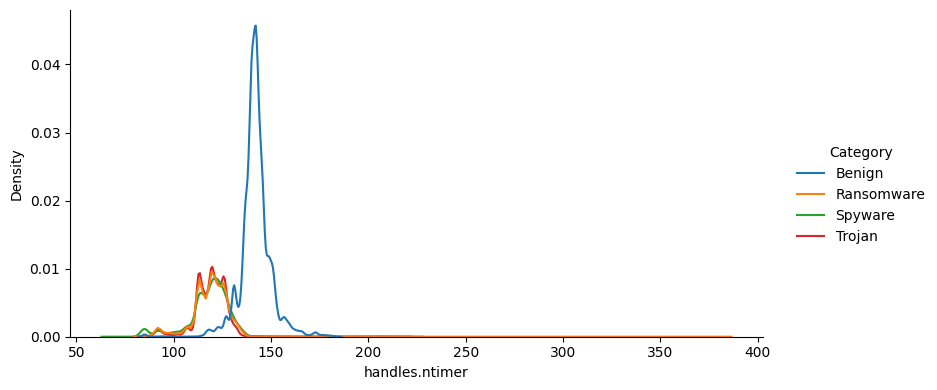

handles.ntimer                           
                       mean median        std  max min
Family                                                
180solutions     117.341671  119.0   9.244040  135  85
Ako              120.089000  120.0   9.703306  191  89
Benign           142.053129  142.0   8.066658  183  85
CWS              122.643000  122.0  15.834896  222  89
Conti            117.393558  119.0   8.725425  133  85
Emotet           118.067616  120.0   9.125607  156  85
Gator            120.826981  122.0   8.845876  135  85
Maze             119.086659  120.0   8.266484  135  85
Pysa             119.661641  120.0  10.467387  382  84
Reconyc          118.123724  119.0   8.414137  159  85
Refroso          119.538076  120.0   8.104274  137  89
Scar             118.957500  120.0   8.008106  159  89
Shade            117.516690  120.0   9.912865  138  86
TIBS             108.014915  111.0  14.961136  135  84
Transponder      119.915318  120.0   9.032305  156  69
Zeus             119.106721  120.0   9.494941  218  89

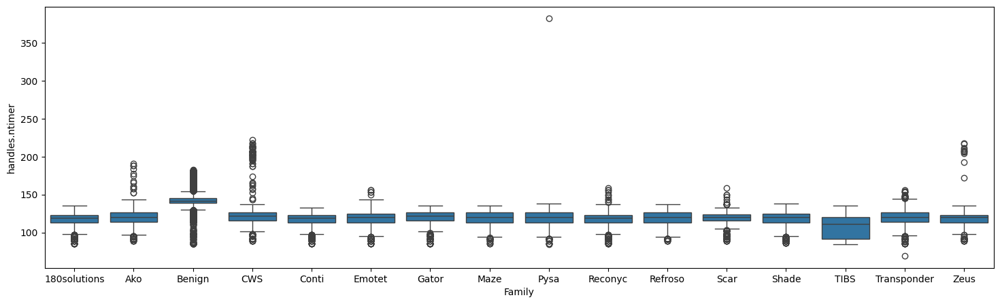

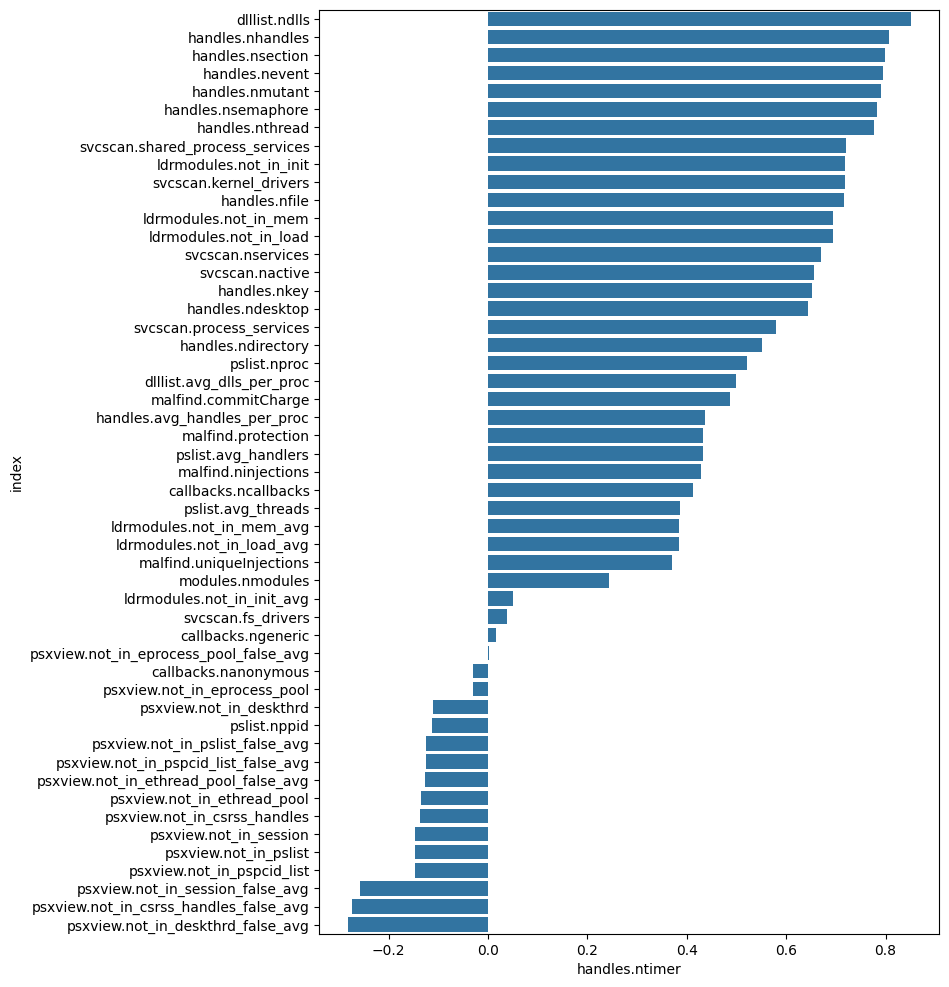

,handles.nsection
mean,291.051992
median,231.000000
std,144.430688
max,14687.000000
min,50.000000


handles.nsection                             
                    mean median        std    max min
Class                                                
Benign        408.614861  415.0  64.562628    700  69
Malware       171.796016  177.0  97.725105  14687  50

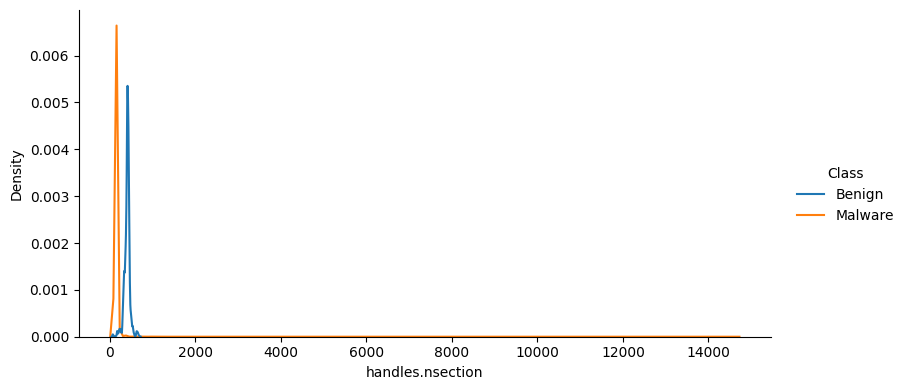

handles.nsection                              
                       mean median         std    max min
Category                                                 
Benign           408.614861  415.0   64.562628    700  69
Ransomware       171.433340  177.0   34.908079   1110  69
Spyware          172.380326  177.0   55.228127   1145  50
Trojan           171.555802  177.0  157.003387  14687  70

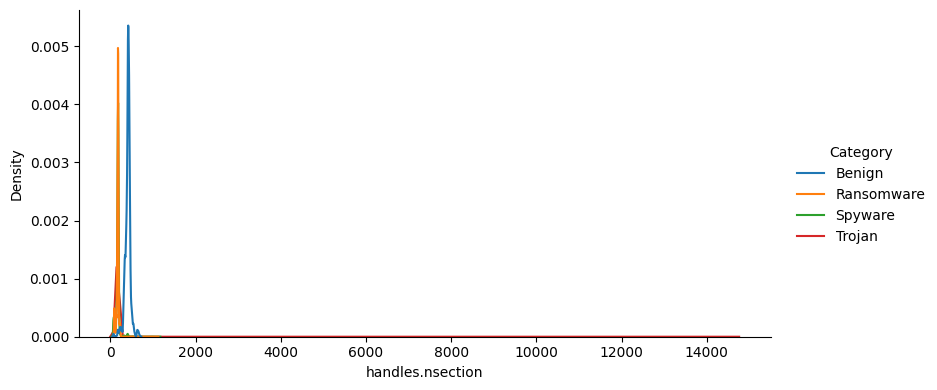

handles.nsection                              
                         mean median         std    max min
Family                                                     
180solutions       179.614307  177.0   69.519514   1087  69
Ako                173.826500  177.0   43.904888   1110  81
Benign             408.614861  415.0   64.562628    700  69
CWS                182.033000  178.0   54.792965   1073  86
Conti              167.349774  176.0   24.244765    207  70
Emotet             167.050839  177.0   24.365216    218  75
Gator              172.932798  177.0   23.819346    211  69
Maze               171.954390  177.0   24.371019    234  69
Pysa               176.219542  177.0   45.925014   1076  70
Reconyc            182.737245  177.0  382.584593  14687  70
Refroso            168.391784  176.0   19.764524    199  86
Scar               170.261000  177.0   21.396747    205  86
Shade              168.837330  177.0   30.307453    244  78
TIBS               138.619318  150.0   45.593129    255  69
Transponder        177.638854  177.0   58.506225   1145  50
Zeus               171.675731  176.0   24.545907    429  86

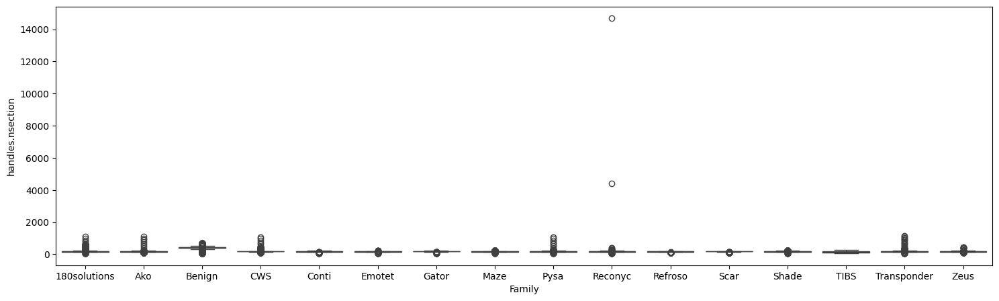

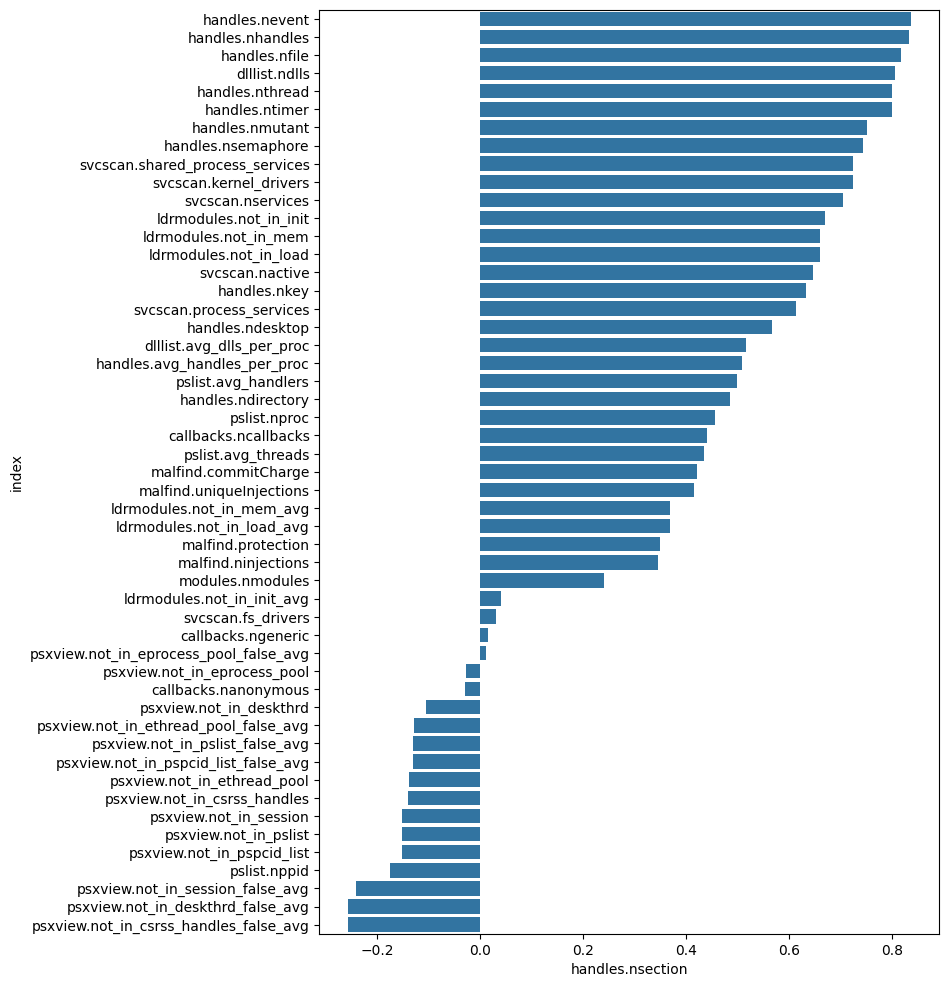

,handles.nmutant
mean,313.105139
median,293.000000
std,73.201658
max,583.000000
min,118.000000


handles.nmutant                            
                   mean median        std  max  min
Class                                              
Benign       375.209983  366.0  47.217297  583  168
Malware      250.105879  259.0  25.514769  534  118

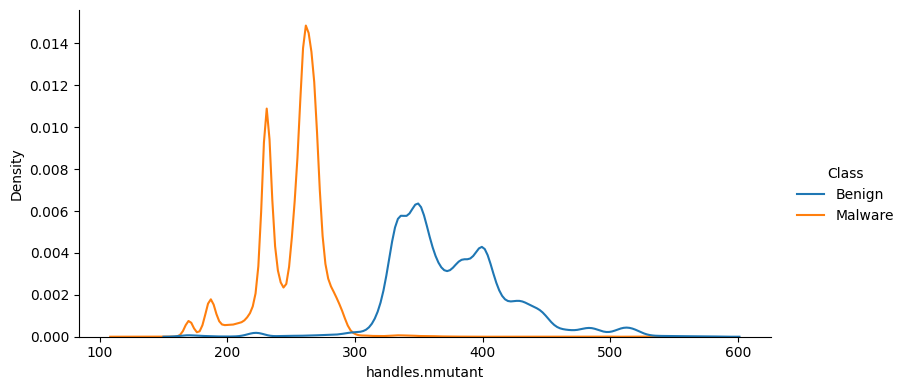

handles.nmutant                            
                      mean median        std  max  min
Category                                              
Benign          375.209983  366.0  47.217297  583  168
Ransomware      250.310729  259.0  23.762871  423  162
Spyware         249.274618  258.0  28.903410  381  118
Trojan          250.760232  259.0  23.364078  534  162

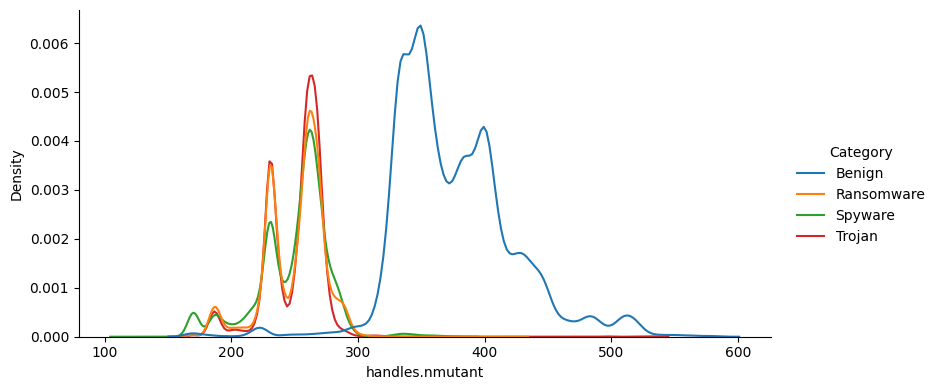

handles.nmutant                            
                        mean median        std  max  min
Family                                                  
180solutions      247.997499  257.0  24.237305  304  147
Ako               254.018000  259.0  23.601021  308  181
Benign            375.209983  366.0  47.217297  583  168
CWS               259.068000  261.0  25.821982  381  181
Conti             246.796678  257.0  22.801608  289  168
Emotet            249.831723  258.0  30.083212  534  168
Gator             251.818957  259.0  21.860797  283  168
Maze              250.526226  259.0  21.995349  295  169
Pysa              253.167069  259.0  23.456617  423  162
Reconyc           250.665816  259.0  22.232066  386  162
Refroso           251.003507  259.0  20.497998  306  181
Scar              251.805000  259.0  21.324008  346  181
Shade             247.703338  258.0  25.593830  291  171
TIBS              224.616477  229.0  36.651792  294  162
Transponder       254.509755  259.0  26.689226  378  118
Zeus              250.452027  259.0  21.124117  358  181

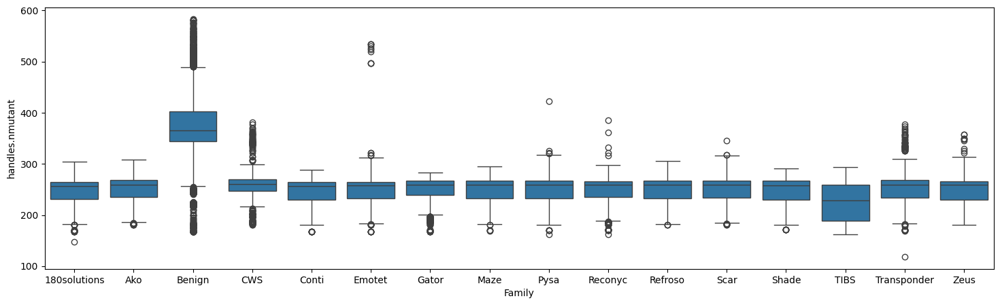

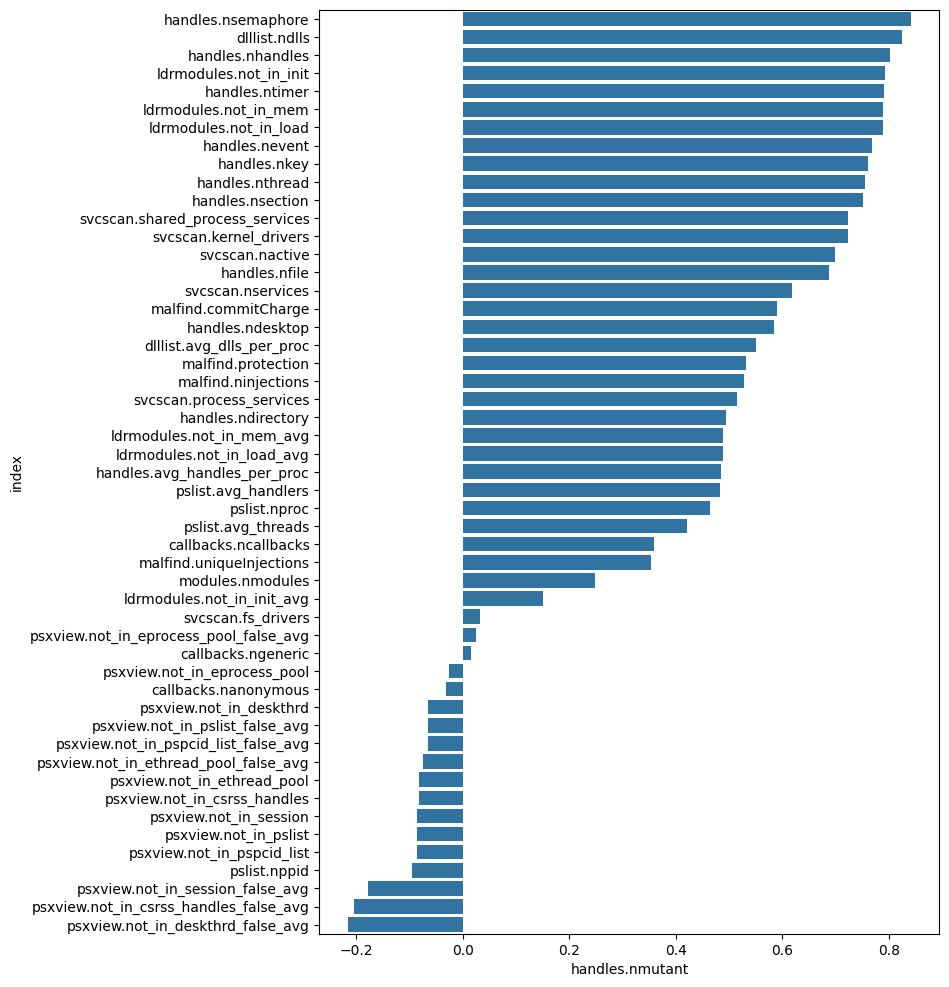

,ldrmodules.not_in_load
mean,60.945820
median,57.000000
std,18.780408
max,240.000000
min,6.000000


ldrmodules.not_in_load                           
                          mean median        std  max min
Class                                                    
Benign               75.610037   74.0  14.601227  142   8
Malware              46.070412   46.0   7.402965  240   6

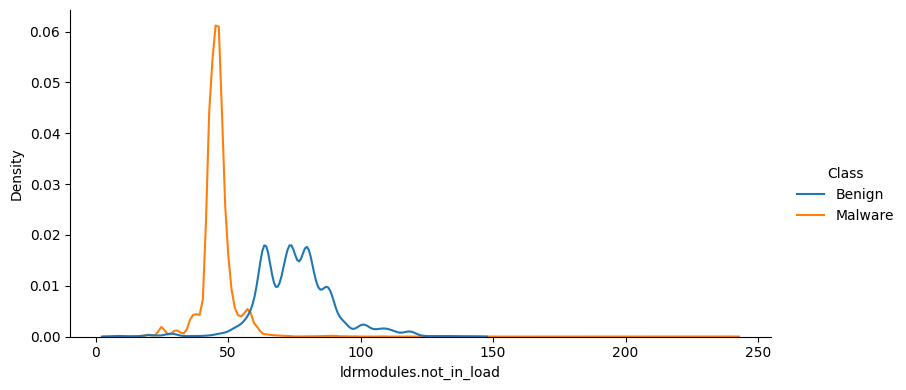

ldrmodules.not_in_load                           
                             mean median        std  max min
Category                                                    
Benign                  75.610037   74.0  14.601227  142   8
Ransomware              45.901218   45.0   8.197125  240   7
Spyware                 46.039042   46.0   8.734867  196   6
Trojan                  46.272890   46.0   4.478089  134  17

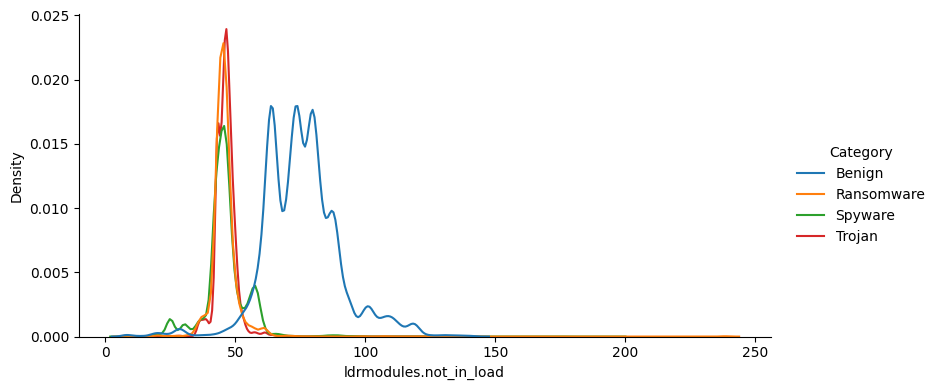

ldrmodules.not_in_load                           
                               mean median        std  max min
Family                                                        
180solutions              45.917459   46.0   5.703088   96   6
Ako                       46.238000   45.0   6.464383  167   7
Benign                    75.610037   74.0  14.601227  142   8
CWS                       47.552500   46.0   9.419905  176   6
Conti                     45.636135   45.0   7.208237  144   7
Emotet                    46.467717   46.0   5.828409  134  24
Gator                     49.963892   47.0   9.126182  196  18
Maze                      45.074686   45.0   4.670135  125  19
Pysa                      45.379373   45.0   4.162103   82   8
Reconyc                   46.662628   47.0   4.509547   92  17
Refroso                   46.062124   46.0   3.194160   63  35
Scar                      46.641500   47.0   3.222448   63  35
Shade                     46.920545   46.0  13.406650  240   7
TIBS                      38.279830   42.0   9.184663   59  16
Transponder               46.169780   45.0   6.483417   72  11
Zeus                      45.600308   45.0   5.003368   99  35

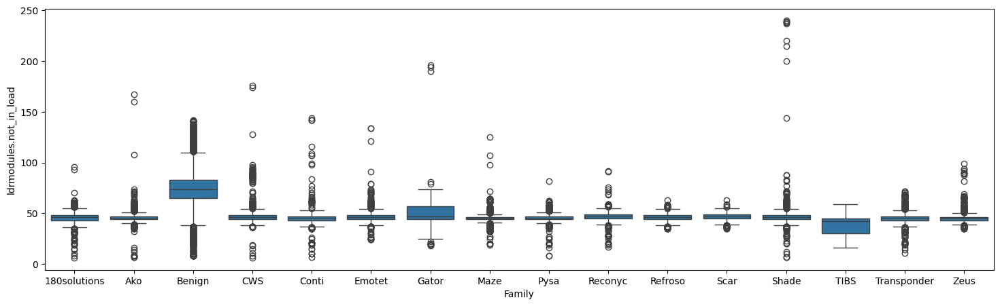

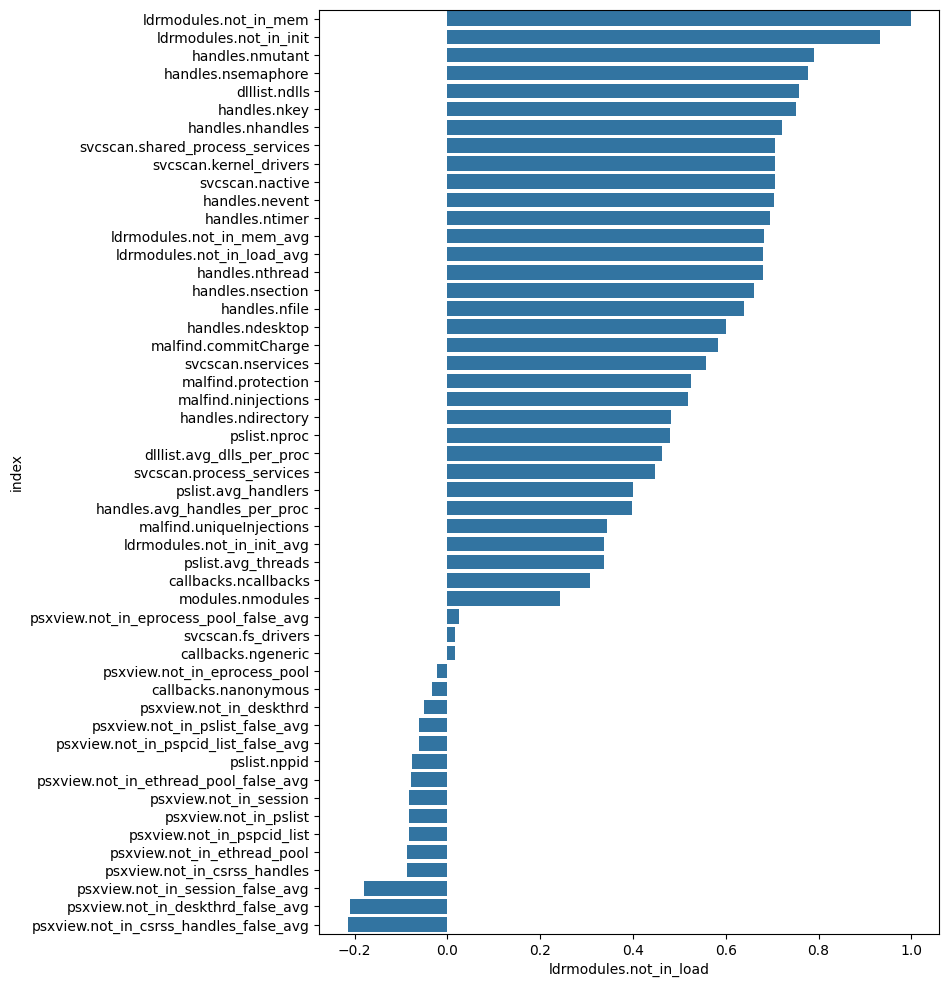

,ldrmodules.not_in_init
mean,100.072906
median,97.000000
std,21.460349
max,264.000000
min,16.000000


ldrmodules.not_in_init                           
                          mean median        std  max min
Class                                                    
Benign              115.318463  115.0  18.396063  191  34
Malware              84.607787   85.0  10.463855  264  16

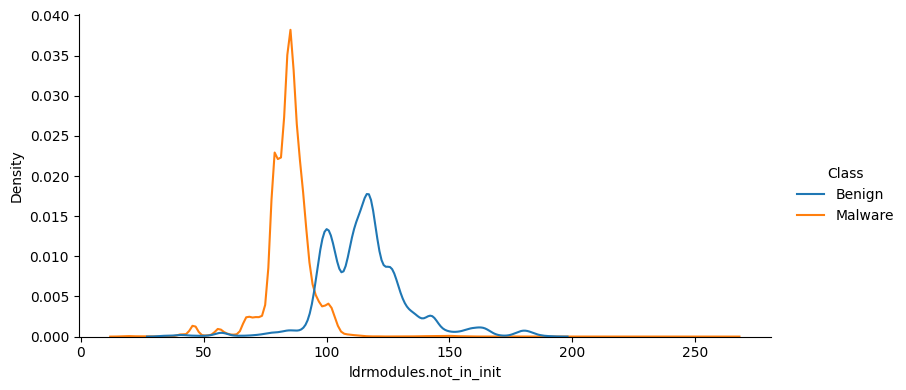

ldrmodules.not_in_init                           
                             mean median        std  max min
Category                                                    
Benign                 115.318463  115.0  18.396063  191  34
Ransomware              84.590279   85.0   9.697622  264  16
Spyware                 84.196738   85.0  13.605485  223  16
Trojan                  85.050738   85.0   6.813063  170  38

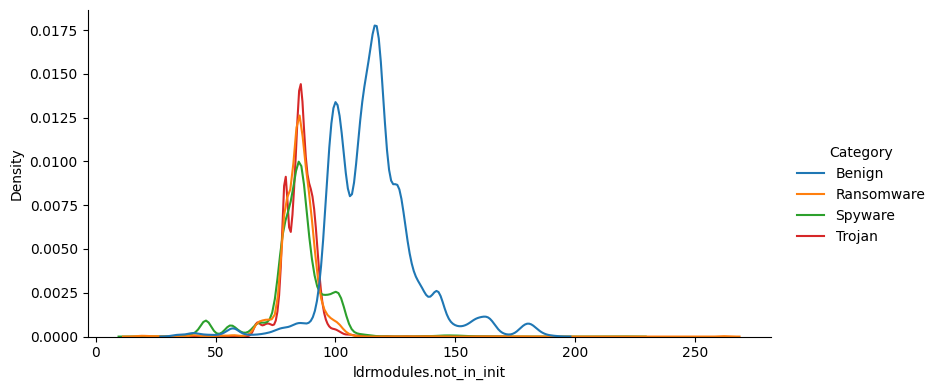

ldrmodules.not_in_init                           
                               mean median        std  max min
Family                                                        
180solutions              84.174087   85.0   9.010821  110  16
Ako                       84.963000   85.0   8.619094  181  16
Benign                   115.318463  115.0  18.396063  191  34
CWS                       87.610500   85.0  14.749358  219  18
Conti                     84.023654   85.0   8.918730  177  19
Emotet                    85.339603   86.0   7.608662  170  45
Gator                     89.483952   87.0  11.461797  223  39
Maze                      84.011973   85.0   6.956254  141  40
Pysa                      84.512063   84.0   7.055101  119  20
Reconyc                   85.663265   86.0   7.354468  144  38
Refroso                   84.561122   85.0   5.534197  103  66
Scar                      85.703000   86.0   5.491709  106  66
Shade                     85.307005   85.0  14.045058  264  18
TIBS                      70.928977   78.0  16.731860  103  37
Transponder               84.759651   84.0   9.884042  121  29
Zeus                      84.098512   84.0   7.722905  157  66

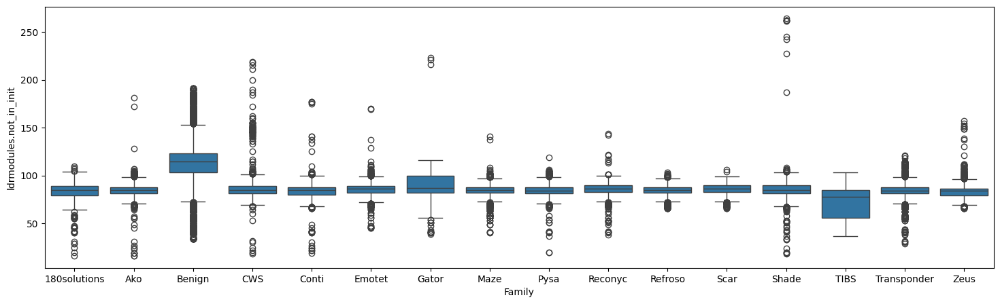

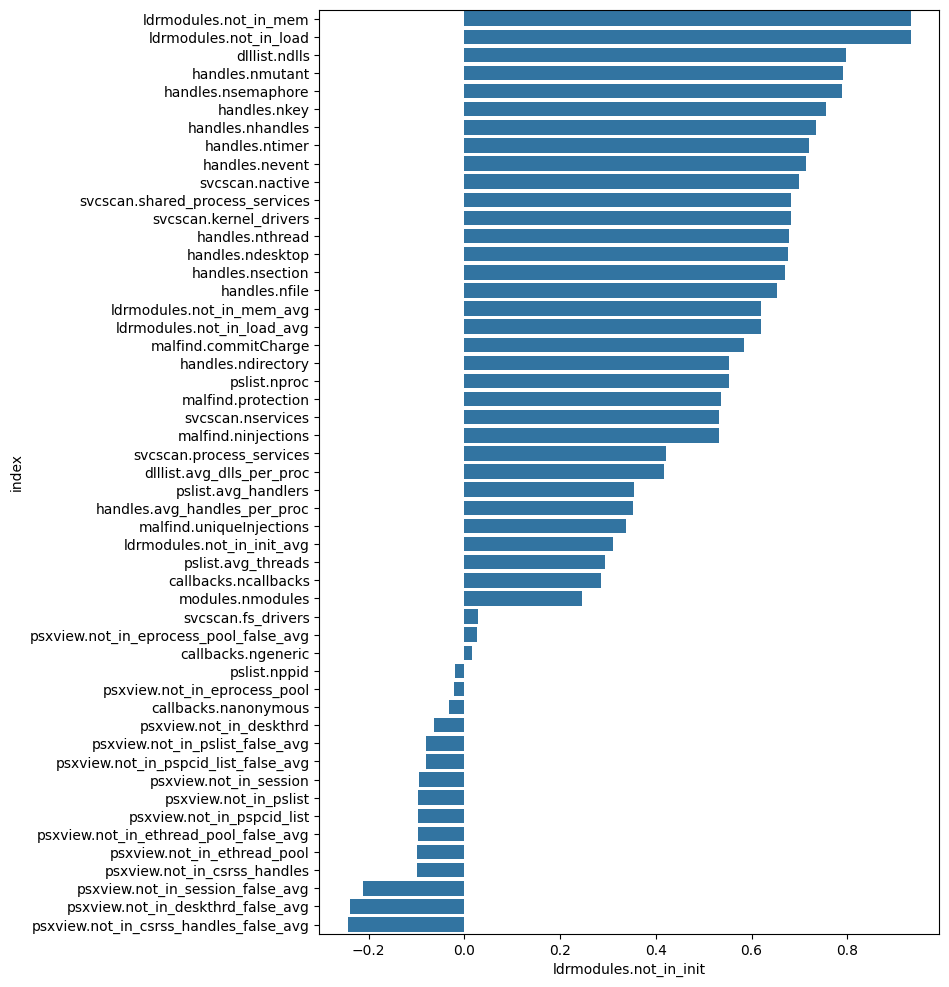

,ldrmodules.not_in_mem
mean,60.948094
median,57.000000
std,18.778906
max,240.000000
min,6.000000


ldrmodules.not_in_mem                           
                         mean median        std  max min
Class                                                   
Benign              75.610037   74.0  14.601227  142   8
Malware             46.074993   46.0   7.404495  240   6

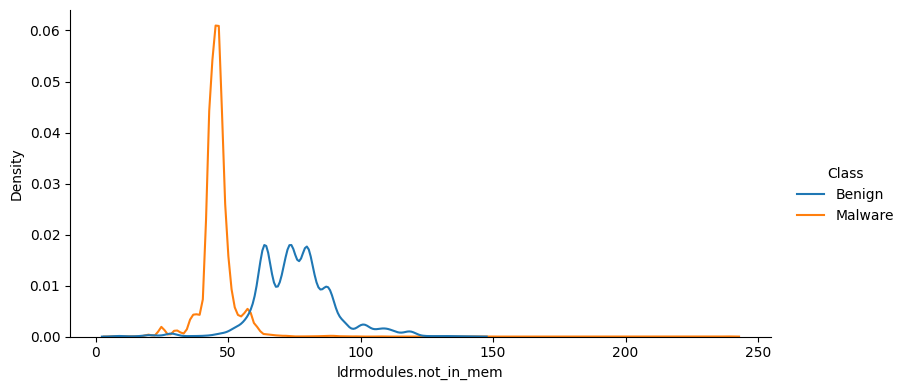

ldrmodules.not_in_mem                           
                            mean median        std  max min
Category                                                   
Benign                 75.610037   74.0  14.601227  142   8
Ransomware             45.906467   45.0   8.198826  240   7
Spyware                46.042508   46.0   8.735737  196   6
Trojan                 46.277954   46.0   4.480886  134  17

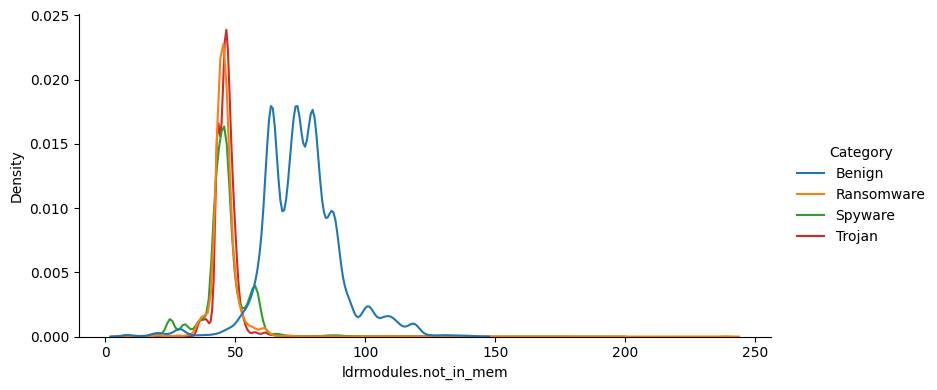

ldrmodules.not_in_mem                           
                              mean median        std  max min
Family                                                       
180solutions             45.919460   46.0   5.704521   96   6
Ako                      46.241500   45.0   6.464447  167   7
Benign                   75.610037   74.0  14.601227  142   8
CWS                      47.560500   46.0   9.420282  176   6
Conti                    45.645194   45.0   7.210853  144   7
Emotet                   46.471784   46.0   5.832094  134  24
Gator                    49.965898   47.0   9.126740  196  18
Maze                     45.079818   45.0   4.671577  125  19
Pysa                     45.381182   45.0   4.164039   82   8
Reconyc                  46.666454   47.0   4.510963   92  17
Refroso                  46.068136   46.0   3.200308   63  35
Scar                     46.649500   47.0   3.224570   63  35
Shade                    46.926657   46.0  13.409018  240   7
TIBS                     38.285511   42.0   9.189594   59  16
Transponder              46.170610   45.0   6.483396   72  11
Zeus                     45.603386   45.0   5.004434   99  35

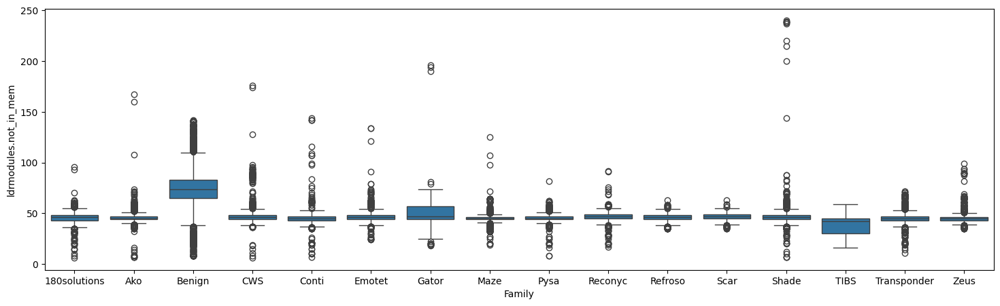

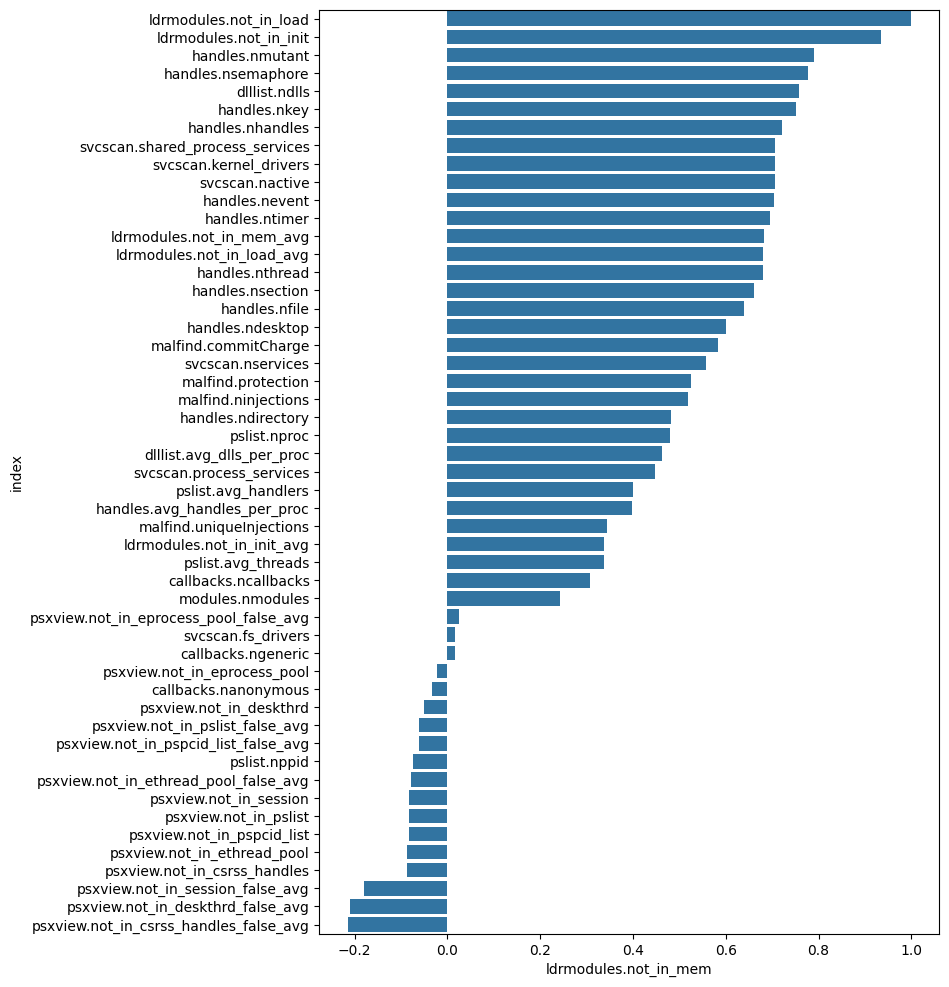

,ldrmodules.not_in_load_avg
mean,0.033196
median,0.031420
std,0.009289
max,0.531120
min,0.016176


ldrmodules.not_in_load_avg                                        
                              mean    median       std       max       min
Class                                                                     
Benign                    0.036458  0.036320  0.004753  0.051618  0.019397
Malware                   0.029888  0.028976  0.011365  0.531120  0.016176

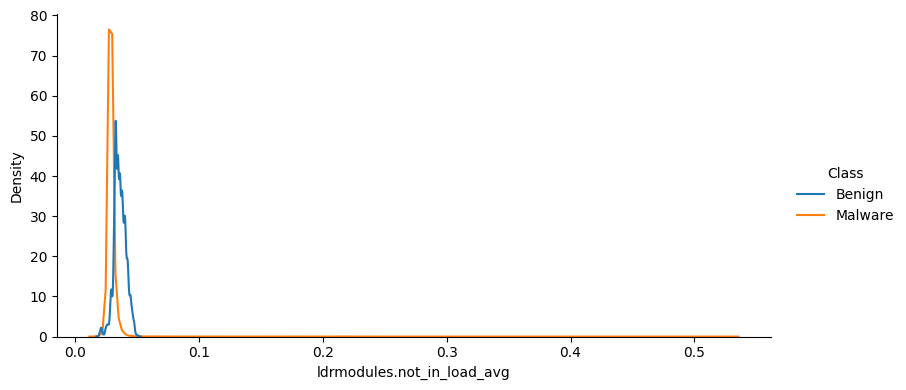

ldrmodules.not_in_load_avg                                        
                                 mean    median       std       max       min
Category                                                                     
Benign                       0.036458  0.036320  0.004753  0.051618  0.019397
Ransomware                   0.030245  0.028754  0.015185  0.441441  0.017563
Spyware                      0.029916  0.028846  0.011505  0.531120  0.016176
Trojan                       0.029500  0.029299  0.004870  0.227848  0.018559

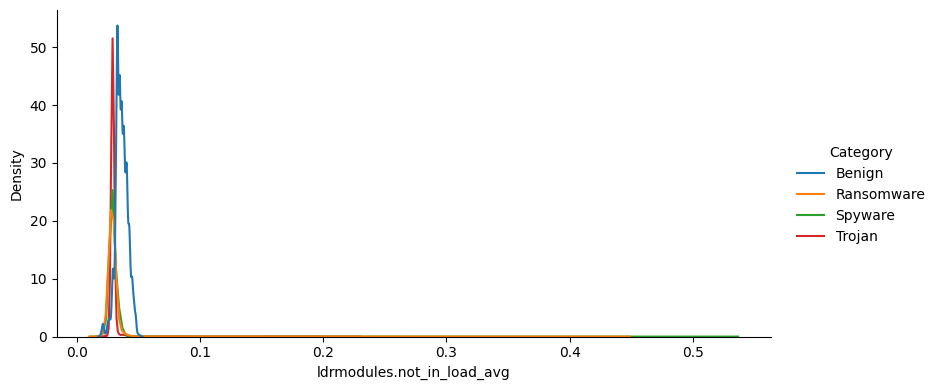

ldrmodules.not_in_load_avg                                \
                                   mean    median       std       max   
Family                                                                  
180solutions                   0.029938  0.029211  0.008538  0.256198   
Ako                            0.030325  0.028791  0.014080  0.323017   
Benign                         0.036458  0.036320  0.004753  0.051618   
CWS                            0.030470  0.028747  0.020575  0.531120   
Conti                          0.030554  0.028928  0.016001  0.390863   
Emotet                         0.030168  0.029144  0.010342  0.227848   
Gator                          0.031792  0.029877  0.011343  0.281385   
Maze                           0.029172  0.028296  0.014715  0.441441   
Pysa                           0.028885  0.028508  0.008352  0.338843   
Reconyc                        0.029591  0.029498  0.001412  0.037845   
Refroso                        0.029293  0.029391  0.000836  0.037146   
Scar                           0.029445  0.029412  0.001047  0.034340   
Shade                          0.031826  0.029212  0.019225  0.431373   
TIBS                           0.027554  0.027844  0.002255  0.035553   
Transponder                    0.029264  0.028754  0.003302  0.097561   
Zeus                           0.029021  0.028801  0.001816  0.060699   

                        
                   min  
Family                  
180solutions  0.020170  
Ako           0.025082  
Benign        0.019397  
CWS           0.017454  
Conti         0.020234  
Emotet        0.023747  
Gator         0.019272  
Maze          0.020277  
Pysa          0.017563  
Reconyc       0.018559  
Refroso       0.026948  
Scar          0.026667  
Shade         0.025513  
TIBS          0.017525  
Transponder   0.016176  
Zeus          0.025770

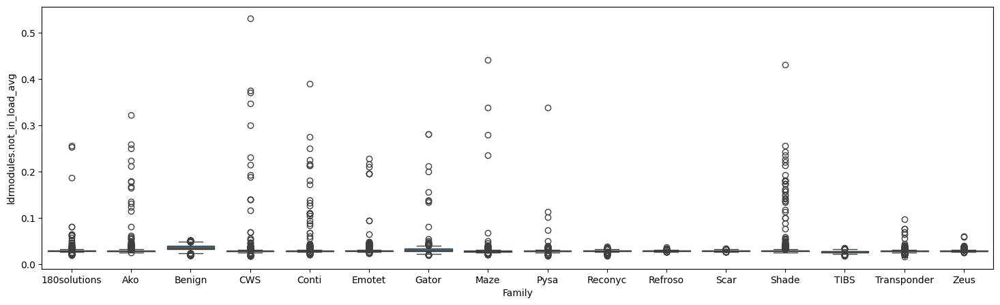

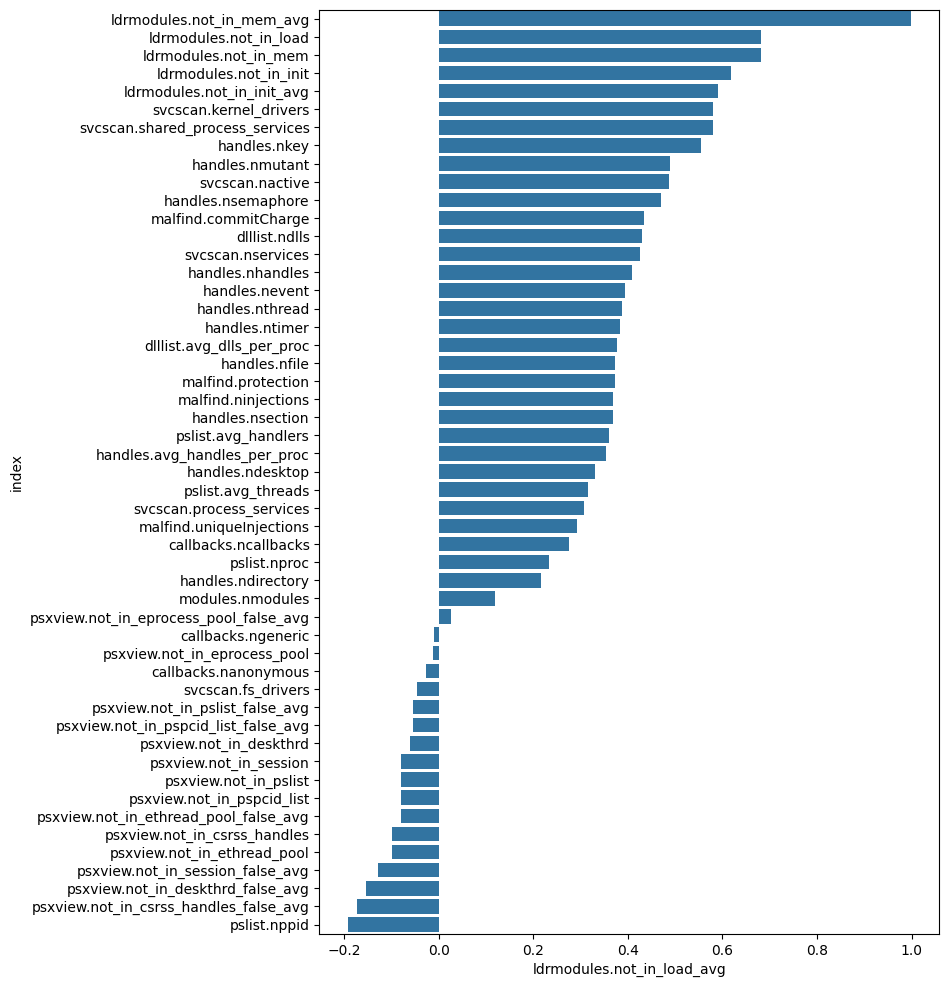

,ldrmodules.not_in_init_avg
mean,0.055231
median,0.054037
std,0.010144
max,0.585062
min,0.040526


ldrmodules.not_in_init_avg                                        
                              mean    median       std       max       min
Class                                                                     
Benign                    0.055821  0.054940  0.005859  0.136842  0.041897
Malware                   0.054633  0.053571  0.013106  0.585062  0.040526

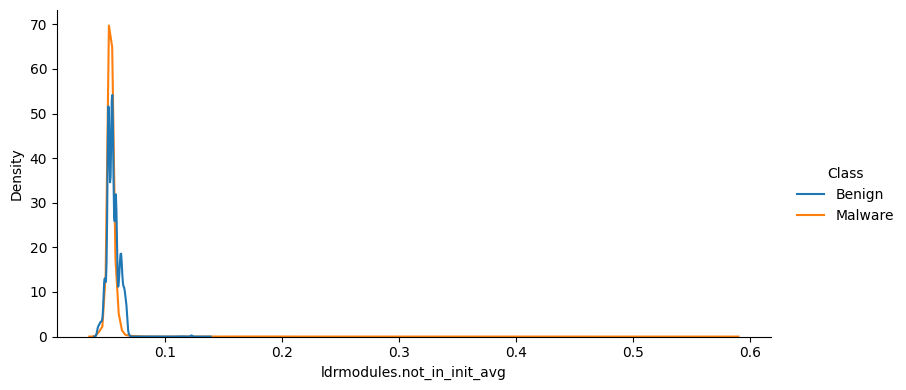

ldrmodules.not_in_init_avg                                        
                                 mean    median       std       max       min
Category                                                                     
Benign                       0.055821  0.054940  0.005859  0.136842  0.041897
Ransomware                   0.055245  0.053398  0.017730  0.486486  0.040615
Spyware                      0.054500  0.053447  0.013034  0.585062  0.040526
Trojan                       0.054157  0.053892  0.005461  0.276018  0.041485

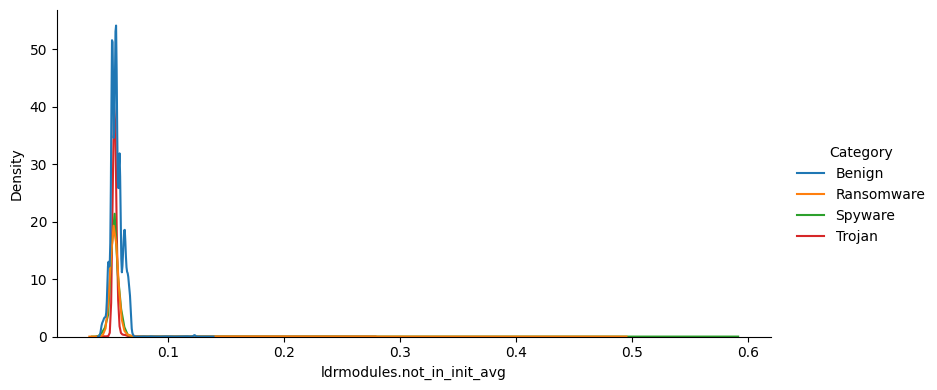

ldrmodules.not_in_init_avg                                \
                                   mean    median       std       max   
Family                                                                  
180solutions                   0.054754  0.053714  0.010391  0.347107   
Ako                            0.055279  0.053276  0.016787  0.350097   
Benign                         0.055821  0.054940  0.005859  0.136842   
CWS                            0.055358  0.053256  0.022888  0.585062   
Conti                          0.055712  0.053645  0.019375  0.446701   
Emotet                         0.055077  0.053972  0.011549  0.276018   
Gator                          0.056697  0.055179  0.012292  0.337662   
Maze                           0.053891  0.052885  0.015932  0.486486   
Pysa                           0.053675  0.053021  0.010371  0.376033   
Reconyc                        0.054338  0.054197  0.001710  0.061538   
Refroso                        0.053780  0.053828  0.001035  0.060142   
Scar                           0.054103  0.054022  0.001297  0.060150   
Shade                          0.057115  0.053888  0.022193  0.480392   
TIBS                           0.051060  0.052400  0.003667  0.059470   
Transponder                    0.053768  0.053205  0.004751  0.143472   
Zeus                           0.053526  0.053269  0.001976  0.083998   

                        
                   min  
Family                  
180solutions  0.041704  
Ako           0.049800  
Benign        0.041897  
CWS           0.049521  
Conti         0.042599  
Emotet        0.044855  
Gator         0.041756  
Maze          0.042572  
Pysa          0.040615  
Reconyc       0.041485  
Refroso       0.051237  
Scar          0.049855  
Shade         0.049120  
TIBS          0.040526  
Transponder   0.041930  
Zeus          0.049271

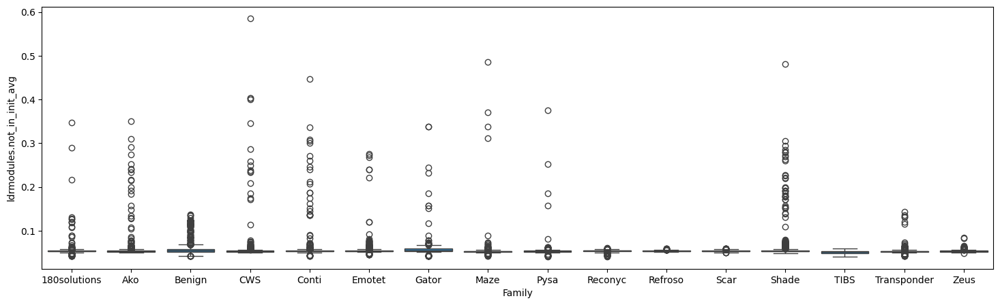

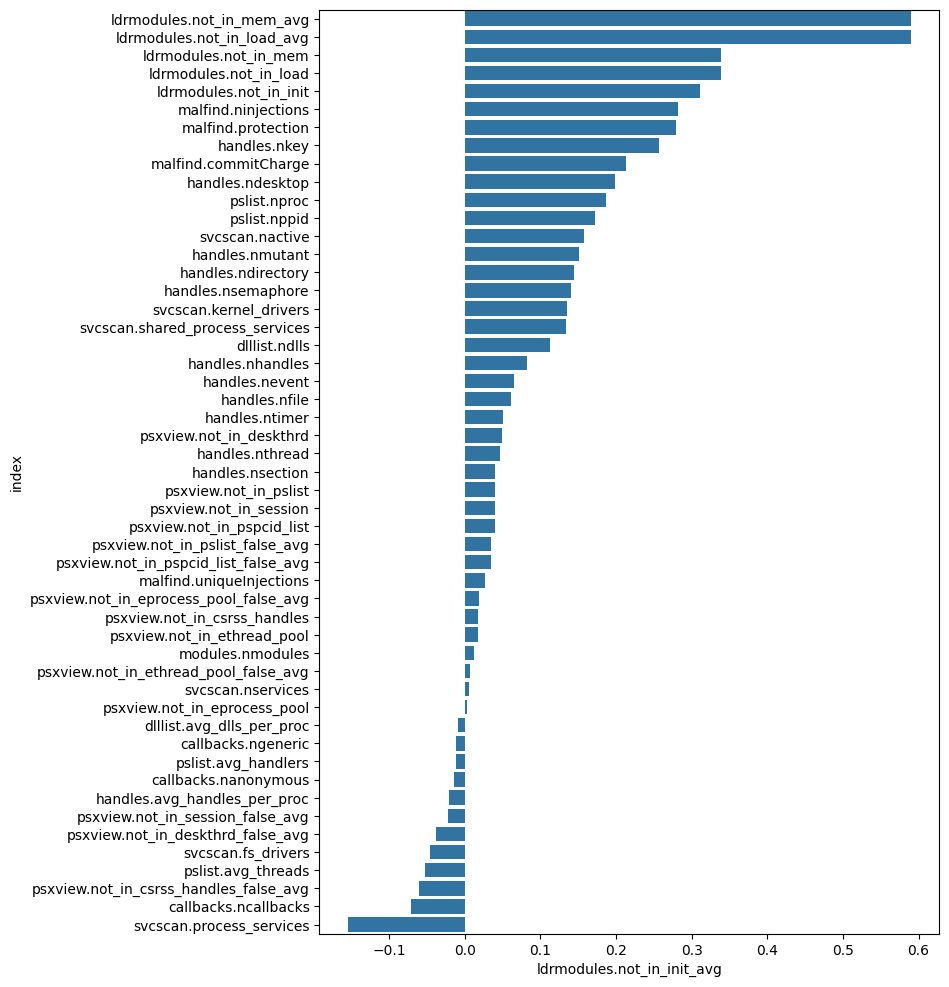

,ldrmodules.not_in_mem_avg
mean,0.033198
median,0.031420
std,0.009292
max,0.531120
min,0.016176


ldrmodules.not_in_mem_avg                                        
                             mean    median       std       max       min
Class                                                                    
Benign                   0.036458  0.036320  0.004753  0.051618  0.019397
Malware                  0.029891  0.028977  0.011371  0.531120  0.016176

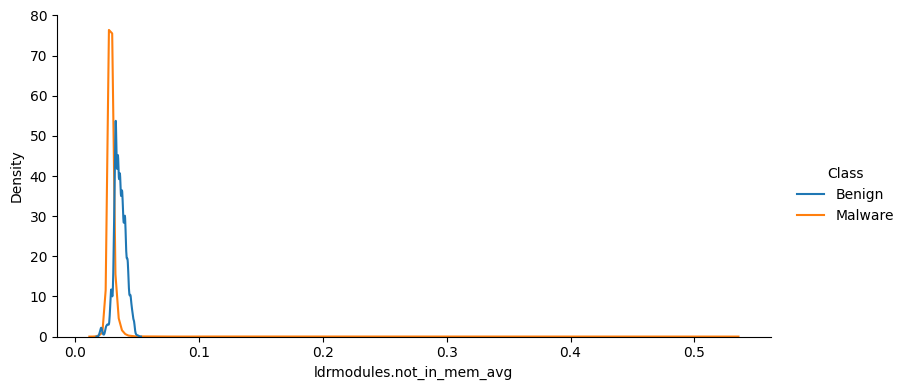

ldrmodules.not_in_mem_avg                                        
                                mean    median       std       max       min
Category                                                                    
Benign                      0.036458  0.036320  0.004753  0.051618  0.019397
Ransomware                  0.030250  0.028760  0.015197  0.441441  0.017563
Spyware                     0.029918  0.028846  0.011504  0.531120  0.016176
Trojan                      0.029503  0.029302  0.004870  0.227848  0.018559

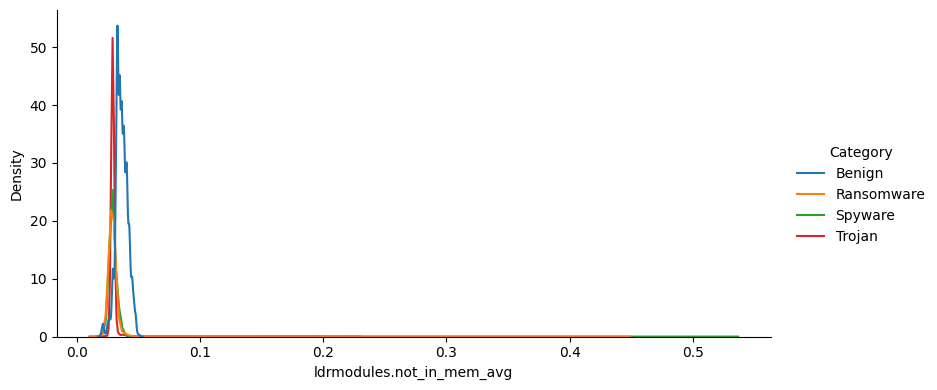

ldrmodules.not_in_mem_avg                                        
                                  mean    median       std       max       min
Family                                                                        
180solutions                  0.029939  0.029211  0.008538  0.256198  0.020170
Ako                           0.030329  0.028791  0.014117  0.323017  0.025082
Benign                        0.036458  0.036320  0.004753  0.051618  0.019397
CWS                           0.030475  0.028747  0.020575  0.531120  0.017454
Conti                         0.030564  0.028935  0.016024  0.390863  0.020234
Emotet                        0.030170  0.029145  0.010342  0.227848  0.023747
Gator                         0.031794  0.029877  0.011343  0.281385  0.019272
Maze                          0.029175  0.028296  0.014715  0.441441  0.020277
Pysa                          0.028886  0.028508  0.008352  0.338843  0.017563
Reconyc                       0.029594  0.029506  0.001411  0.037845  0.018559
Refroso                       0.029297  0.029392  0.000836  0.037146  0.026948
Scar                          0.029450  0.029412  0.001044  0.034340  0.026667
Shade                         0.031830  0.029212  0.019226  0.431373  0.025513
TIBS                          0.027557  0.027852  0.002255  0.035553  0.017525
Transponder                   0.029264  0.028754  0.003302  0.097561  0.016176
Zeus                          0.029023  0.028801  0.001815  0.060699  0.025770

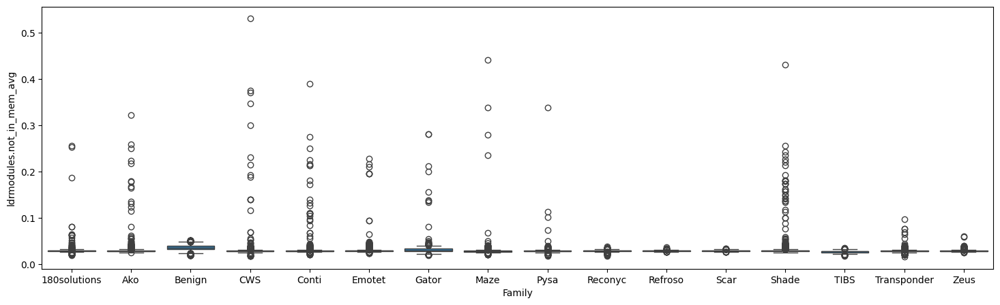

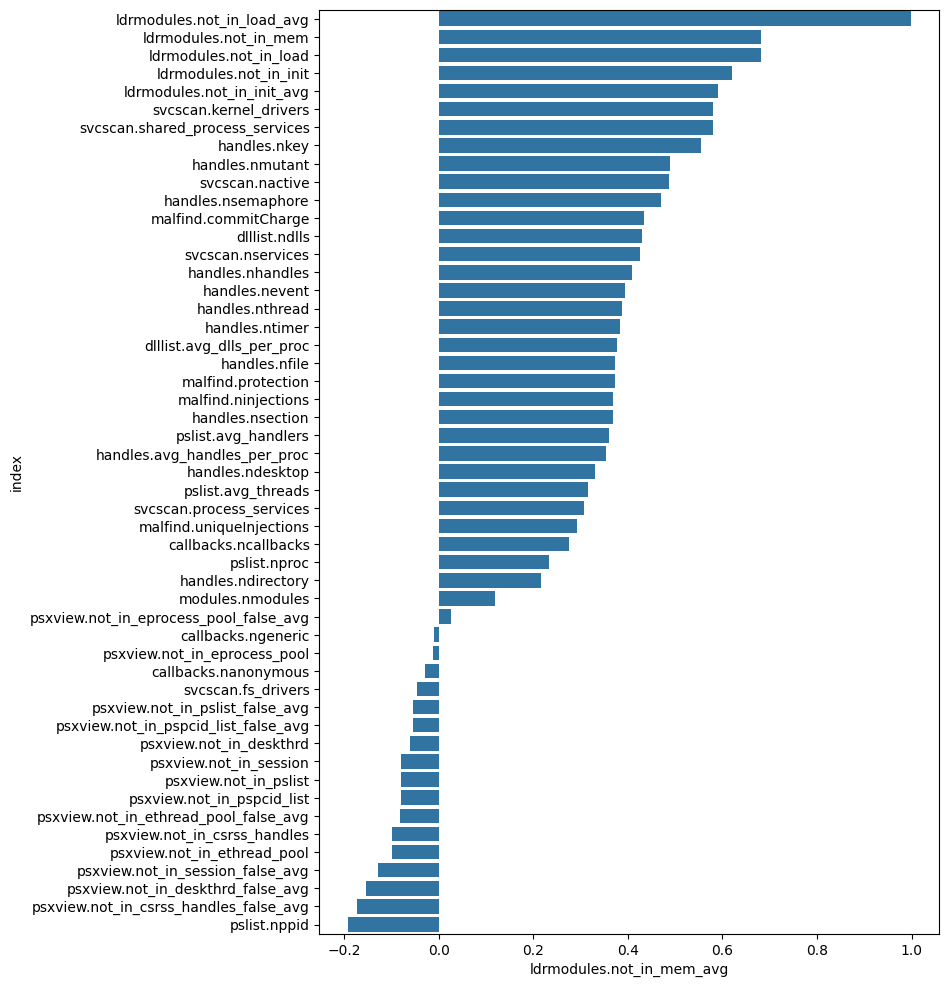

,malfind.ninjections
mean,7.041656
median,4.000000
std,15.445368
max,627.000000
min,1.000000


malfind.ninjections                           
                       mean median        std  max min
Class                                                 
Benign             4.958366    4.0   2.465543   21   1
Malware            9.154949    3.0  21.576086  627   1

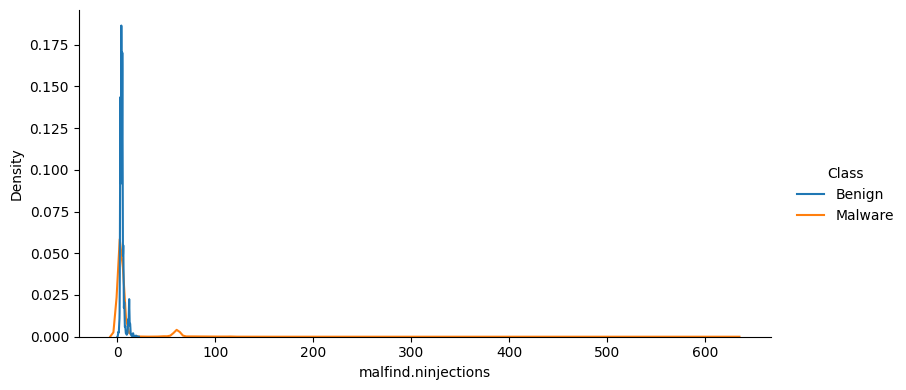

malfind.ninjections                           
                          mean median        std  max min
Category                                                 
Benign                4.958366    4.0   2.465543   21   1
Ransomware           10.288999    3.0  20.493224  125   1
Spyware              12.005607    3.0  27.099829  627   1
Trojan                5.065506    3.0  14.378478  266   1

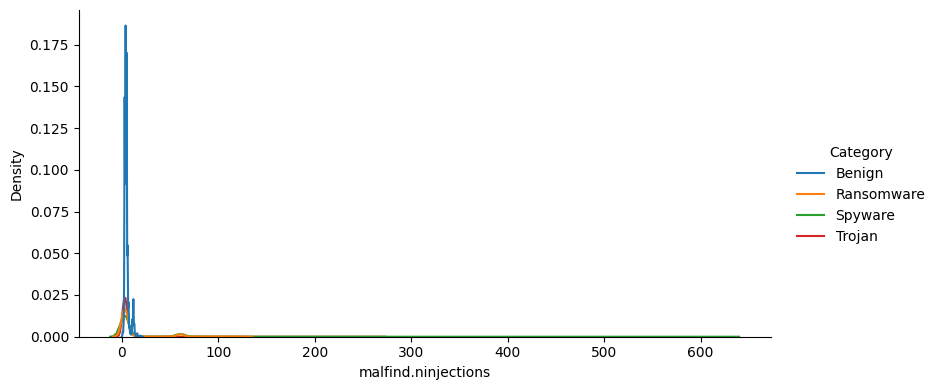

malfind.ninjections                           
                            mean median        std  max min
Family                                                     
180solutions            5.403702    3.0  10.279215   85   1
Ako                    19.684500    3.0  26.848732  117   1
Benign                  4.958366    4.0   2.465543   21   1
CWS                    22.933500    3.0  46.863463  627   1
Conti                   3.546553    3.0   5.900332  105   1
Emotet                  5.725979    3.0  19.929623  265   1
Gator                   3.018556    3.0   0.551563    6   1
Maze                    9.529647    3.0  17.899430  102   1
Pysa                   16.895657    3.0  29.862984  125   1
Reconyc                 3.216837    3.0   1.208425   25   1
Refroso                 5.567635    3.0   6.350729   79   2
Scar                    5.513500    3.0  21.289844  266   2
Shade                   3.229431    3.0   1.453260   18   1
TIBS                   10.142045    3.0  20.127765   90   1
Transponder            16.939394    3.0  24.802267  100   1
Zeus                    4.912263    3.0   9.688156  122   2

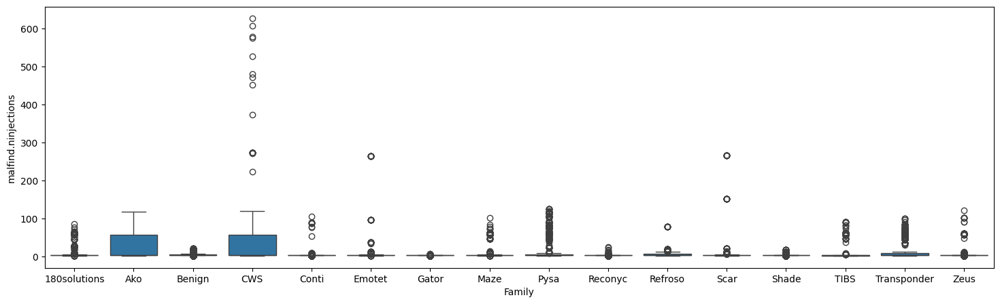

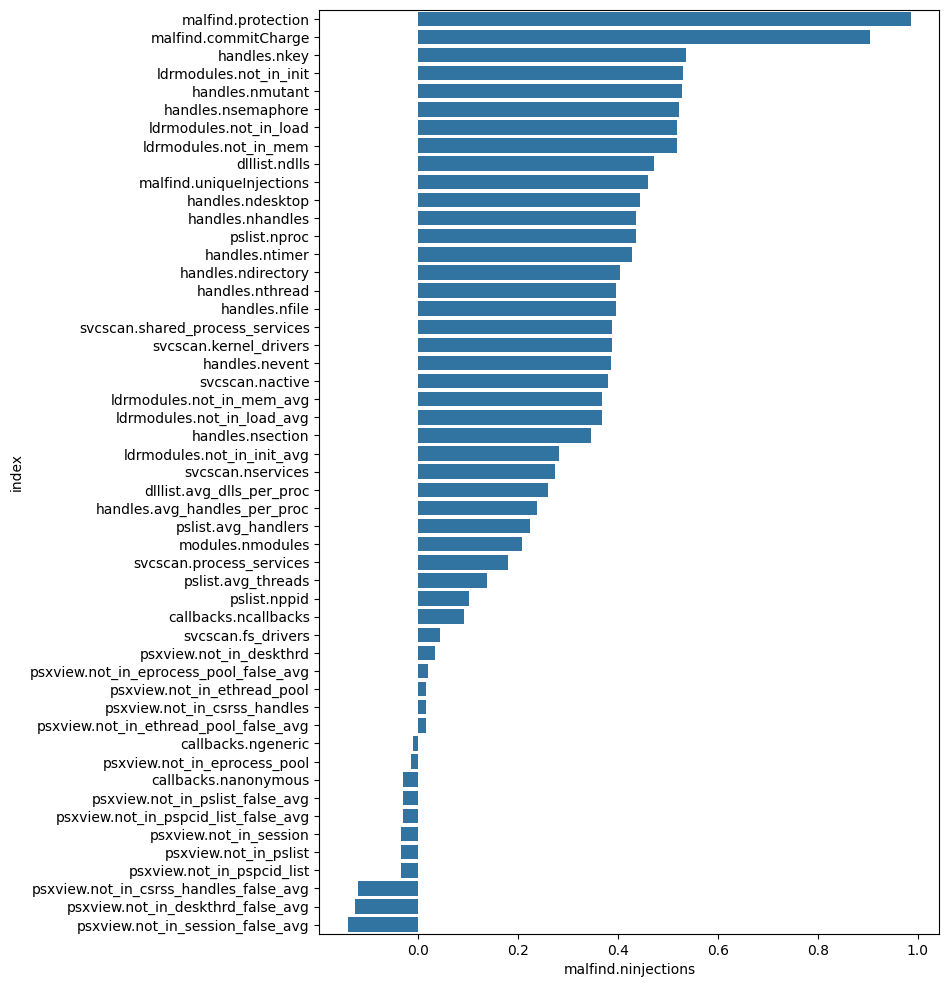

,malfind.commitCharge
mean,977.440953
median,4.000000
std,6067.799867
max,220850.000000
min,1.000000


malfind.commitCharge                                
                        mean median          std     max min
Class                                                       
Benign             10.287024    5.0    16.983703      88   1
Malware          1958.523563    3.0  8500.364231  220850   1

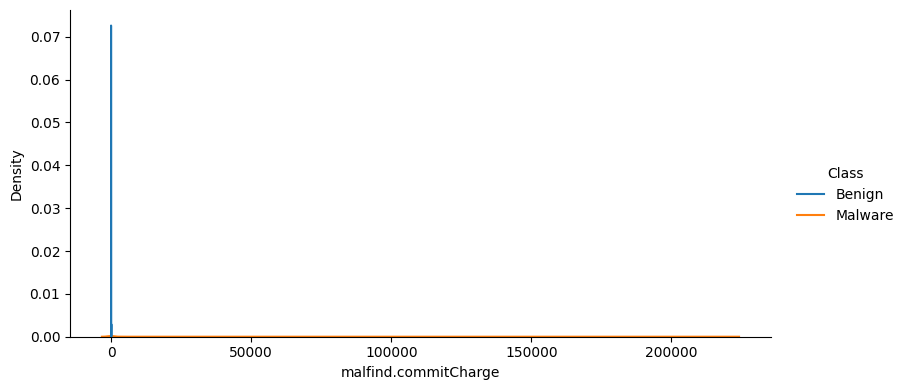

malfind.commitCharge                                 
                           mean median           std     max min
Category                                                        
Benign                10.287024    5.0     16.983703      88   1
Ransomware          2055.734306    3.0   6403.899615  174368   1
Spyware             2388.295821    3.0   6196.086234   31513   1
Trojan              1416.108439    3.0  11756.619535  220850   1

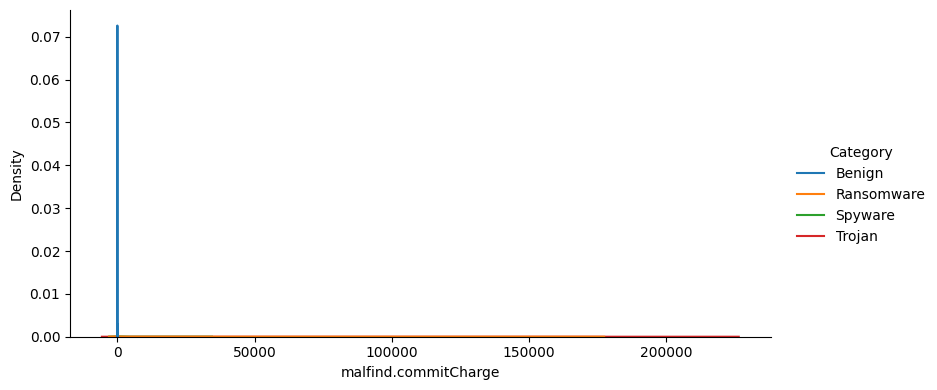

malfind.commitCharge                                 
                             mean median           std     max min
Family                                                            
180solutions           555.496248    3.0   3080.702286   27522   1
Ako                   4736.321500    3.0   8147.403036   28153   1
Benign                  10.287024    5.0     16.983703      88   1
CWS                   4706.273500    3.0   8089.401402   31513   1
Conti                  121.833417    3.0   1575.042875   23620   1
Emotet                  28.641078    3.0    306.036805    4280   1
Gator                    3.742728    3.0      8.701236     125   1
Maze                  1849.163626    3.0   5506.445036   18852   1
Pysa                  3985.241255    3.0   9914.377518  174368   1
Reconyc                  6.265306    3.0     17.235181     201   1
Refroso                 20.511523    3.0     30.892608     163   2
Scar                    19.196000    3.0    130.901322    1749   2
Shade                    8.103432    3.0     40.794020     527   1
TIBS                  2357.096591    3.0   6156.027201   21599   1
Transponder           3976.730178    3.0   7586.949095   28033   1
Zeus                  6813.347358    3.0  25214.483784  220850   2

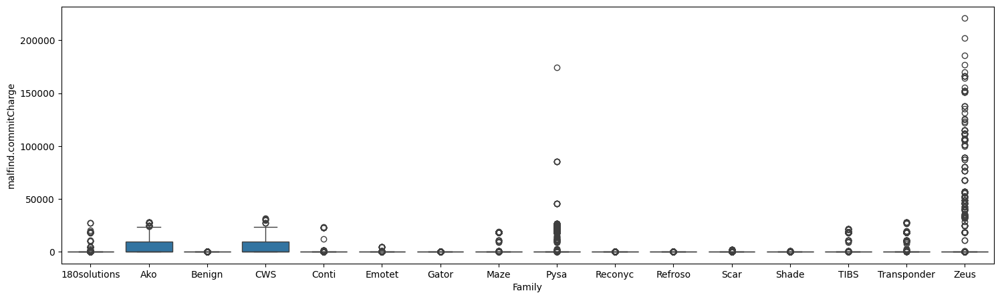

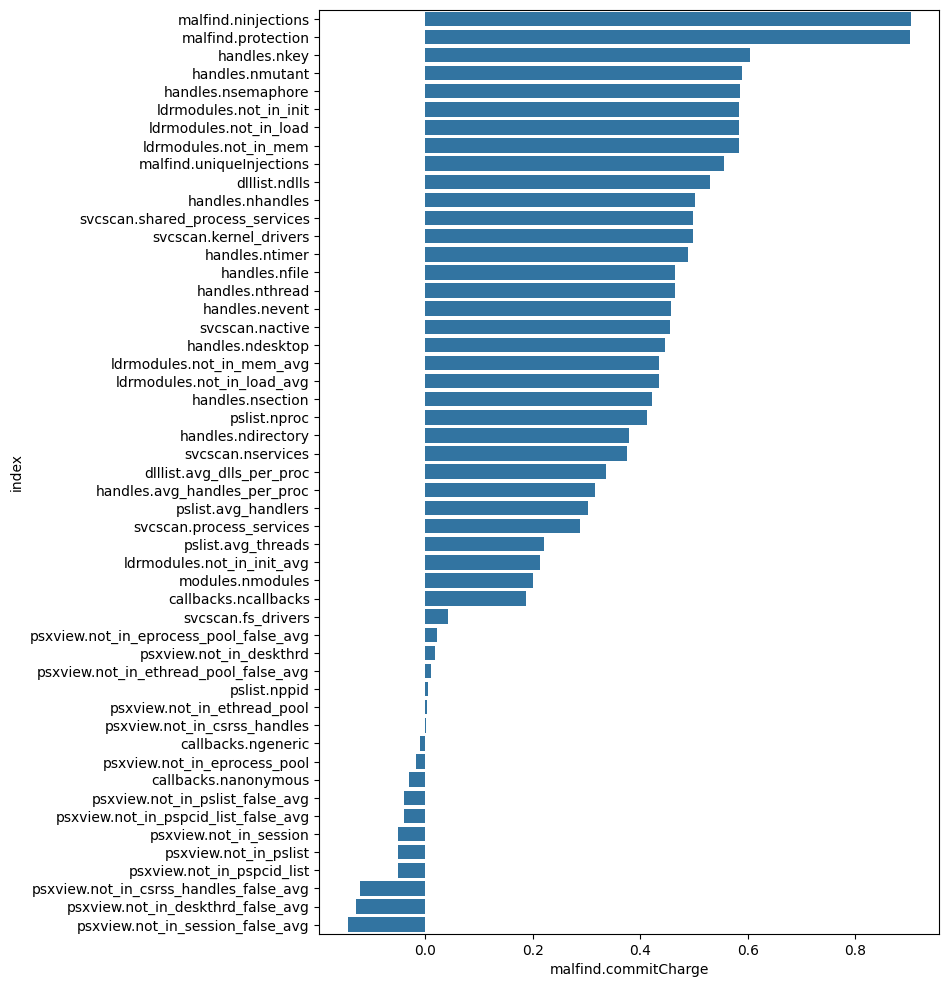

,malfind.protection
mean,42.472789
median,24.000000
std,92.664894
max,3762.000000
min,6.000000


malfind.protection                             
                      mean median         std   max min
Class                                                  
Benign           30.192741   25.0   15.070302   126   6
Malware          54.929692   18.0  129.456519  3762   6

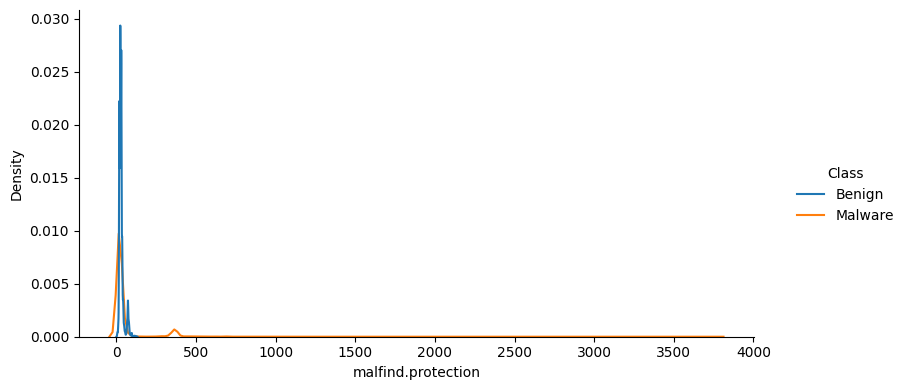

malfind.protection                             
                         mean median         std   max min
Category                                                  
Benign              30.192741   25.0   15.070302   126   6
Ransomware          61.733991   18.0  122.959342   750   6
Spyware             72.033639   18.0  162.598973  3762   6
Trojan              30.393038   18.0   86.270866  1596   6

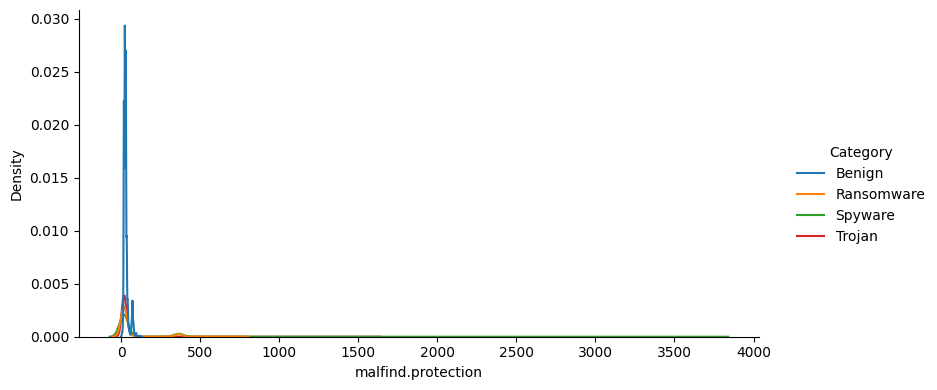

malfind.protection                             
                           mean median         std   max min
Family                                                      
180solutions          32.422211   18.0   61.675292   510   6
Ako                  118.107000   18.0  161.092389   702   6
Benign                30.192741   25.0   15.070302   126   6
CWS                  137.601000   18.0  281.180778  3762   6
Conti                 21.279316   18.0   35.401993   630   6
Emotet                34.355872   18.0  119.577739  1590   6
Gator                 18.111334   18.0    3.309377    36   6
Maze                  57.177879   18.0  107.396580   612   6
Pysa                 101.373945   18.0  179.177902   750   6
Reconyc               19.301020   18.0    7.250549   150   6
Refroso               33.405812   18.0   38.104376   474  12
Scar                  33.081000   18.0  127.739062  1596  12
Shade                 19.376587   18.0    8.719561   108   6
TIBS                  60.852273   18.0  120.766591   540   6
Transponder          101.636364   18.0  148.813605   600   6
Zeus                  29.473576   18.0   58.128936   732  12

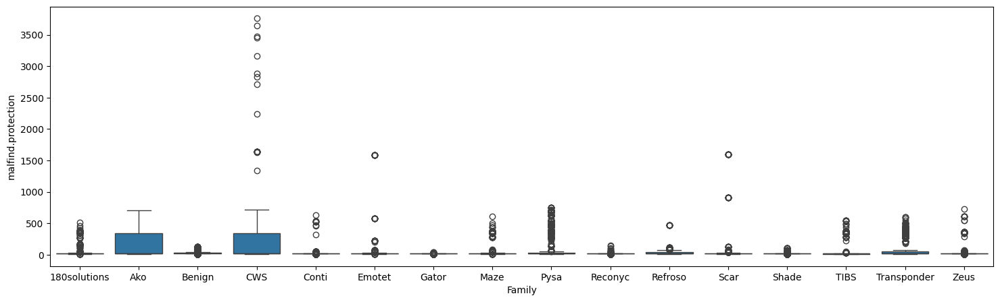

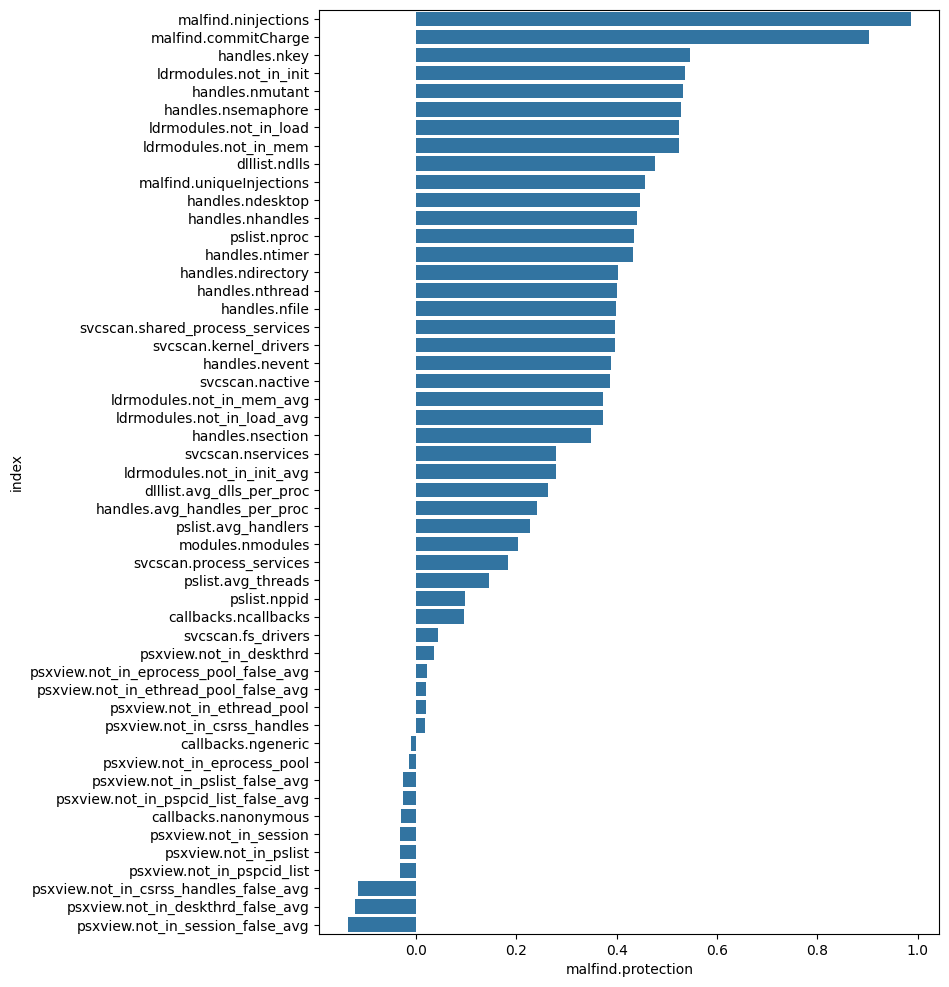

,malfind.uniqueInjections
mean,1.739232
median,1.250000
std,2.751800
max,90.666667
min,1.000000


malfind.uniqueInjections                                    
                            mean    median       std        max  min
Class                                                               
Benign                  1.366290  1.333333  0.177211   2.000000  1.0
Malware                 2.117545  1.000000  3.864978  90.666667  1.0

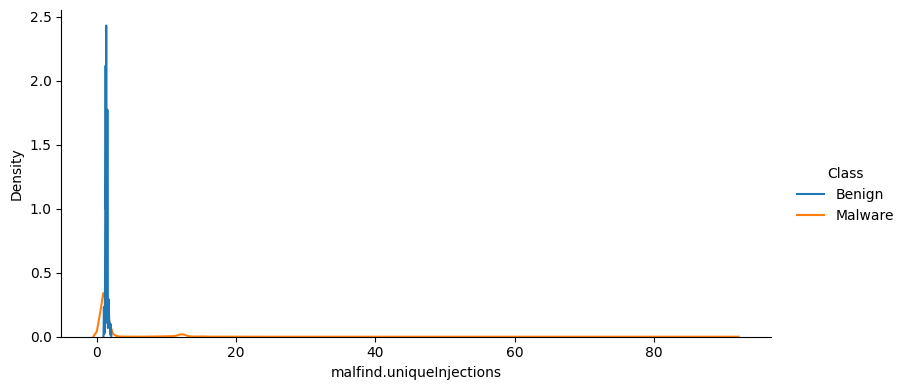

malfind.uniqueInjections                                    
                               mean    median       std        max  min
Category                                                               
Benign                     1.366290  1.333333  0.177211   2.000000  1.0
Ransomware                 2.317858  1.000000  3.685303  22.600000  1.0
Spyware                    2.659460  1.000000  4.476335  90.666667  1.0
Trojan                     1.355480  1.000000  3.178409  66.500000  1.0

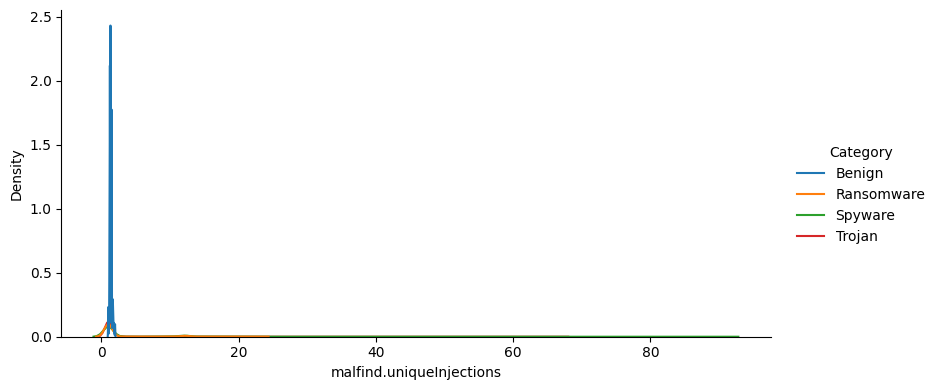

malfind.uniqueInjections                                    
                                 mean    median       std        max  min
Family                                                                   
180solutions                 1.418935  1.000000  2.017673  17.000000  1.0
Ako                          4.121438  1.000000  4.969519  19.500000  1.0
Benign                       1.366290  1.333333  0.177211   2.000000  1.0
CWS                          4.436013  1.000000  6.936794  90.666667  1.0
Conti                        1.083423  1.000000  1.138051  22.000000  1.0
Emotet                       1.345452  1.000000  3.827465  66.000000  1.0
Gator                        1.009353  1.000000  0.047788   1.333333  1.0
Maze                         2.223512  1.000000  3.429154  15.250000  1.0
Pysa                         3.363624  1.000000  5.023781  22.600000  1.0
Reconyc                      1.019777  1.000000  0.105088   2.000000  1.0
Refroso                      1.489947  1.000000  1.456043  19.750000  1.0
Scar                         1.539096  1.000000  5.294658  66.500000  1.0
Shade                        1.037778  1.000000  0.258590   5.666667  1.0
TIBS                         2.526649  1.000000  3.936507  22.250000  1.0
Transponder                  3.657388  1.000000  4.699228  16.500000  1.0
Zeus                         1.309548  1.000000  1.810947  25.250000  1.0

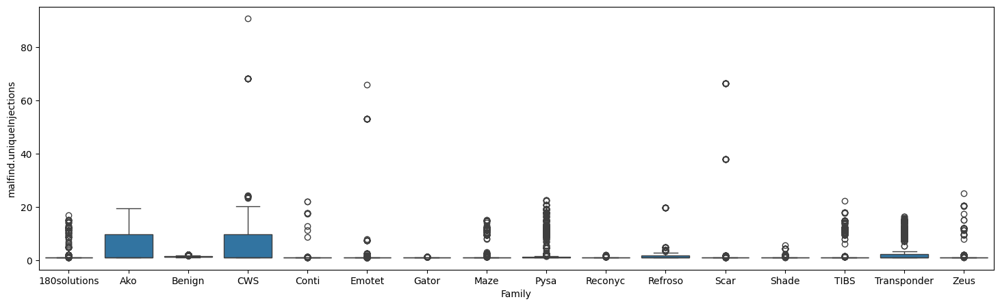

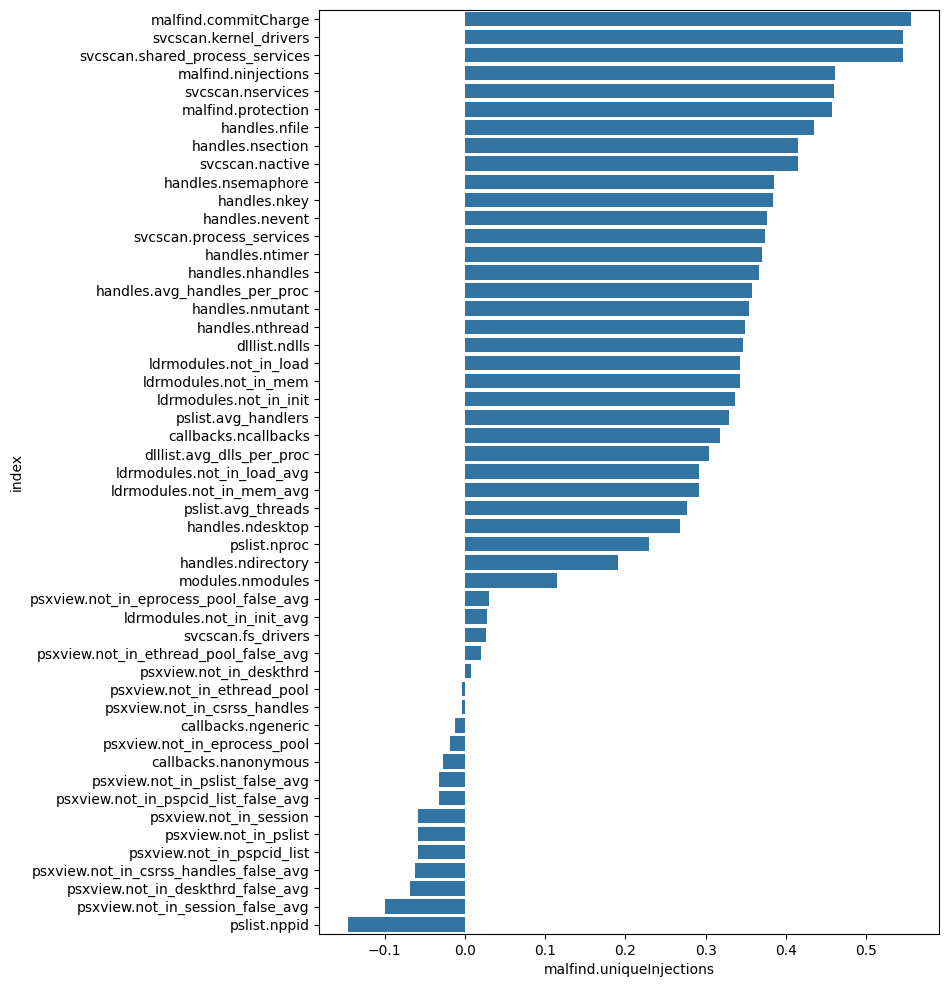

,psxview.not_in_pslist
mean,1.873637
median,1.000000
std,2.999667
max,43.000000
min,0.000000


psxview.not_in_pslist                         
                         mean median       std max min
Class                                                 
Benign               1.684102    0.0  3.055541  18   0
Malware              2.065901    1.0  2.929455  43   0

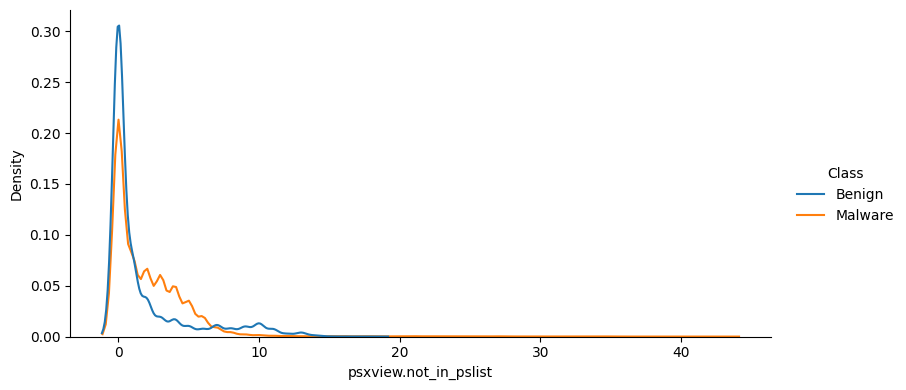

psxview.not_in_pslist                         
                            mean median       std max min
Category                                                 
Benign                  1.684102    0.0  3.055541  18   0
Ransomware              1.873294    1.0  2.864720  43   0
Spyware                 2.380836    1.0  3.568979  36   0
Trojan                  1.933544    1.0  2.121883  30   0

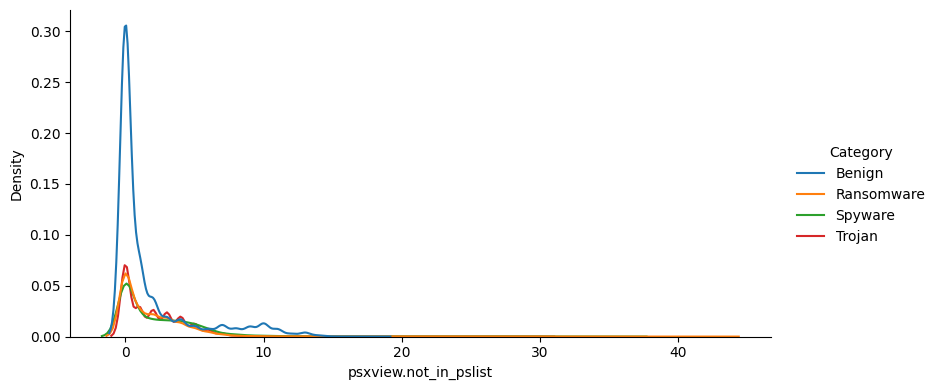

psxview.not_in_pslist                         
                              mean median       std max min
Family                                                     
180solutions              1.969485    1.0  2.189832  18   0
Ako                       2.303500    1.0  3.820299  43   0
Benign                    1.684102    0.0  3.055541  18   0
CWS                       3.133500    2.0  4.780492  36   0
Conti                     1.565174    1.0  1.857229  13   0
Emotet                    1.559736    1.0  1.763587   9   0
Gator                     1.696088    0.0  2.202246  11   0
Maze                      1.885405    1.0  2.791271  33   0
Pysa                      2.310615    2.0  3.506441  37   0
Reconyc                   1.882653    1.0  2.017538  13   0
Refroso                   1.959920    1.0  2.066900   9   0
Scar                      2.012500    1.0  2.411068  30   0
Shade                     1.405736    1.0  1.784596   9   0
TIBS                      1.369318    0.0  2.039056  17   0
Transponder               3.255293    2.0  4.486691  35   0
Zeus                      2.243715    2.0  2.215453  17   0

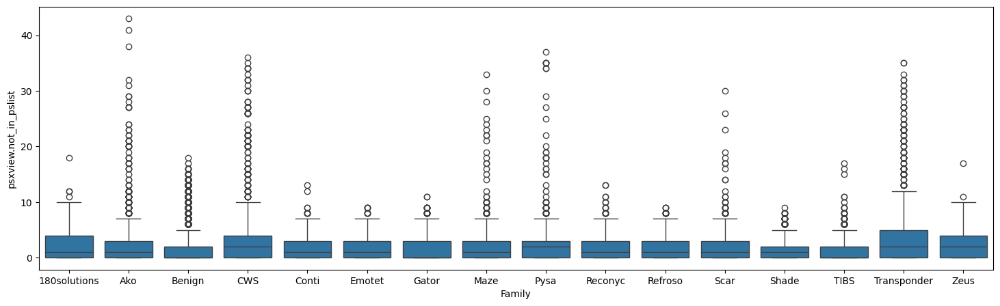

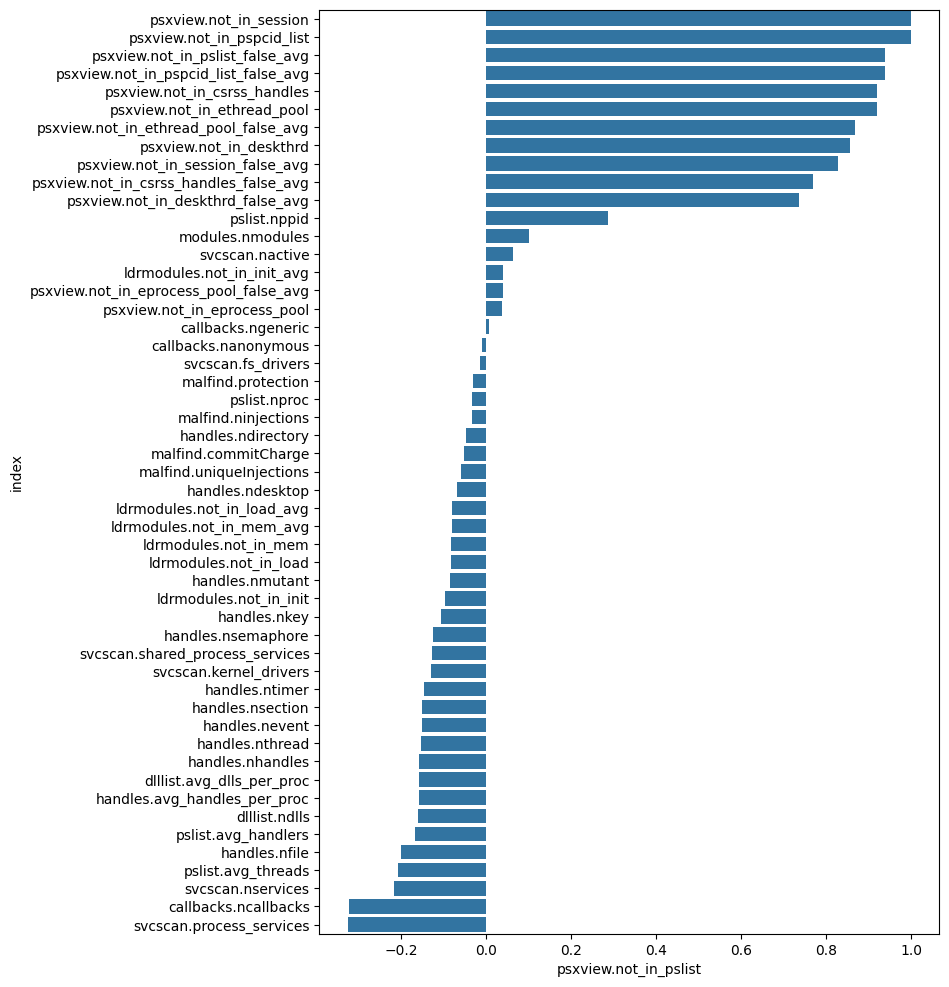

,psxview.not_in_eprocess_pool
mean,0.002102
median,0.000000
std,0.045797
max,1.000000
min,0.000000


psxview.not_in_eprocess_pool                        
                                mean median      std max min
Class                                                       
Benign                      0.000547    0.0  0.02339   1   0
Malware                     0.003679    0.0  0.06054   1   0

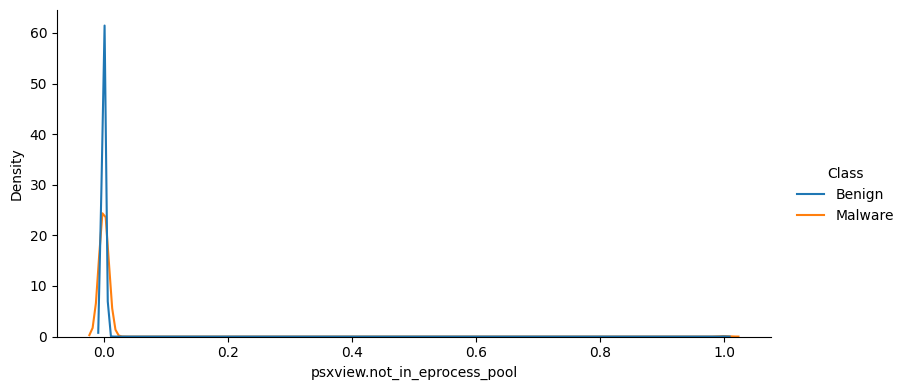

psxview.not_in_eprocess_pool                         
                                   mean median       std max min
Category                                                        
Benign                         0.000547    0.0  0.023390   1   0
Ransomware                     0.002939    0.0  0.054139   1   0
Spyware                        0.004689    0.0  0.068320   1   0
Trojan                         0.003376    0.0  0.058004   1   0

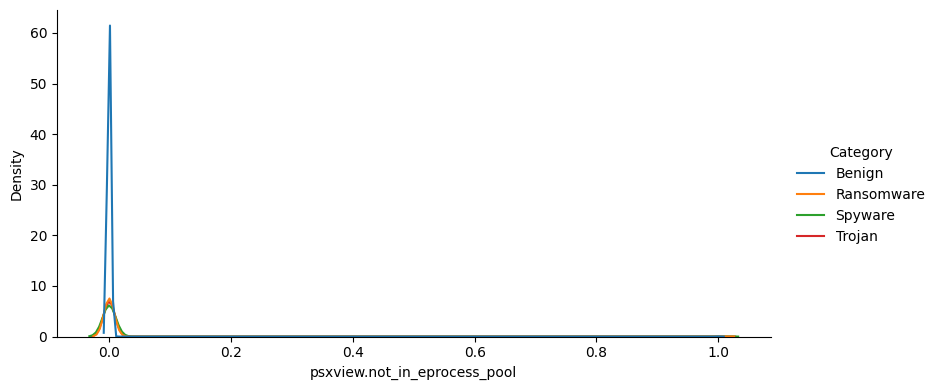

psxview.not_in_eprocess_pool                         
                                     mean median       std max min
Family                                                            
180solutions                     0.006003    0.0  0.077265   1   0
Ako                              0.002500    0.0  0.049950   1   0
Benign                           0.000547    0.0  0.023390   1   0
CWS                              0.004500    0.0  0.066948   1   0
Conti                            0.003020    0.0  0.054882   1   0
Emotet                           0.005084    0.0  0.071138   1   0
Gator                            0.004514    0.0  0.067048   1   0
Maze                             0.002281    0.0  0.047714   1   0
Pysa                             0.000603    0.0  0.024559   1   0
Reconyc                          0.003189    0.0  0.056397   1   0
Refroso                          0.004008    0.0  0.063198   1   0
Scar                             0.002000    0.0  0.044688   1   0
Shade                            0.005642    0.0  0.074917   1   0
TIBS                             0.002841    0.0  0.053243   1   0
Transponder                      0.004981    0.0  0.070417   1   0
Zeus                             0.002565    0.0  0.050598   1   0

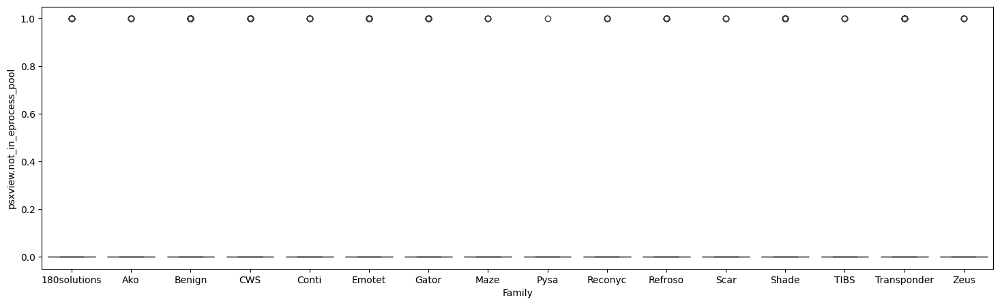

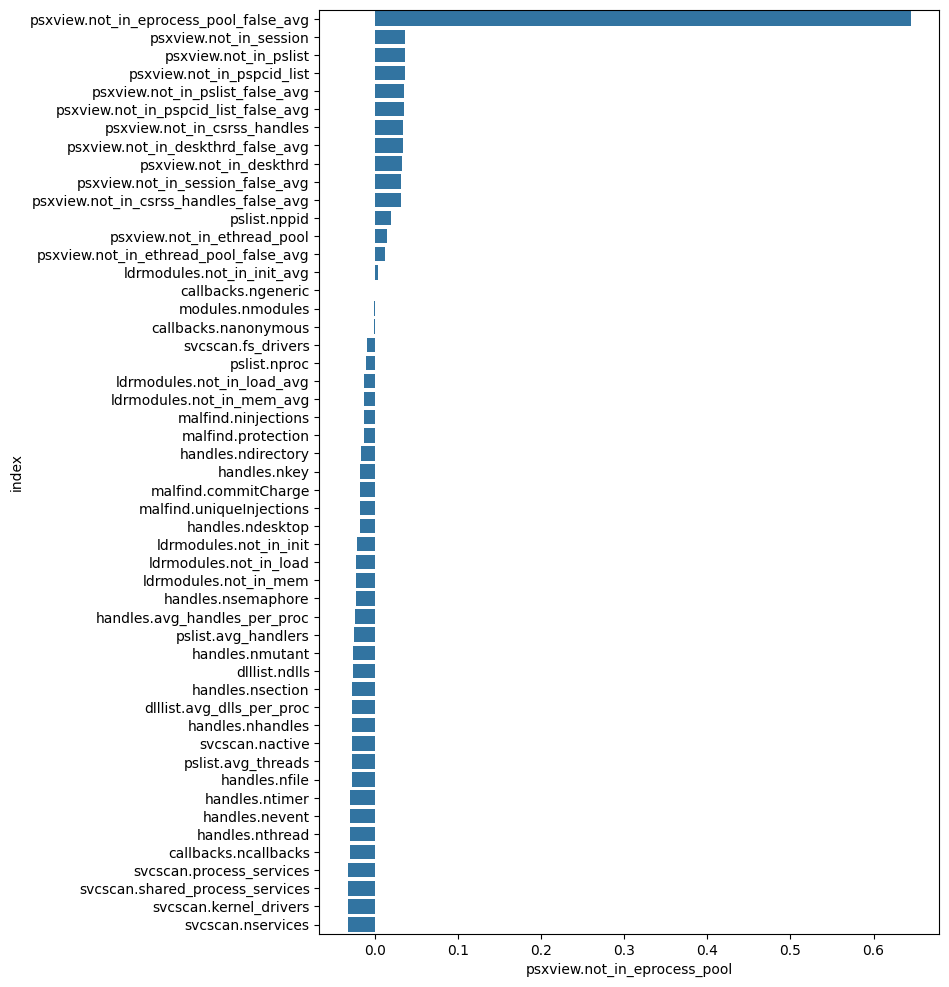

,psxview.not_in_ethread_pool
mean,2.269506
median,1.000000
std,4.621929
max,201.000000
min,0.000000


psxview.not_in_ethread_pool                          
                               mean median       std  max min
Class                                                        
Benign                     1.979645    0.0  3.446343   21   0
Malware                    2.563541    1.0  5.550930  201   0

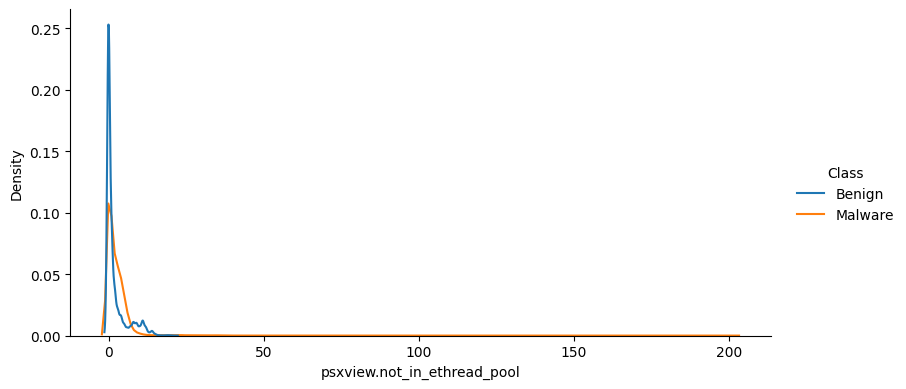

psxview.not_in_ethread_pool                          
                                  mean median       std  max min
Category                                                        
Benign                        1.979645    0.0  3.446343   21   0
Ransomware                    2.633109    1.0  6.891409  152   0
Spyware                       2.919980    2.0  5.747323  151   0
Trojan                        2.124789    2.0  3.381521  201   0

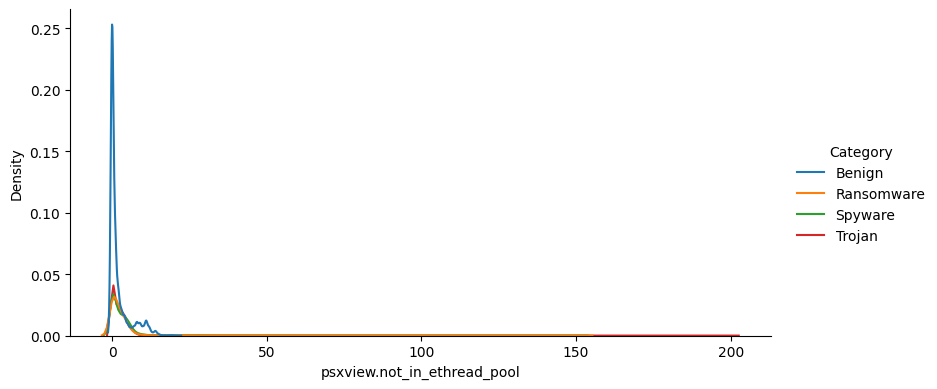

psxview.not_in_ethread_pool                           
                                    mean median        std  max min
Family                                                             
180solutions                    2.203102    2.0   2.480509   34   0
Ako                             3.975500    2.0  11.144550  152   0
Benign                          1.979645    0.0   3.446343   21   0
CWS                             4.029500    2.0   5.973983   45   0
Conti                           1.669854    1.0   1.936222   16   0
Emotet                          1.656329    1.0   1.820489    9   0
Gator                           1.743230    1.0   2.217991   11   0
Maze                            2.813569    1.0   7.308305  139   0
Pysa                            3.352835    2.0   7.260752  135   0
Reconyc                         2.249362    2.0   6.275808  201   0
Refroso                         2.055611    2.0   2.081404    9   0
Scar                            2.212500    2.0   2.983252   41   0
Shade                           1.560884    1.0   1.793668    9   0
TIBS                            1.556818    1.0   2.122652   18   0
Transponder                     4.364467    2.0   9.346060  151   0
Zeus                            2.478194    2.0   2.583147   36   0

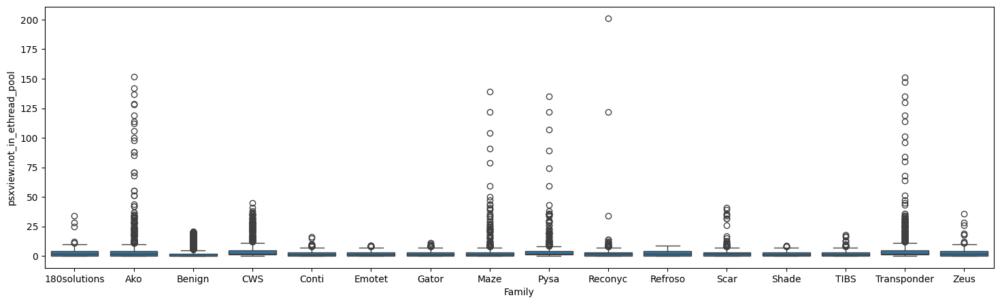

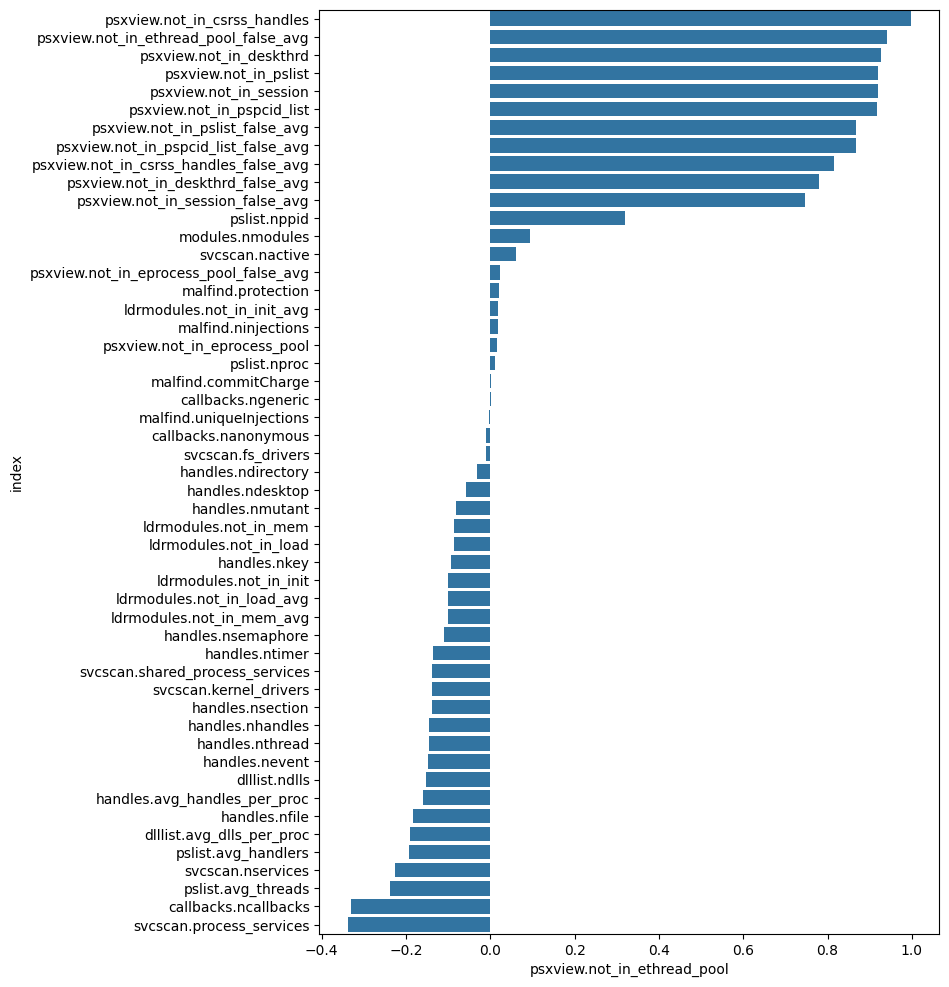

,psxview.not_in_pspcid_list
mean,1.877289
median,1.000000
std,3.021552
max,43.000000
min,0.000000


psxview.not_in_pspcid_list                         
                              mean median       std max min
Class                                                      
Benign                    1.683795    0.0  3.055515  18   0
Malware                   2.073570    1.0  2.973922  43   0

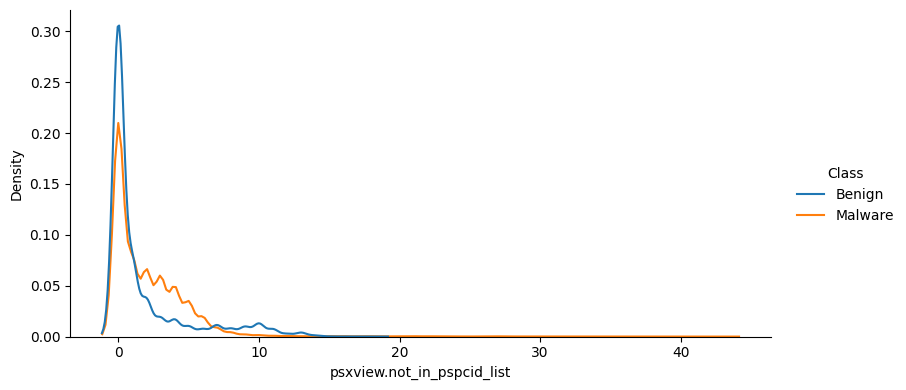

psxview.not_in_pspcid_list                         
                                 mean median       std max min
Category                                                      
Benign                       1.683795    0.0  3.055515  18   0
Ransomware                   1.893030    1.0  2.981659  43   0
Spyware                      2.380530    1.0  3.568654  36   0
Trojan                       1.937342    1.0  2.150444  36   0

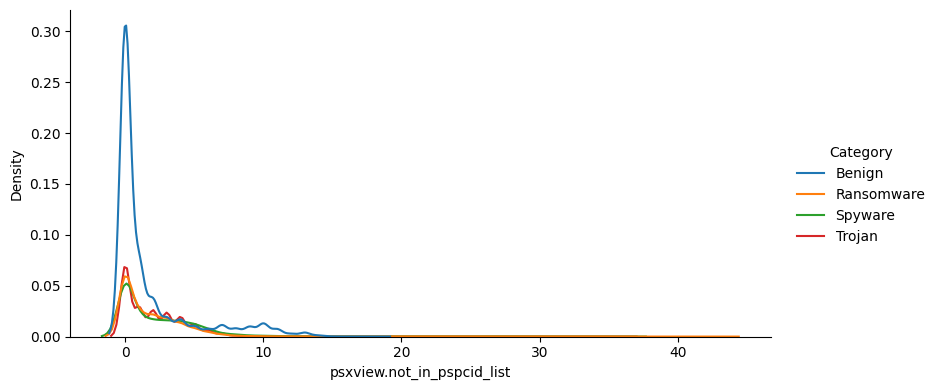

psxview.not_in_pspcid_list                         
                                   mean median       std max min
Family                                                          
180solutions                   1.968984    1.0  2.189939  18   0
Ako                            2.322000    1.0  3.901913  43   0
Benign                         1.683795    0.0  3.055515  18   0
CWS                            3.133500    2.0  4.780492  36   0
Conti                          1.602416    1.0  2.171164  39   0
Emotet                         1.578038    1.0  1.926652  36   0
Gator                          1.696088    0.0  2.202246  11   0
Maze                           1.907640    1.0  2.935807  40   0
Pysa                           2.310615    2.0  3.506441  37   0
Reconyc                        1.882653    1.0  2.017538  13   0
Refroso                        1.959920    1.0  2.066900   9   0
Scar                           2.012500    1.0  2.411068  30   0
Shade                          1.423601    1.0  1.952799  38   0
TIBS                           1.368608    0.0  2.039011  17   0
Transponder                    3.254878    2.0  4.485558  35   0
Zeus                           2.243715    2.0  2.215453  17   0

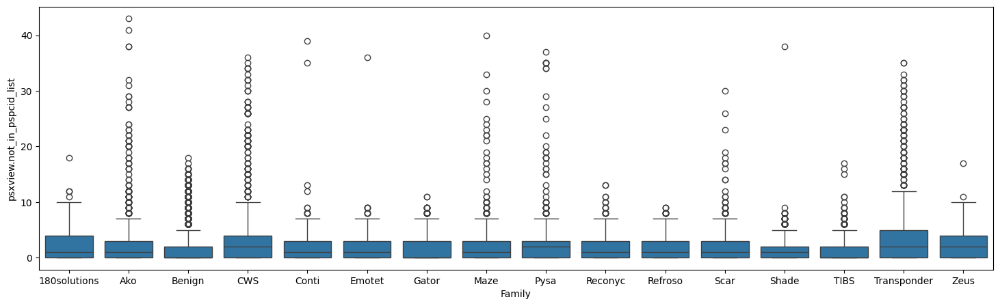

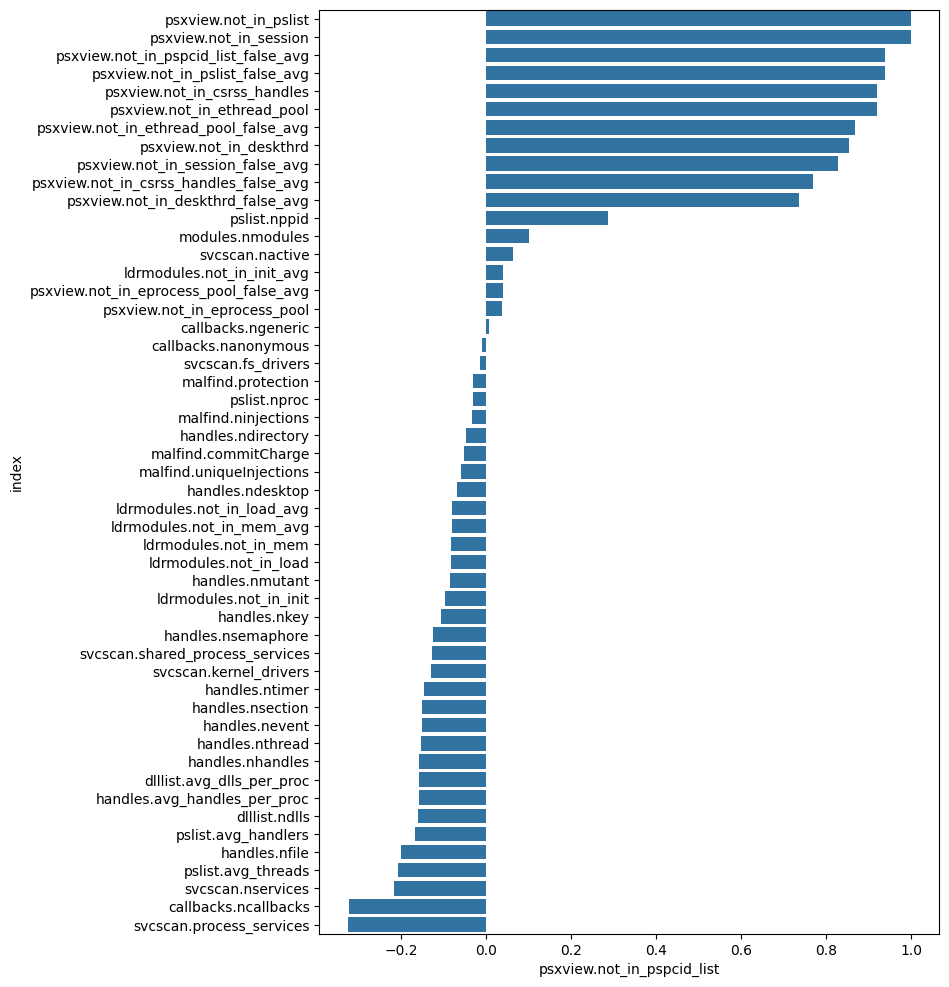

,psxview.not_in_csrss_handles
mean,6.272607
median,5.000000
std,4.622567
max,205.000000
min,4.000000


psxview.not_in_csrss_handles                          
                                mean median       std  max min
Class                                                         
Benign                      5.980705    4.0  3.446205   25   4
Malware                     6.568712    5.0  5.551869  205   4

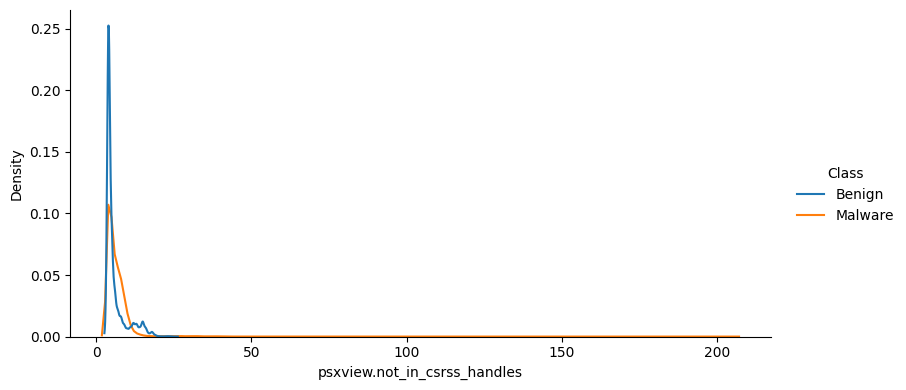

psxview.not_in_csrss_handles                          
                                   mean median       std  max min
Category                                                         
Benign                         5.980705    4.0  3.446205   25   4
Ransomware                     6.638568    5.0  6.891393  156   4
Spyware                        6.926504    6.0  5.749131  155   4
Trojan                         6.128270    6.0  3.382685  205   4

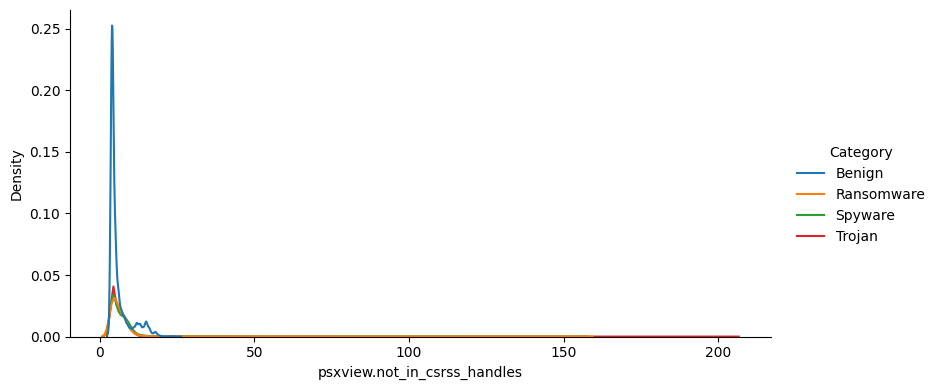

psxview.not_in_csrss_handles                           
                                     mean median        std  max min
Family                                                              
180solutions                     6.212606    6.0   2.483040   38   4
Ako                              7.981500    6.0  11.144786  156   4
Benign                           5.980705    4.0   3.446205   25   4
CWS                              8.039500    6.0   5.979533   49   4
Conti                            5.675893    5.0   1.940359   20   4
Emotet                           5.661413    5.0   1.821442   13   4
Gator                            5.747743    5.0   2.217491   15   4
Maze                             6.816420    5.0   7.307791  143   4
Pysa                             7.354644    6.0   7.260456  139   4
Reconyc                          6.252551    6.0   6.276342  205   4
Refroso                          6.059619    6.0   2.084662   13   4
Scar                             6.214500    6.0   2.982270   45   4
Shade                            5.570287    5.0   1.794111   13   4
TIBS                             5.559659    5.0   2.121905   22   4
Transponder                      8.369448    6.0   9.346842  155   4
Zeus                             6.481272    6.0   2.587738   40   4

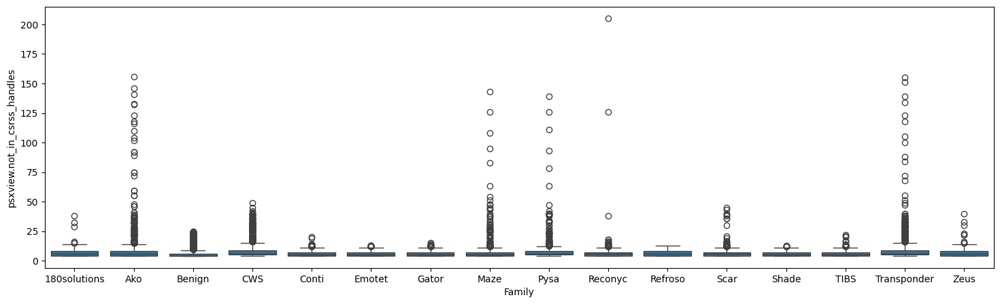

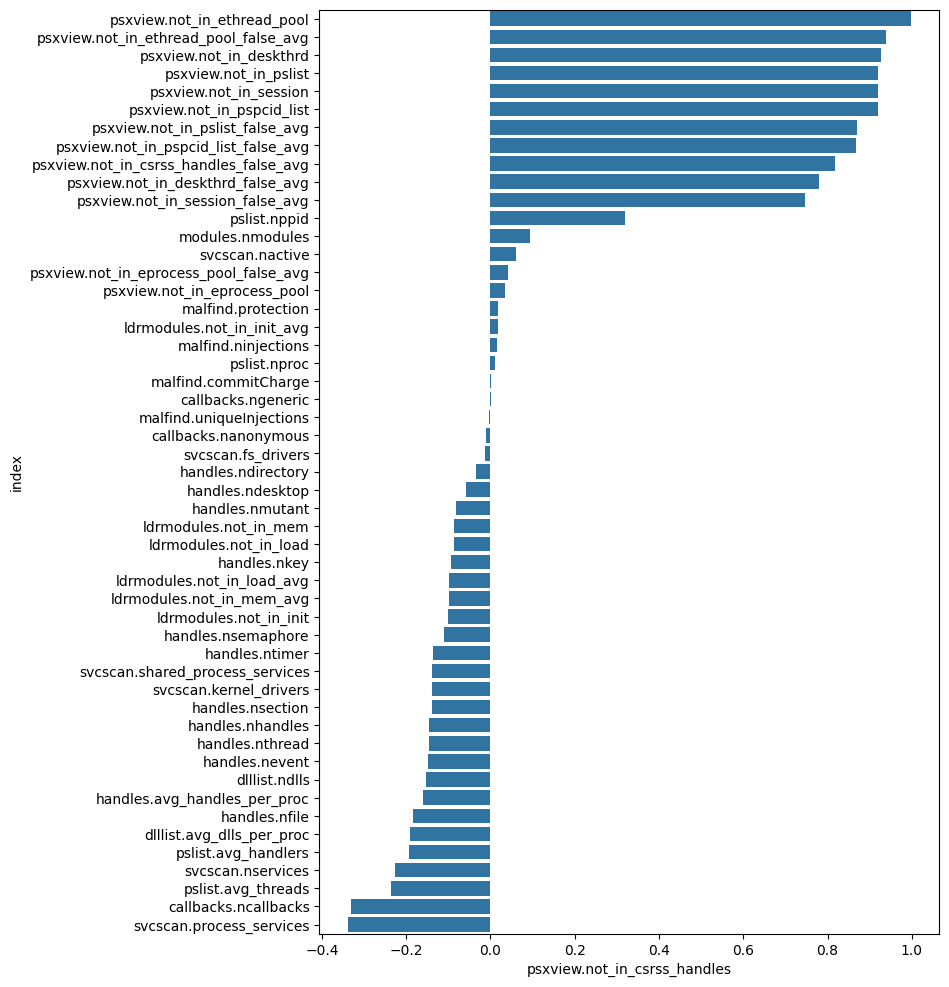

,psxview.not_in_session
mean,3.873396
median,3.000000
std,2.999674
max,45.000000
min,2.000000


psxview.not_in_session                         
                          mean median       std max min
Class                                                  
Benign                3.684102    2.0  3.055541  20   2
Malware               4.065415    3.0  2.929501  45   2

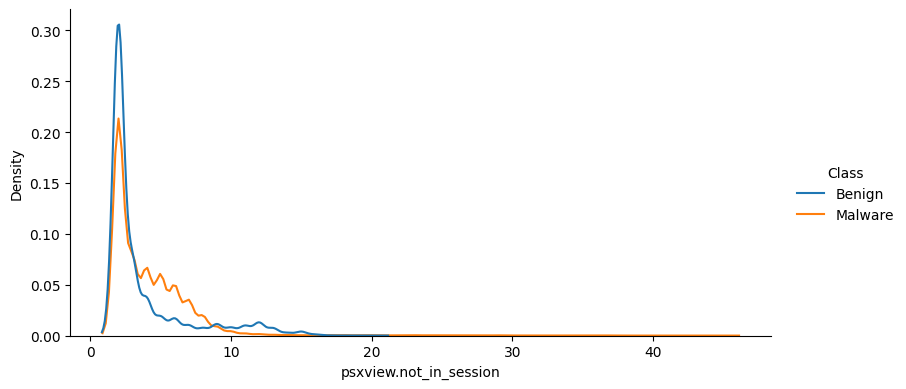

psxview.not_in_session                         
                             mean median       std max min
Category                                                  
Benign                   3.684102    2.0  3.055541  20   2
Ransomware               3.872874    3.0  2.864811  45   2
Spyware                  4.380224    3.0  3.568958  38   2
Trojan                   3.933122    3.0  2.122019  32   2

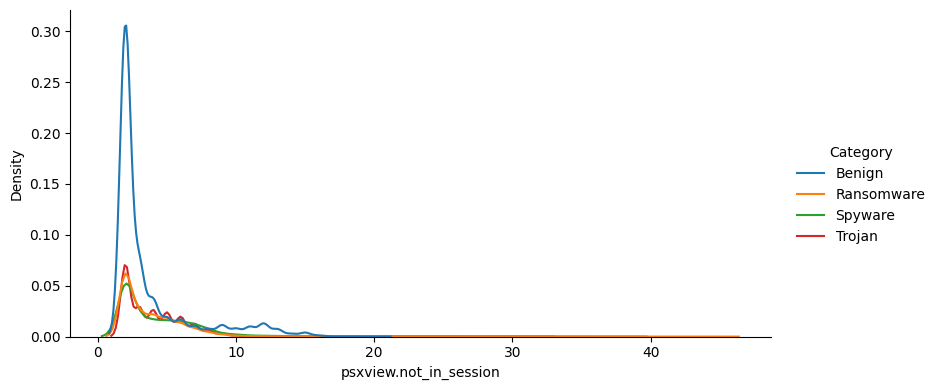

psxview.not_in_session                         
                               mean median       std max min
Family                                                      
180solutions               3.968484    3.0  2.189589  20   2
Ako                        4.303500    3.0  3.820299  45   2
Benign                     3.684102    2.0  3.055541  20   2
CWS                        5.133000    4.0  4.780768  38   2
Conti                      3.565174    3.0  1.857229  15   2
Emotet                     3.559227    3.0  1.763893  11   2
Gator                      3.696088    2.0  2.202246  13   2
Maze                       3.884265    3.0  2.791837  35   2
Pysa                       4.310012    4.0  3.506237  39   2
Reconyc                    3.882653    3.0  2.017538  15   2
Refroso                    3.959419    3.0  2.066527  11   2
Scar                       4.012500    3.0  2.411068  32   2
Shade                      3.405266    3.0  1.784835  11   2
TIBS                       3.367898    2.0  2.036872  19   2
Transponder                5.254878    4.0  4.486946  37   2
Zeus                       4.242689    4.0  2.216261  19   2

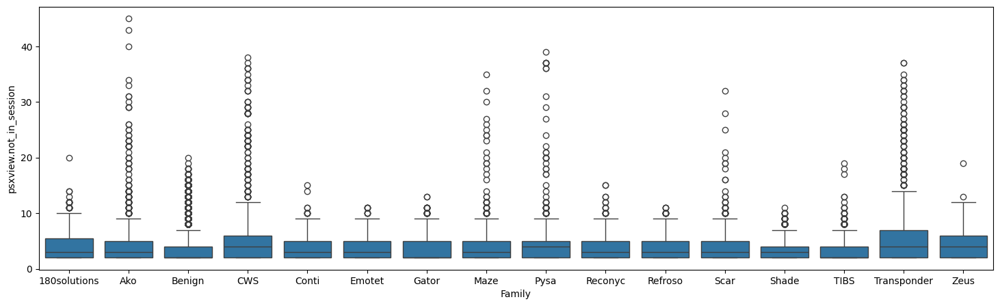

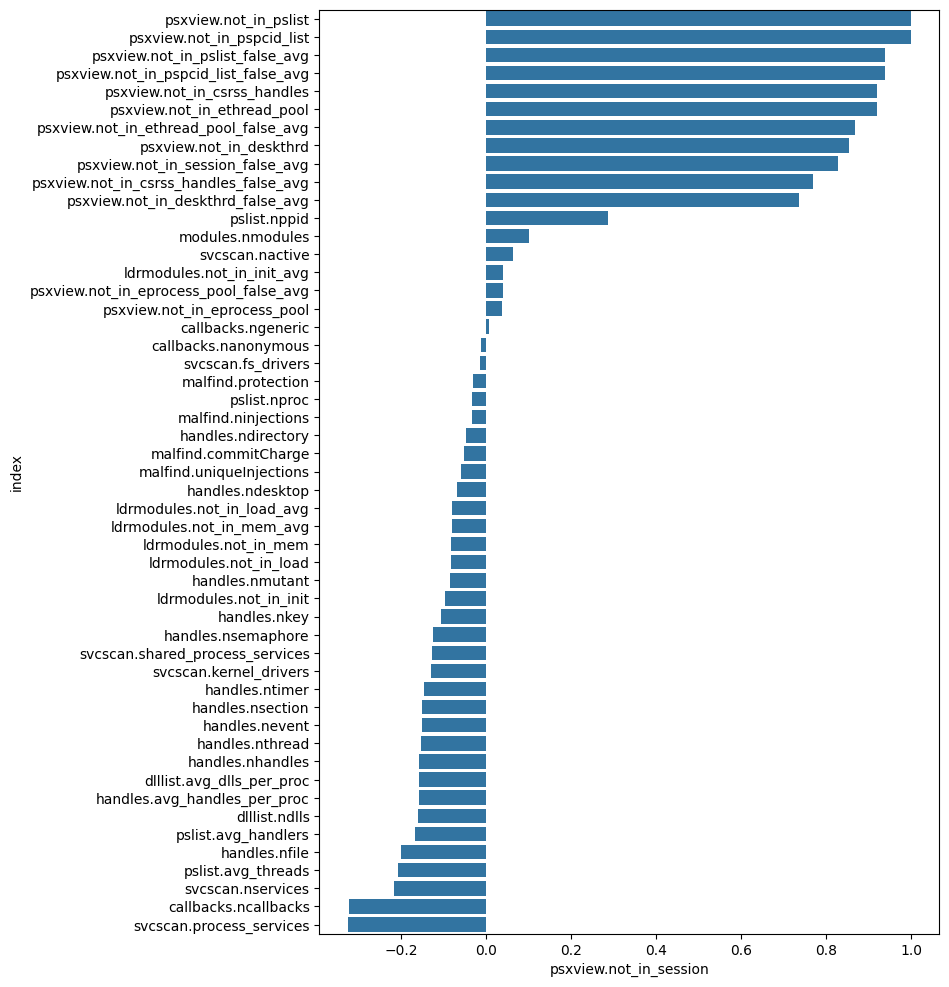

,psxview.not_in_deskthrd
mean,8.252692
median,7.000000
std,4.738305
max,207.000000
min,4.000000


psxview.not_in_deskthrd                          
                           mean median       std  max min
Class                                                    
Benign                 7.898977    6.0  3.528607   26   4
Malware                8.611501    8.0  5.686927  207   4

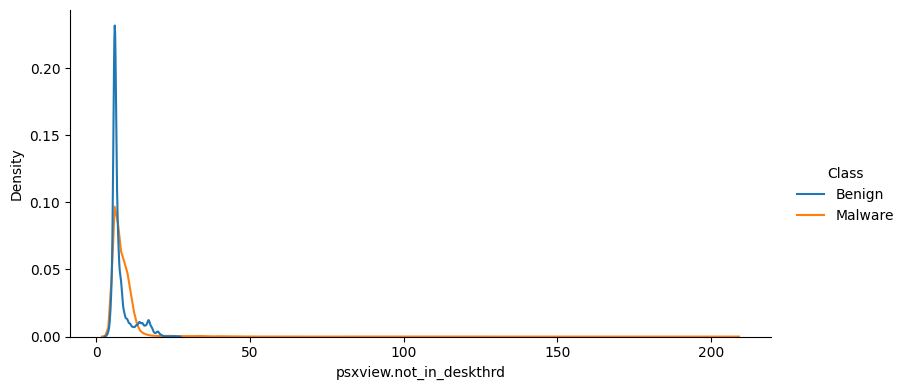

psxview.not_in_deskthrd                          
                              mean median       std  max min
Category                                                    
Benign                    7.898977    6.0  3.528607   26   4
Ransomware                8.780391    8.0  7.067389  158   4
Spyware                   8.885627    8.0  5.907084  156   4
Trojan                    8.158122    8.0  3.420861  207   4

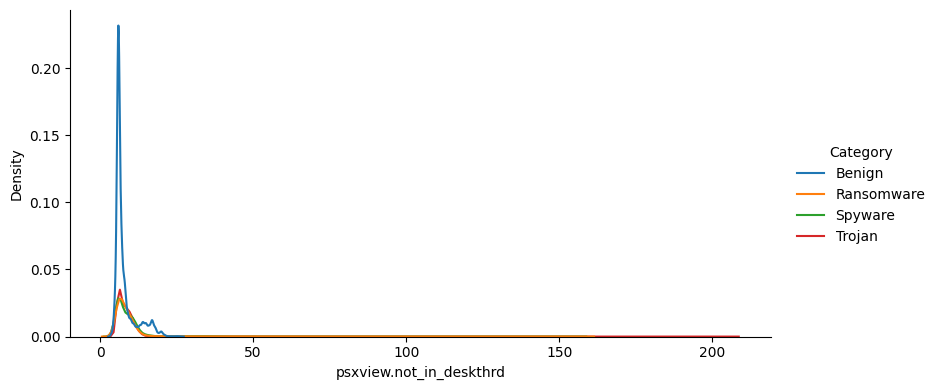

psxview.not_in_deskthrd                           
                                mean median        std  max min
Family                                                         
180solutions                8.187094    8.0   2.648023   40   4
Ako                        10.199500    8.0  11.310953  158   5
Benign                      7.898977    6.0   3.528607   26   4
CWS                        10.168500    8.0   6.174315   51   4
Conti                       7.795672    7.0   2.360194   26   4
Emotet                      7.726487    7.0   1.999345   15   5
Gator                       7.774323    7.0   2.380558   20   4
Maze                        8.844356    7.0   7.398313  145   4
Pysa                        9.431846    8.0   7.409189  141   4
Reconyc                     8.191964    8.0   6.296706  207   4
Refroso                     8.186373    8.0   2.104854   15   5
Scar                        8.183000    8.0   3.017957   46   5
Shade                       7.805360    7.0   2.505255   31   4
TIBS                        7.044744    6.0   2.472619   24   4
Transponder                10.396015    9.0   9.452675  156   4
Zeus                        8.512057    8.0   2.610688   42   5

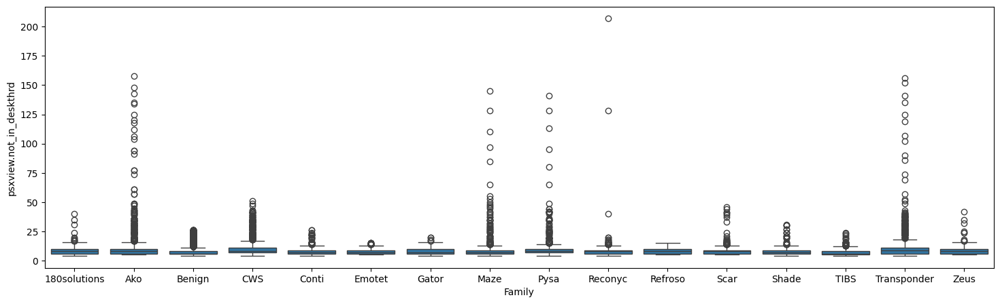

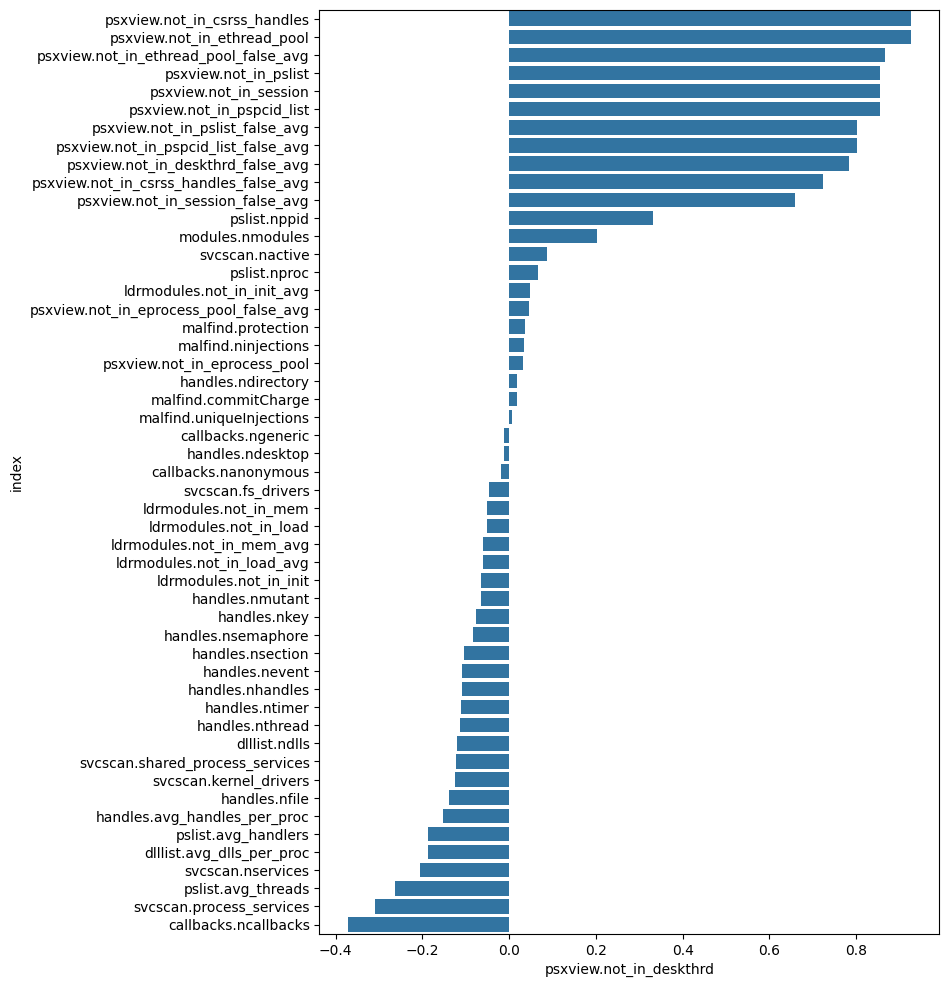

,psxview.not_in_pslist_false_avg
mean,0.040928
median,0.021551
std,0.057568
max,0.551282
min,0.000000


psxview.not_in_pslist_false_avg                                   
                                   mean    median       std       max  min
Class                                                                     
Benign                         0.036870  0.002861  0.060159  0.305085  0.0
Malware                        0.045045  0.024390  0.054508  0.551282  0.0

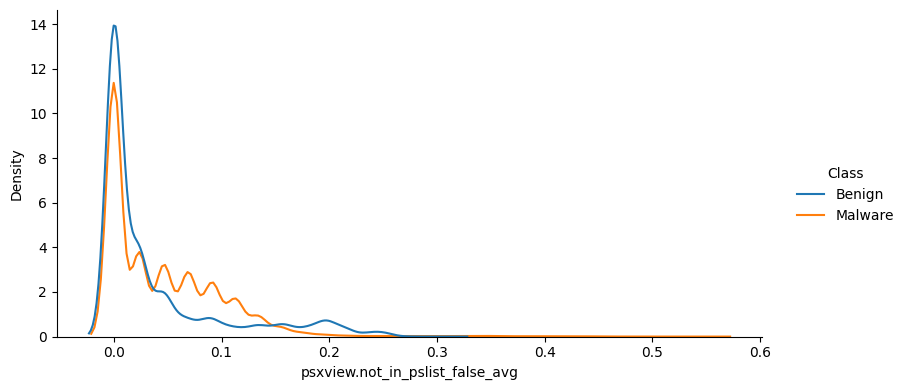

psxview.not_in_pslist_false_avg                                   
                                      mean    median       std       max  min
Category                                                                     
Benign                            0.036870  0.002861  0.060159  0.305085  0.0
Ransomware                        0.040610  0.023256  0.051931  0.551282  0.0
Spyware                           0.050581  0.024390  0.063496  0.500000  0.0
Trojan                            0.043773  0.026316  0.045792  0.422535  0.0

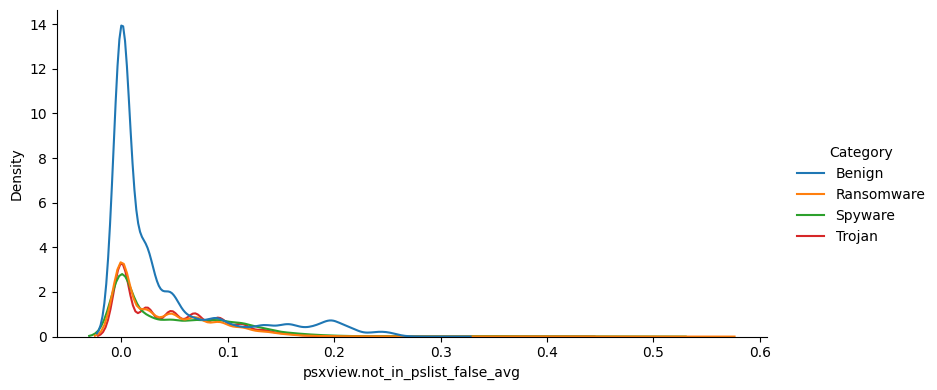

psxview.not_in_pslist_false_avg                                \
                                        mean    median       std       max   
Family                                                                       
180solutions                        0.044771  0.026316  0.048183  0.250000   
Ako                                 0.047062  0.023810  0.062804  0.551282   
Benign                              0.036870  0.002861  0.060159  0.305085   
CWS                                 0.061613  0.044444  0.075263  0.455696   
Conti                               0.035970  0.023256  0.041655  0.232143   
Emotet                              0.035602  0.023256  0.039669  0.195652   
Gator                               0.038492  0.000000  0.049166  0.229167   
Maze                                0.041341  0.023256  0.052176  0.416667   
Pysa                                0.048371  0.037736  0.058845  0.468354   
Reconyc                             0.042595  0.025978  0.044226  0.240741   
Refroso                             0.044876  0.026316  0.046289  0.195652   
Scar                                0.044563  0.025000  0.047843  0.422535   
Shade                               0.032225  0.022222  0.040398  0.191489   
TIBS                                0.032362  0.000000  0.044834  0.288136   
Transponder                         0.066897  0.047619  0.076869  0.500000   
Zeus                                0.051027  0.046512  0.048743  0.239437   

                   
              min  
Family             
180solutions  0.0  
Ako           0.0  
Benign        0.0  
CWS           0.0  
Conti         0.0  
Emotet        0.0  
Gator         0.0  
Maze          0.0  
Pysa          0.0  
Reconyc       0.0  
Refroso       0.0  
Scar          0.0  
Shade         0.0  
TIBS          0.0  
Transponder   0.0  
Zeus          0.0

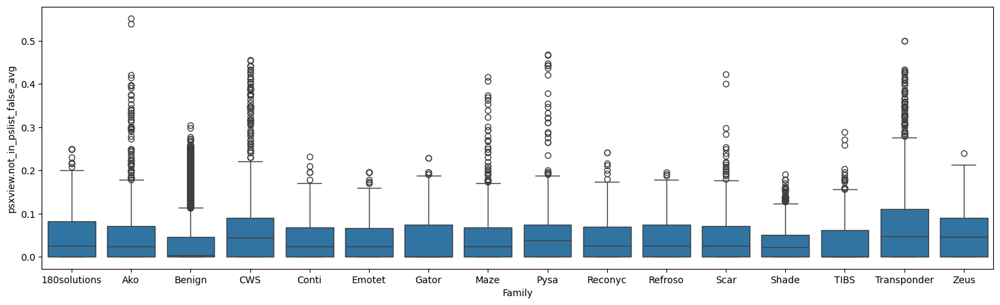

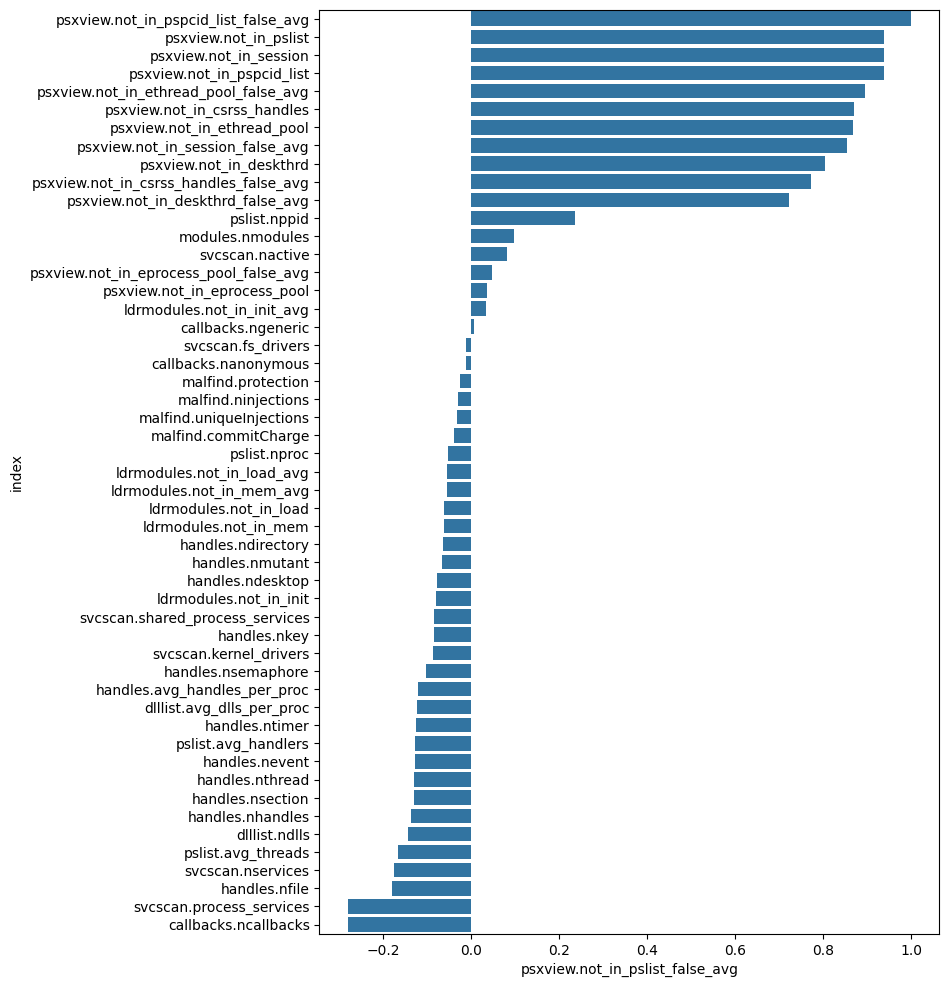

,psxview.not_in_eprocess_pool_false_avg
mean,0.000080
median,0.000000
std,0.001275
max,0.043478
min,0.000000


psxview.not_in_eprocess_pool_false_avg                                
                                          mean median       std       max  min
Class                                                                         
Benign                                0.000073    0.0  0.001048  0.023810  0.0
Malware                               0.000088    0.0  0.001471  0.043478  0.0

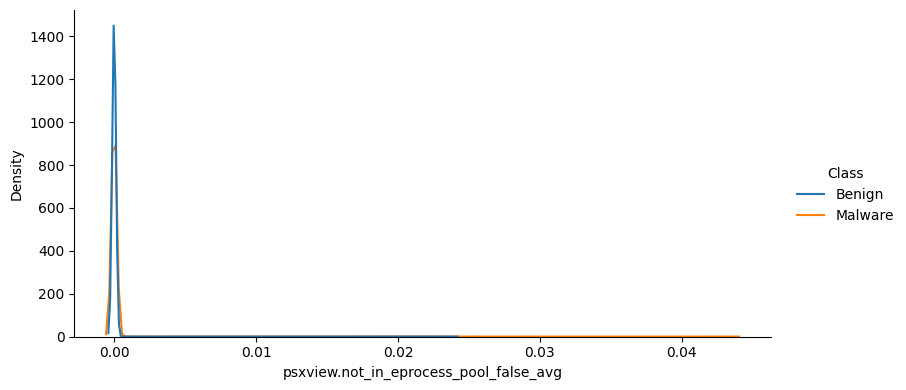

psxview.not_in_eprocess_pool_false_avg                             \
                                             mean median       std       max   
Category                                                                       
Benign                                   0.000073    0.0  0.001048  0.023810   
Ransomware                               0.000069    0.0  0.001266  0.027778   
Spyware                                  0.000111    0.0  0.001683  0.043478   
Trojan                                   0.000083    0.0  0.001424  0.030303   

                 
            min  
Category         
Benign      0.0  
Ransomware  0.0  
Spyware     0.0  
Trojan      0.0

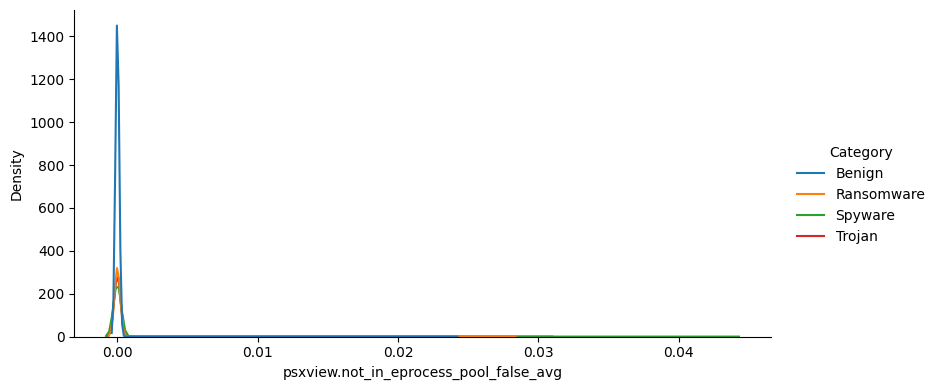

psxview.not_in_eprocess_pool_false_avg                   \
                                               mean median       std   
Family                                                                 
180solutions                               0.000135    0.0  0.001748   
Ako                                        0.000058    0.0  0.001167   
Benign                                     0.000073    0.0  0.001048   
CWS                                        0.000089    0.0  0.001366   
Conti                                      0.000072    0.0  0.001308   
Emotet                                     0.000124    0.0  0.001746   
Gator                                      0.000107    0.0  0.001595   
Maze                                       0.000058    0.0  0.001220   
Pysa                                       0.000014    0.0  0.000571   
Reconyc                                    0.000073    0.0  0.001297   
Refroso                                    0.000093    0.0  0.001475   
Scar                                       0.000051    0.0  0.001143   
Shade                                      0.000126    0.0  0.001680   
TIBS                                       0.000121    0.0  0.002267   
Transponder                                0.000108    0.0  0.001533   
Zeus                                       0.000069    0.0  0.001368   

                             
                   max  min  
Family                       
180solutions  0.027027  0.0  
Ako           0.025000  0.0  
Benign        0.023810  0.0  
CWS           0.026316  0.0  
Conti         0.025641  0.0  
Emotet        0.027778  0.0  
Gator         0.025641  0.0  
Maze          0.027778  0.0  
Pysa          0.023256  0.0  
Reconyc       0.024390  0.0  
Refroso       0.026316  0.0  
Scar          0.027778  0.0  
Shade         0.025641  0.0  
TIBS          0.043478  0.0  
Transponder   0.024390  0.0  
Zeus          0.030303  0.0

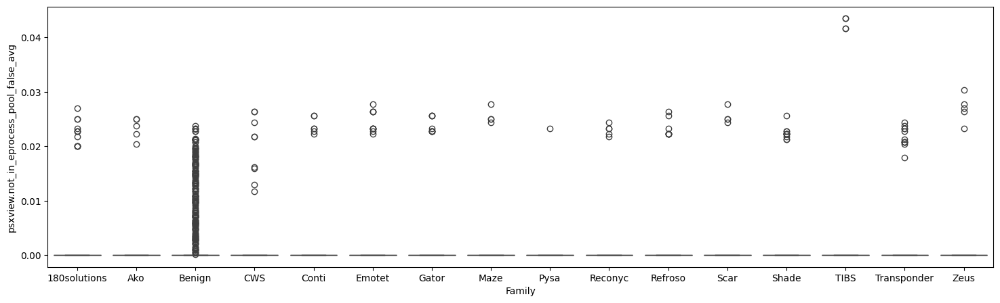

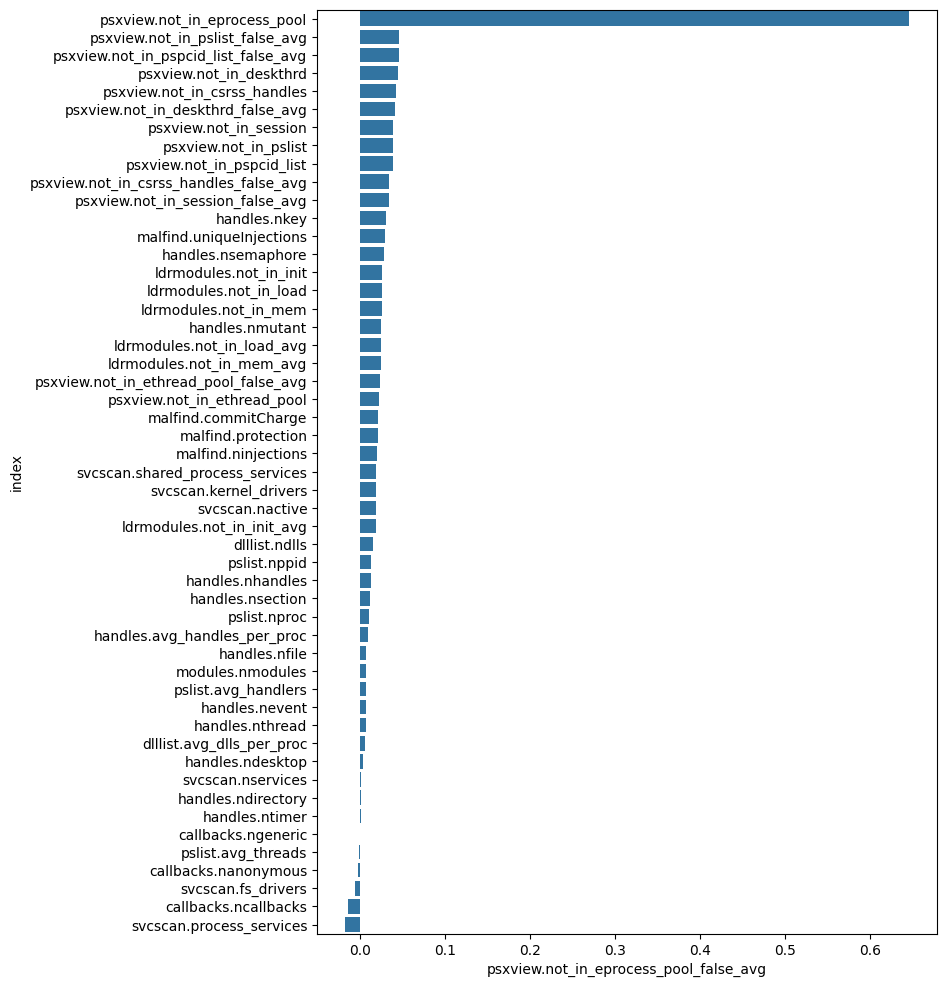

,psxview.not_in_ethread_pool_false_avg
mean,0.047657
median,0.023256
std,0.066824
max,0.837500
min,0.000000


psxview.not_in_ethread_pool_false_avg                                \
                                         mean    median       std       max   
Class                                                                         
Benign                               0.042875  0.012858  0.067187  0.333333   
Malware                              0.052508  0.031250  0.066102  0.837500   

              
         min  
Class         
Benign   0.0  
Malware  0.0

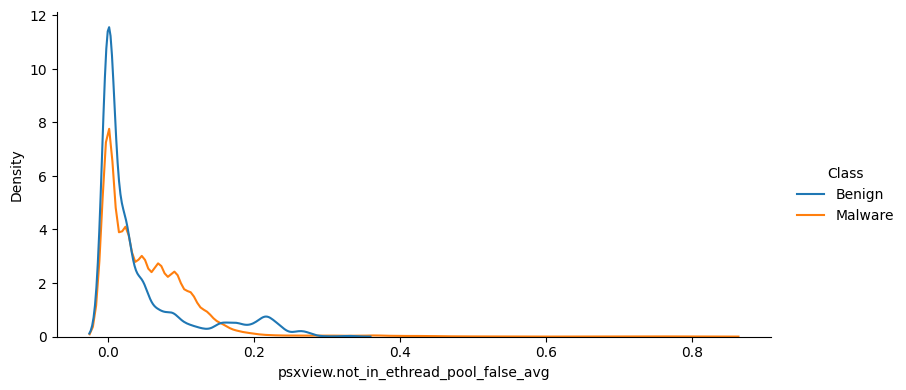

psxview.not_in_ethread_pool_false_avg                      \
                                            mean    median       std   
Category                                                               
Benign                                  0.042875  0.012858  0.067187   
Ransomware                              0.051167  0.026316  0.071006   
Spyware                                 0.058914  0.043478  0.074140   
Trojan                                  0.047228  0.043478  0.049560   

                           
                 max  min  
Category                   
Benign      0.333333  0.0  
Ransomware  0.800000  0.0  
Spyware     0.798942  0.0  
Trojan      0.837500  0.0

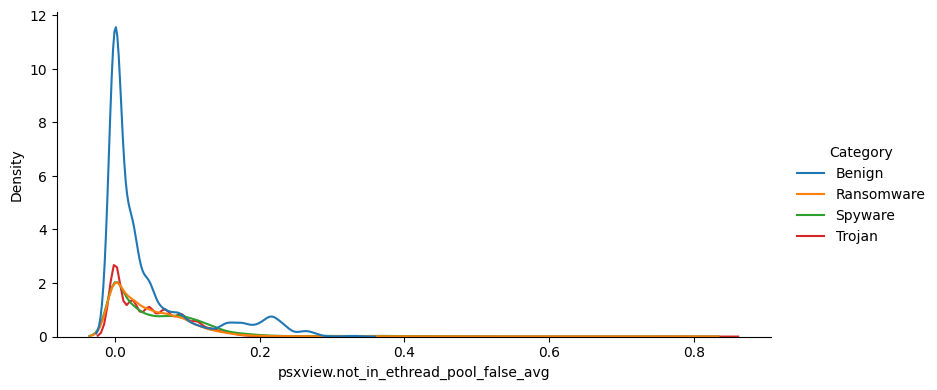

psxview.not_in_ethread_pool_false_avg                      \
                                              mean    median       std   
Family                                                                   
180solutions                              0.049811  0.043478  0.051487   
Ako                                       0.066766  0.045455  0.097944   
Benign                                    0.042875  0.012858  0.067187   
CWS                                       0.076536  0.048780  0.085808   
Conti                                     0.038358  0.023810  0.043011   
Emotet                                    0.037826  0.023810  0.040836   
Gator                                     0.039561  0.021981  0.049481   
Maze                                      0.053879  0.028175  0.076945   
Pysa                                      0.064542  0.047619  0.076449   
Reconyc                                   0.047071  0.043478  0.053618   
Refroso                                   0.047090  0.043478  0.046524   
Scar                                      0.048628  0.043478  0.053677   
Shade                                     0.035802  0.023256  0.040494   
TIBS                                      0.036715  0.023256  0.045967   
Transponder                               0.080830  0.060000  0.097017   
Zeus                                      0.055549  0.047619  0.051211   

                             
                   max  min  
Family                       
180solutions  0.435897  0.0  
Ako           0.800000  0.0  
Benign        0.333333  0.0  
CWS           0.478723  0.0  
Conti         0.285714  0.0  
Emotet        0.195652  0.0  
Gator         0.229167  0.0  
Maze          0.767956  0.0  
Pysa          0.762712  0.0  
Reconyc       0.837500  0.0  
Refroso       0.195652  0.0  
Scar          0.513158  0.0  
Shade         0.191489  0.0  
TIBS          0.305085  0.0  
Transponder   0.798942  0.0  
Zeus          0.367347  0.0

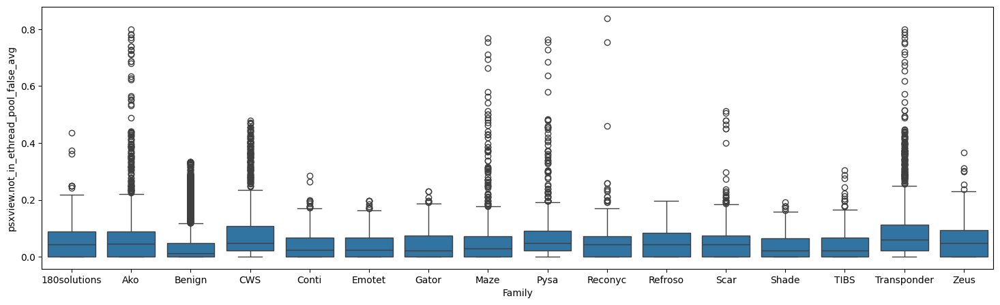

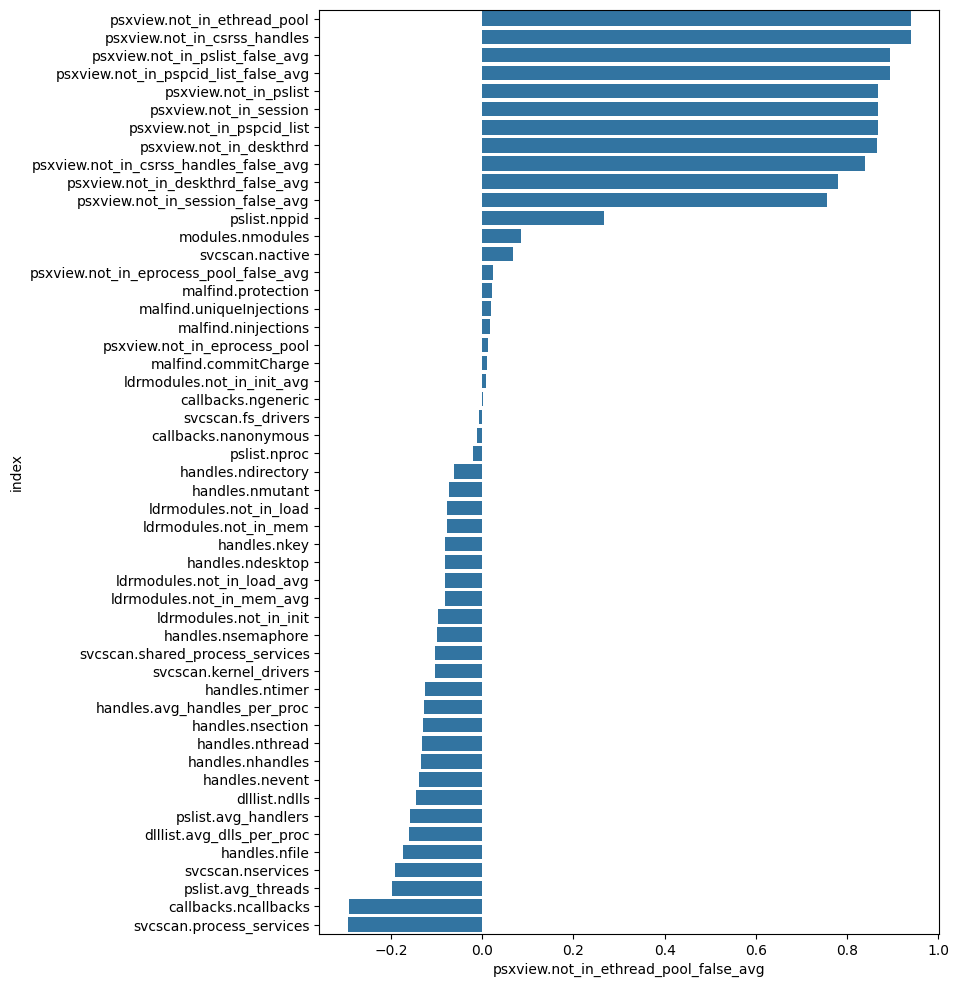

,psxview.not_in_pspcid_list_false_avg
mean,0.041016
median,0.021568
std,0.058227
max,1.000000
min,0.000000


psxview.not_in_pspcid_list_false_avg                                \
                                        mean    median       std       max   
Class                                                                        
Benign                              0.036862  0.002861  0.060157  0.305085   
Malware                             0.045229  0.024390  0.055888  1.000000   

              
         min  
Class         
Benign   0.0  
Malware  0.0

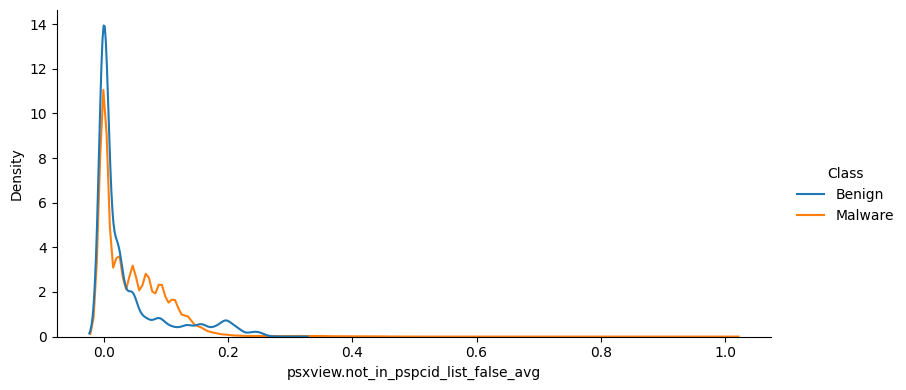

psxview.not_in_pspcid_list_false_avg                                \
                                           mean    median       std       max   
Category                                                                        
Benign                                 0.036862  0.002861  0.060157  0.305085   
Ransomware                             0.041083  0.023256  0.055613  1.000000   
Spyware                                0.050575  0.024390  0.063495  0.500000   
Trojan                                 0.043864  0.026316  0.046546  0.857143   

                 
            min  
Category         
Benign      0.0  
Ransomware  0.0  
Spyware     0.0  
Trojan      0.0

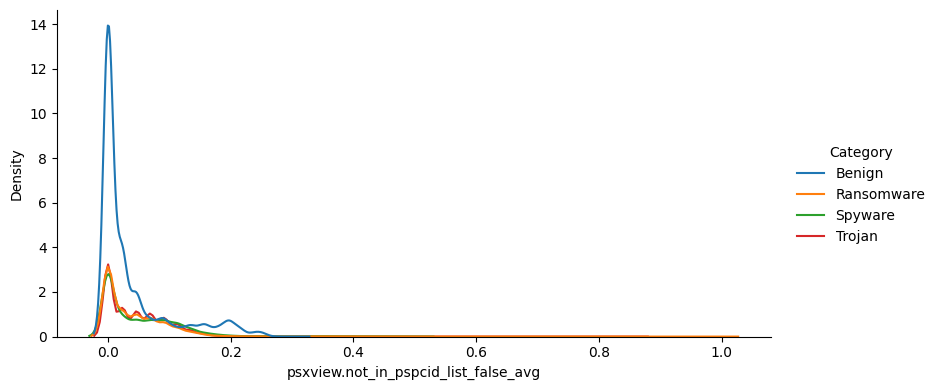

psxview.not_in_pspcid_list_false_avg                      \
                                             mean    median       std   
Family                                                                  
180solutions                             0.044758  0.026316  0.048184   
Ako                                      0.047488  0.023810  0.065394   
Benign                                   0.036862  0.002861  0.060157   
CWS                                      0.061613  0.044444  0.075263   
Conti                                    0.036919  0.023256  0.050646   
Emotet                                   0.036038  0.023256  0.043773   
Gator                                    0.038492  0.000000  0.049166   
Maze                                     0.041858  0.023256  0.056326   
Pysa                                     0.048371  0.037736  0.058845   
Reconyc                                  0.042595  0.025978  0.044226   
Refroso                                  0.044876  0.026316  0.046289   
Scar                                     0.044563  0.025000  0.047843   
Shade                                    0.032631  0.022222  0.044232   
TIBS                                     0.032345  0.000000  0.044832   
Transponder                              0.066893  0.047619  0.076863   
Zeus                                     0.051027  0.046512  0.048743   

                             
                   max  min  
Family                       
180solutions  0.250000  0.0  
Ako           0.863636  0.0  
Benign        0.305085  0.0  
CWS           0.455696  0.0  
Conti         1.000000  0.0  
Emotet        0.857143  0.0  
Gator         0.229167  0.0  
Maze          0.930233  0.0  
Pysa          0.468354  0.0  
Reconyc       0.240741  0.0  
Refroso       0.195652  0.0  
Scar          0.422535  0.0  
Shade         0.863636  0.0  
TIBS          0.288136  0.0  
Transponder   0.500000  0.0  
Zeus          0.239437  0.0

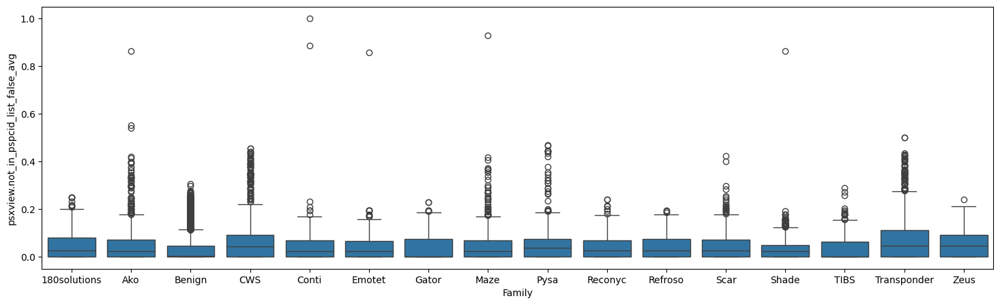

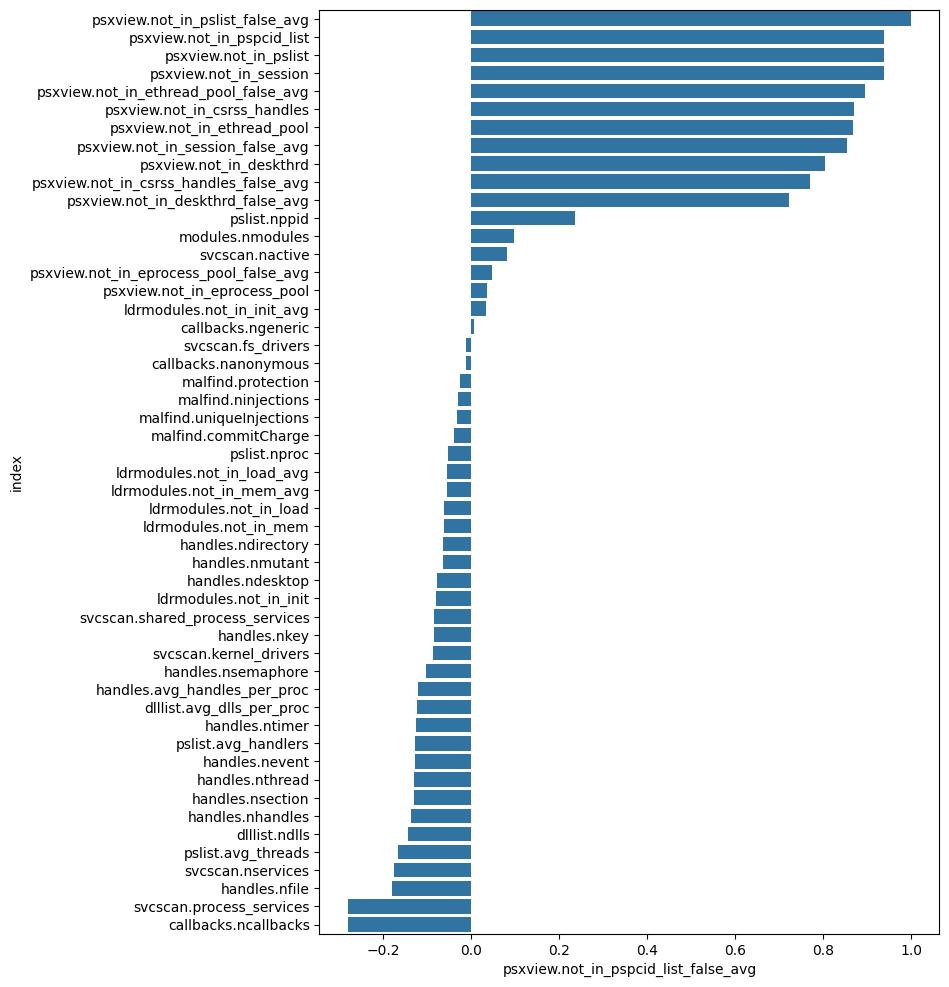

,psxview.not_in_csrss_handles_false_avg
mean,0.141668
median,0.119048
std,0.061355
max,0.854167
min,0.025806


psxview.not_in_csrss_handles_false_avg                                \
                                          mean    median       std       max   
Class                                                                          
Benign                                0.134195  0.106383  0.062098  0.400000   
Malware                               0.149248  0.136364  0.059645  0.854167   

                   
              min  
Class              
Benign   0.062500  
Malware  0.025806

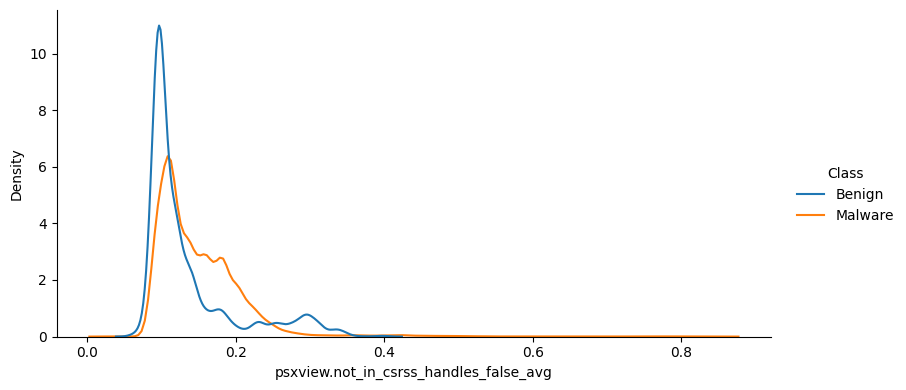

psxview.not_in_csrss_handles_false_avg                      \
                                             mean    median       std   
Category                                                                
Benign                                   0.134195  0.106383  0.062098   
Ransomware                               0.146748  0.130435  0.063903   
Spyware                                  0.157241  0.142857  0.066609   
Trojan                                   0.143490  0.133333  0.044881   

                                
                 max       min  
Category                        
Benign      0.400000  0.062500  
Ransomware  0.821053  0.075472  
Spyware     0.820106  0.025806  
Trojan      0.854167  0.074074

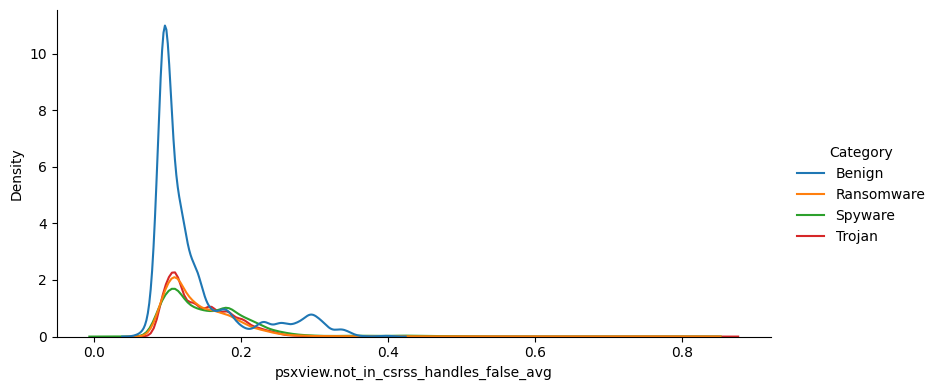

psxview.not_in_csrss_handles_false_avg                      \
                                               mean    median       std   
Family                                                                    
180solutions                               0.147149  0.136364  0.047087   
Ako                                        0.160516  0.136364  0.087614   
Benign                                     0.134195  0.106383  0.062098   
CWS                                        0.167671  0.146341  0.076740   
Conti                                      0.135867  0.121951  0.039557   
Emotet                                     0.134466  0.121951  0.037413   
Gator                                      0.134568  0.111111  0.047368   
Maze                                       0.149237  0.131579  0.069842   
Pysa                                       0.158401  0.146341  0.068009   
Reconyc                                    0.143184  0.136364  0.048637   
Refroso                                    0.144065  0.133333  0.042085   
Scar                                       0.144066  0.131579  0.048408   
Shade                                      0.132830  0.121212  0.037352   
TIBS                                       0.159223  0.151515  0.039077   
Transponder                                0.174564  0.155556  0.087708   
Zeus                                       0.151666  0.146341  0.046018   

                                  
                   max       min  
Family                            
180solutions  0.487179  0.083333  
Ako           0.821053  0.086957  
Benign        0.400000  0.062500  
CWS           0.521277  0.025806  
Conti         0.357143  0.086957  
Emotet        0.282609  0.083333  
Gator         0.312500  0.086957  
Maze          0.790055  0.086957  
Pysa          0.785311  0.075472  
Reconyc       0.854167  0.078431  
Refroso       0.282609  0.088889  
Scar          0.565789  0.088889  
Shade         0.276596  0.083333  
TIBS          0.372881  0.088889  
Transponder   0.820106  0.081633  
Zeus          0.408163  0.074074

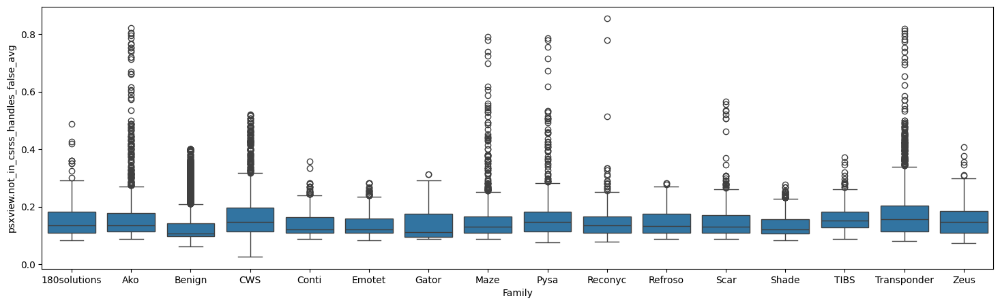

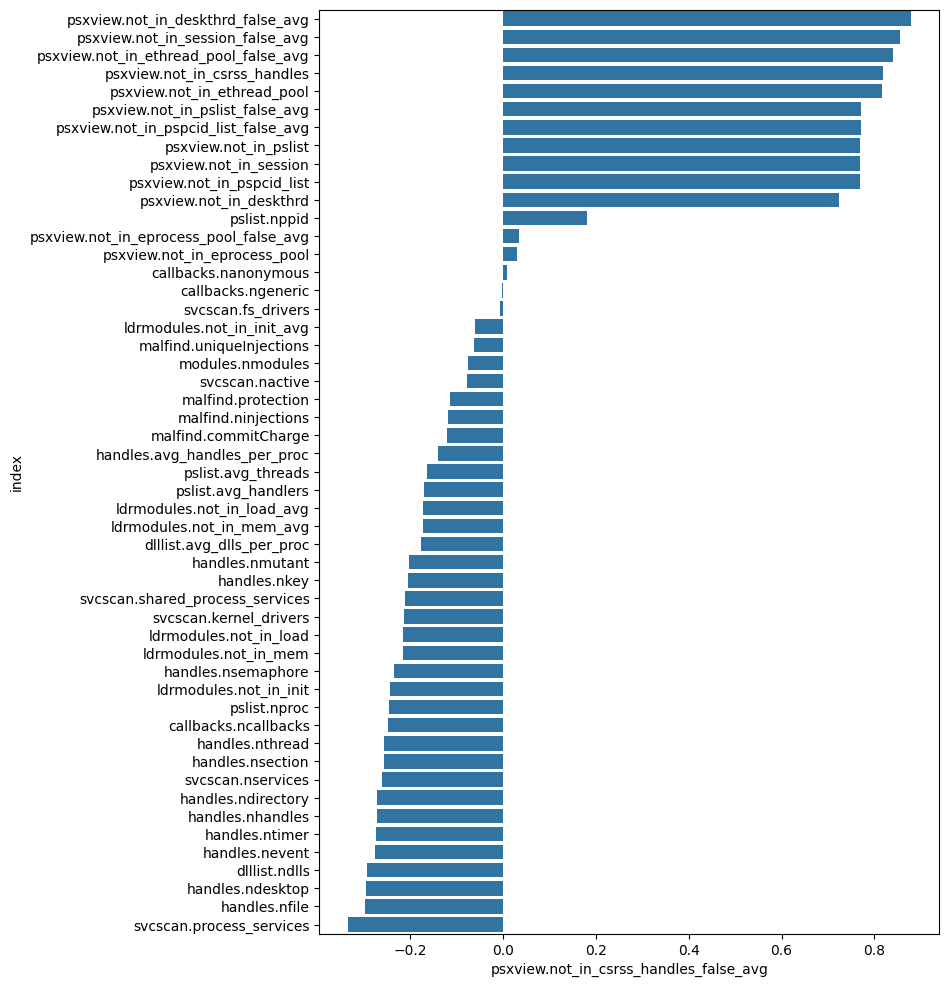

,psxview.not_in_session_false_avg
mean,0.087887
median,0.066667
std,0.055039
max,0.576923
min,0.008333


psxview.not_in_session_false_avg                                \
                                    mean    median       std       max   
Class                                                                    
Benign                          0.082508  0.051282  0.057557  0.338983   
Malware                         0.093343  0.074074  0.051794  0.576923   

                   
              min  
Class              
Benign   0.025641  
Malware  0.008333

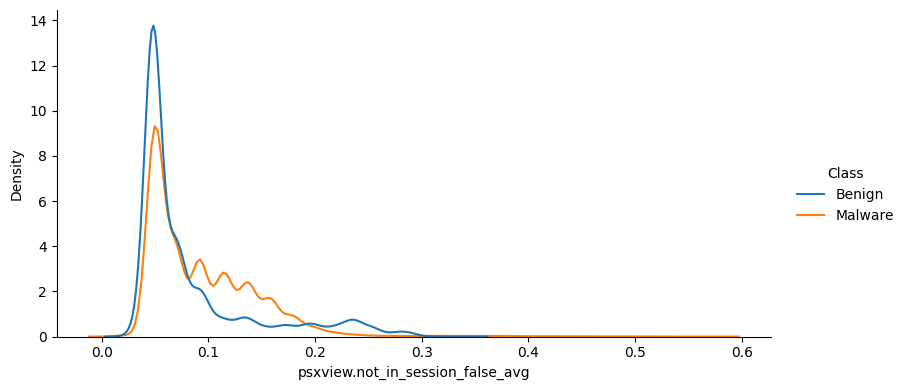

psxview.not_in_session_false_avg                                \
                                       mean    median       std       max   
Category                                                                    
Benign                             0.082508  0.051282  0.057557  0.338983   
Ransomware                         0.088327  0.069767  0.049547  0.576923   
Spyware                            0.099655  0.085714  0.059995  0.528571   
Trojan                             0.091852  0.078947  0.043527  0.450704   

                      
                 min  
Category              
Benign      0.025641  
Ransomware  0.012987  
Spyware     0.010753  
Trojan      0.008333

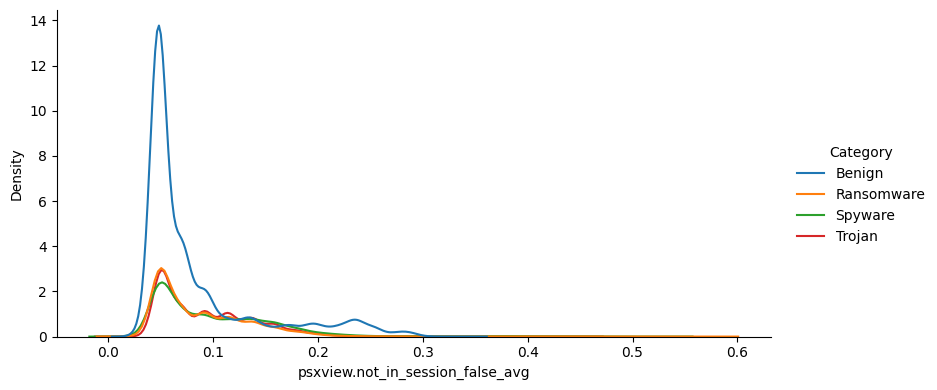

psxview.not_in_session_false_avg                                \
                                         mean    median       std       max   
Family                                                                        
180solutions                         0.093307  0.078947  0.045934  0.305556   
Ako                                  0.093870  0.071429  0.059787  0.576923   
Benign                               0.082508  0.051282  0.057557  0.338983   
CWS                                  0.107072  0.088889  0.071745  0.481013   
Conti                                0.084655  0.069767  0.039705  0.267857   
Emotet                               0.083848  0.069767  0.037726  0.239130   
Gator                                0.085942  0.062500  0.047899  0.270833   
Maze                                 0.088952  0.069767  0.050325  0.444444   
Pysa                                 0.095266  0.085106  0.055919  0.493671   
Reconyc                              0.090615  0.078947  0.042049  0.277778   
Refroso                              0.093306  0.078947  0.043971  0.239130   
Scar                                 0.092257  0.075000  0.045198  0.450704   
Shade                                0.080620  0.066667  0.038739  0.234043   
TIBS                                 0.093524  0.090909  0.039068  0.322034   
Transponder                          0.113699  0.095238  0.073440  0.528571   
Zeus                                 0.099022  0.093023  0.046520  0.267606   

                        
                   min  
Family                  
180solutions  0.041667  
Ako           0.012987  
Benign        0.025641  
CWS           0.012346  
Conti         0.043478  
Emotet        0.041667  
Gator         0.041667  
Maze          0.013699  
Pysa          0.016949  
Reconyc       0.008333  
Refroso       0.042553  
Scar          0.042553  
Shade         0.038462  
TIBS          0.035714  
Transponder   0.010753  
Zeus          0.020408

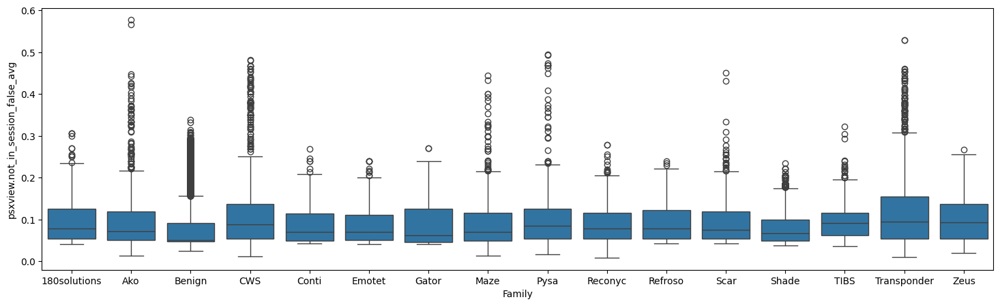

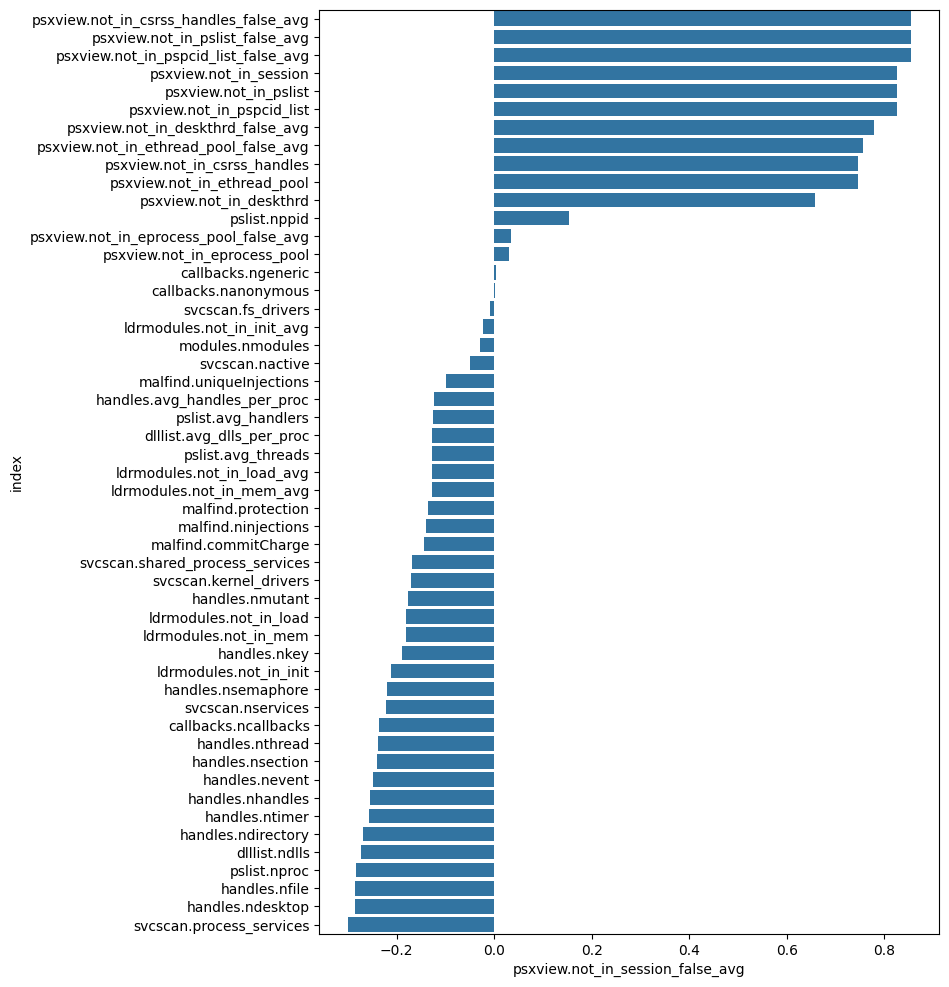

,psxview.not_in_deskthrd_false_avg
mean,0.187574
median,0.166144
std,0.061470
max,0.862500
min,0.043750


psxview.not_in_deskthrd_false_avg                                \
                                     mean    median       std       max   
Class                                                                     
Benign                           0.177709  0.153846  0.060691  0.433333   
Malware                          0.197581  0.181818  0.060632  0.862500   

                  
             min  
Class             
Benign   0.09375  
Malware  0.04375

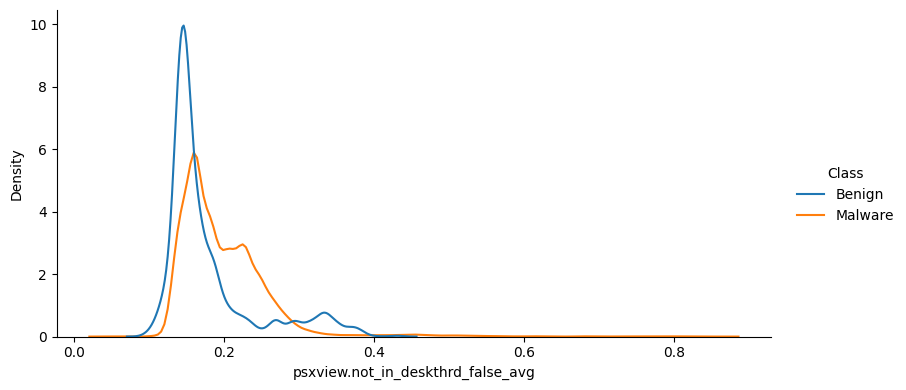

psxview.not_in_deskthrd_false_avg                                \
                                        mean    median       std       max   
Category                                                                     
Benign                              0.177709  0.153846  0.060691  0.433333   
Ransomware                          0.197008  0.181818  0.067522  0.831579   
Spyware                             0.203639  0.186047  0.066884  0.825397   
Trojan                              0.191888  0.181818  0.043522  0.862500   

                      
                 min  
Category              
Benign      0.093750  
Ransomware  0.119048  
Spyware     0.043750  
Trojan      0.109375

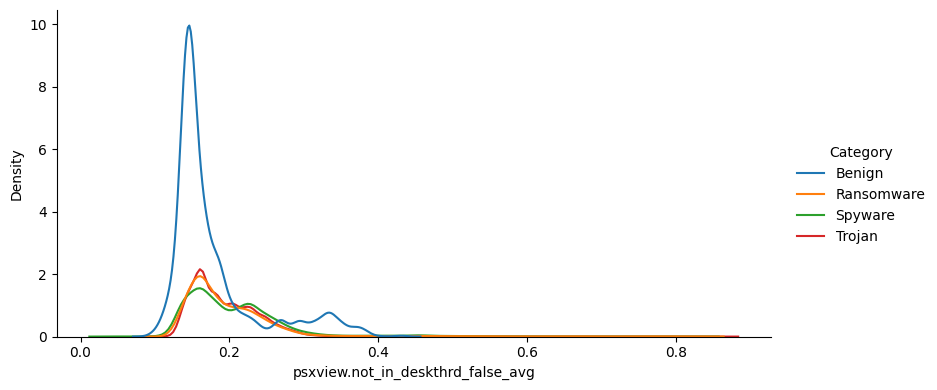

psxview.not_in_deskthrd_false_avg                                \
                                          mean    median       std       max   
Family                                                                         
180solutions                          0.194384  0.184211  0.048430  0.558140   
Ako                                   0.211579  0.186047  0.090565  0.831579   
Benign                                0.177709  0.153846  0.060691  0.433333   
CWS                                   0.215383  0.195652  0.077133  0.630435   
Conti                                 0.186630  0.171429  0.046446  0.577778   
Emotet                                0.183594  0.173913  0.038730  0.326087   
Gator                                 0.182105  0.162162  0.049500  0.454545   
Maze                                  0.196951  0.177778  0.069206  0.801105   
Pysa                                  0.206303  0.190983  0.068435  0.796610   
Reconyc                               0.189299  0.181818  0.046896  0.862500   
Refroso                               0.195232  0.186047  0.039717  0.326087   
Scar                                  0.190741  0.181818  0.046938  0.578947   
Shade                                 0.185803  0.170732  0.051051  0.681818   
TIBS                                  0.200583  0.190476  0.038455  0.406780   
Transponder                           0.221180  0.204545  0.086964  0.825397   
Zeus                                  0.200093  0.195122  0.043618  0.428571   

                        
                   min  
Family                  
180solutions  0.125000  
Ako           0.128205  
Benign        0.093750  
CWS           0.043750  
Conti         0.128205  
Emotet        0.125000  
Gator         0.121951  
Maze          0.128205  
Pysa          0.119048  
Reconyc       0.114286  
Refroso       0.131579  
Scar          0.131579  
Shade         0.121951  
TIBS          0.105263  
Transponder   0.102041  
Zeus          0.109375

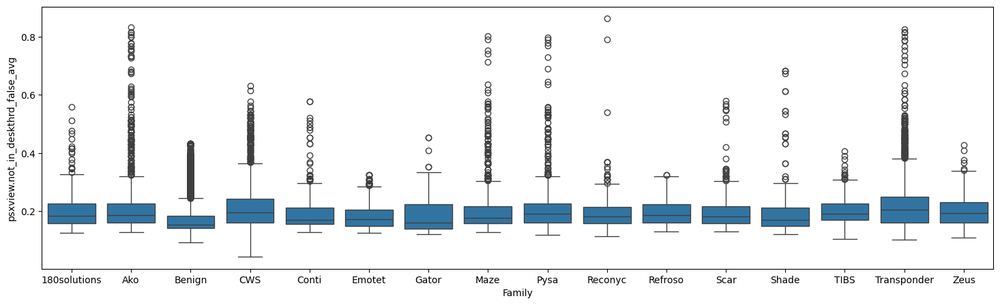

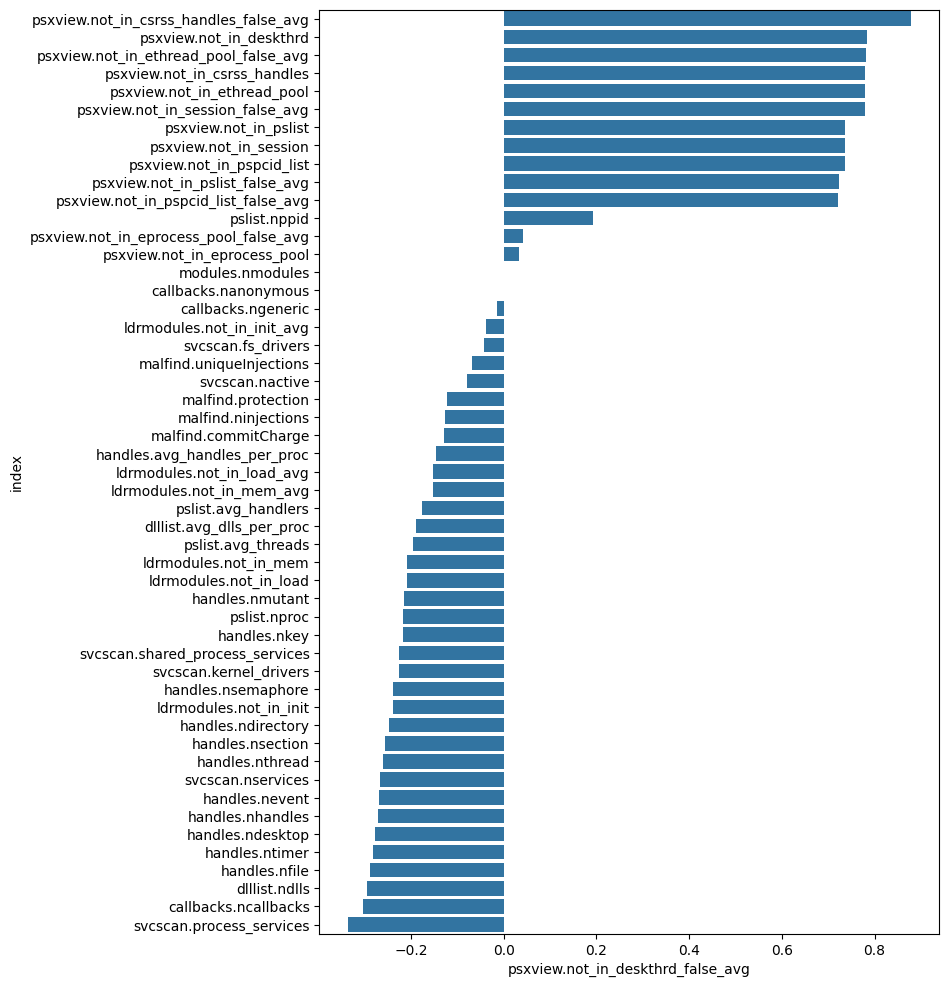

,modules.nmodules
mean,137.961876
median,138.000000
std,0.197346
max,138.000000
min,126.000000


modules.nmodules                           
                    mean median       std  max  min
Class                                              
Benign        137.985016  138.0  0.121491  138  137
Malware       137.938402  138.0  0.249773  138  126

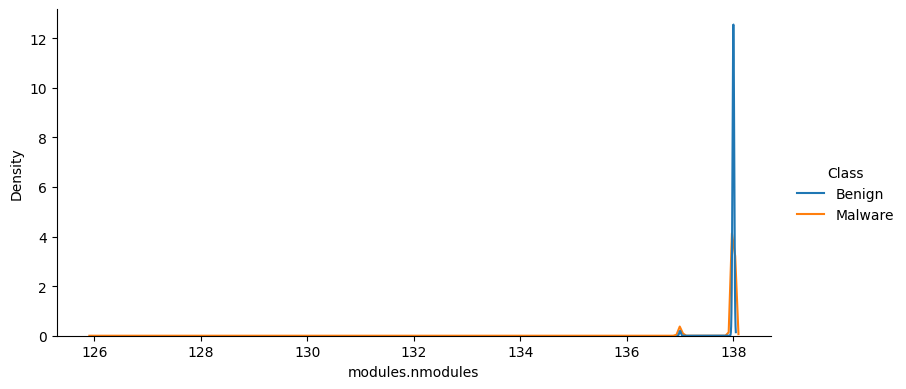

modules.nmodules                           
                       mean median       std  max  min
Category                                              
Benign           137.985016  138.0  0.121491  138  137
Ransomware       137.947512  138.0  0.223021  138  137
Spyware          137.908257  138.0  0.311114  138  126
Trojan           137.960443  138.0  0.194926  138  137

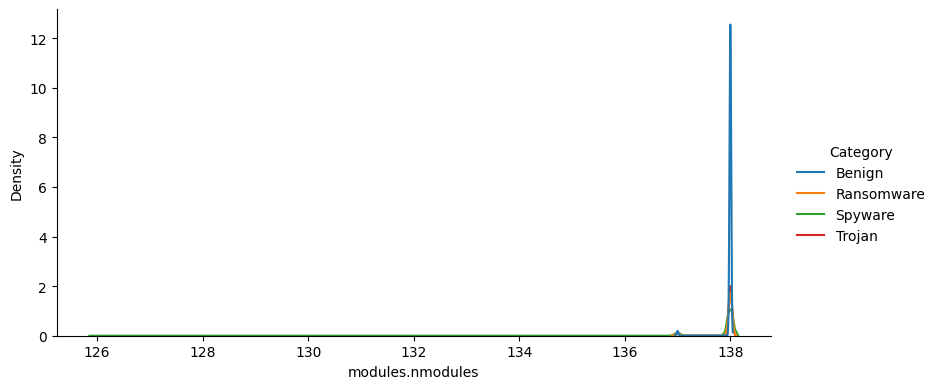

modules.nmodules                           
                         mean median       std  max  min
Family                                                  
180solutions       137.924962  138.0  0.263518  138  137
Ako                137.957500  138.0  0.201777  138  137
Benign             137.985016  138.0  0.121491  138  137
CWS                137.965000  138.0  0.183826  138  137
Conti              137.940614  138.0  0.236405  138  137
Emotet             137.938993  138.0  0.239403  138  137
Gator              137.948345  138.0  0.221385  138  137
Maze               137.962372  138.0  0.190350  138  137
Pysa               137.971653  138.0  0.166013  138  137
Reconyc            137.955995  138.0  0.205172  138  137
Refroso            137.966433  138.0  0.180157  138  137
Scar               137.959500  138.0  0.197178  138  137
Shade              137.913493  138.0  0.281177  138  137
TIBS               137.686080  138.0  0.464249  138  137
Transponder        137.943960  138.0  0.328236  138  126
Zeus               137.980503  138.0  0.138300  138  137

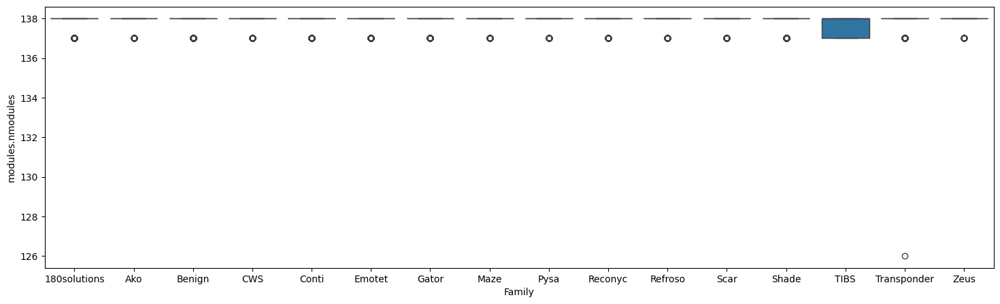

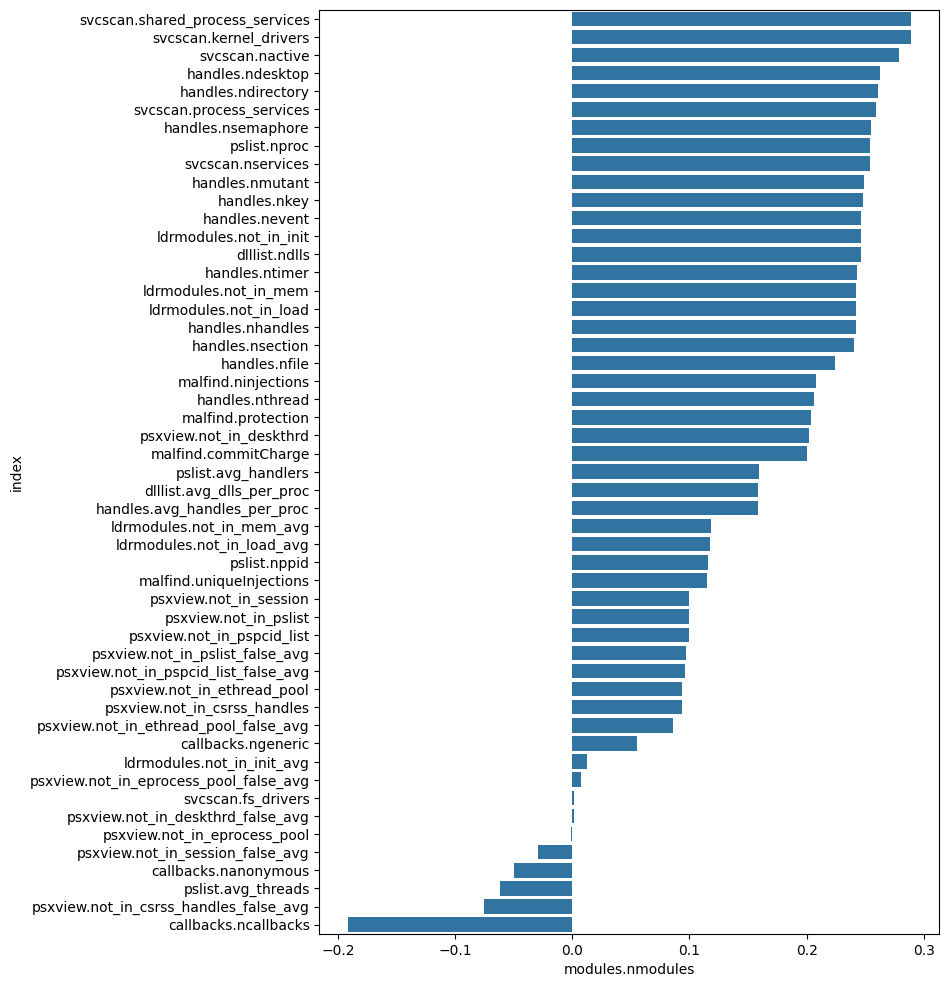

,svcscan.nservices
mean,391.367685
median,392.000000
std,4.539162
max,395.000000
min,94.000000


svcscan.nservices                           
                     mean median       std  max  min
Class                                               
Benign         394.205433  395.0  1.352629  395  388
Malware        388.489069  389.0  4.815984  395   94

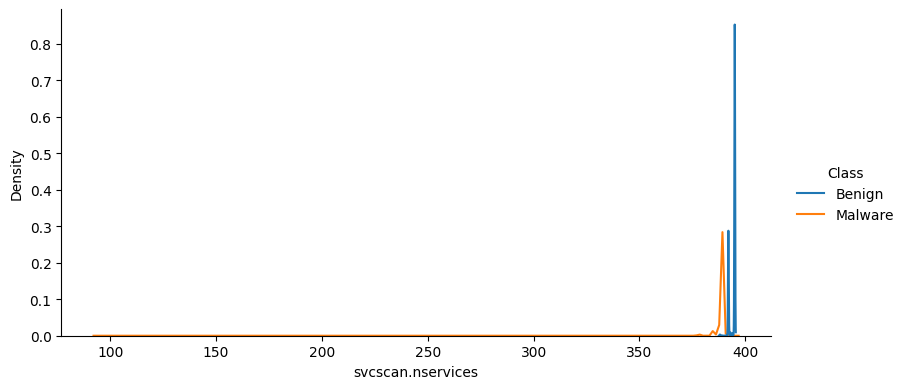

svcscan.nservices                           
                        mean median       std  max  min
Category                                               
Benign            394.205433  395.0  1.352629  395  388
Ransomware        388.273882  389.0  6.918107  395   94
Spyware           388.443221  389.0  4.414234  392  105
Trojan            388.752743  389.0  1.459964  392  349

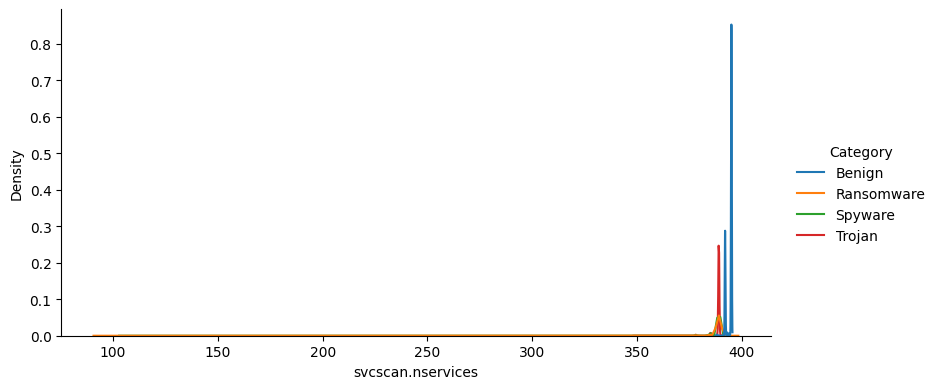

svcscan.nservices                           
                          mean median       std  max  min
Family                                                   
180solutions        388.455228  389.0  4.696161  389  199
Ako                 388.245500  389.0  9.057000  389   94
Benign              394.205433  395.0  1.352629  395  388
CWS                 388.530500  389.0  4.892140  389  269
Conti               388.134877  389.0  6.568404  395  304
Emotet              388.584647  389.0  2.126428  389  349
Gator               388.686058  389.0  1.493500  390  378
Maze                388.654504  389.0  3.313668  389  307
Pysa                388.700844  389.0  3.251815  389  304
Reconyc             388.745536  389.0  1.416348  392  378
Refroso             388.812124  389.0  1.133793  390  378
Scar                388.736500  389.0  1.391415  389  378
Shade               387.783733  389.0  8.898152  390  116
TIBS                387.582386  389.0  2.298982  389  378
Transponder         388.662931  389.0  5.977960  392  105
Zeus                388.884043  389.0  0.917487  389  378

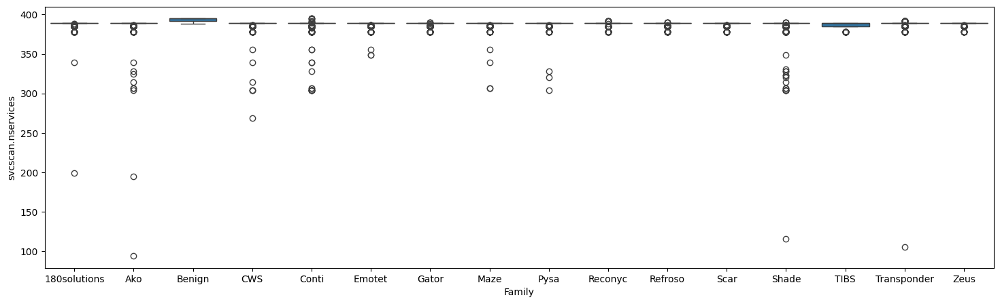

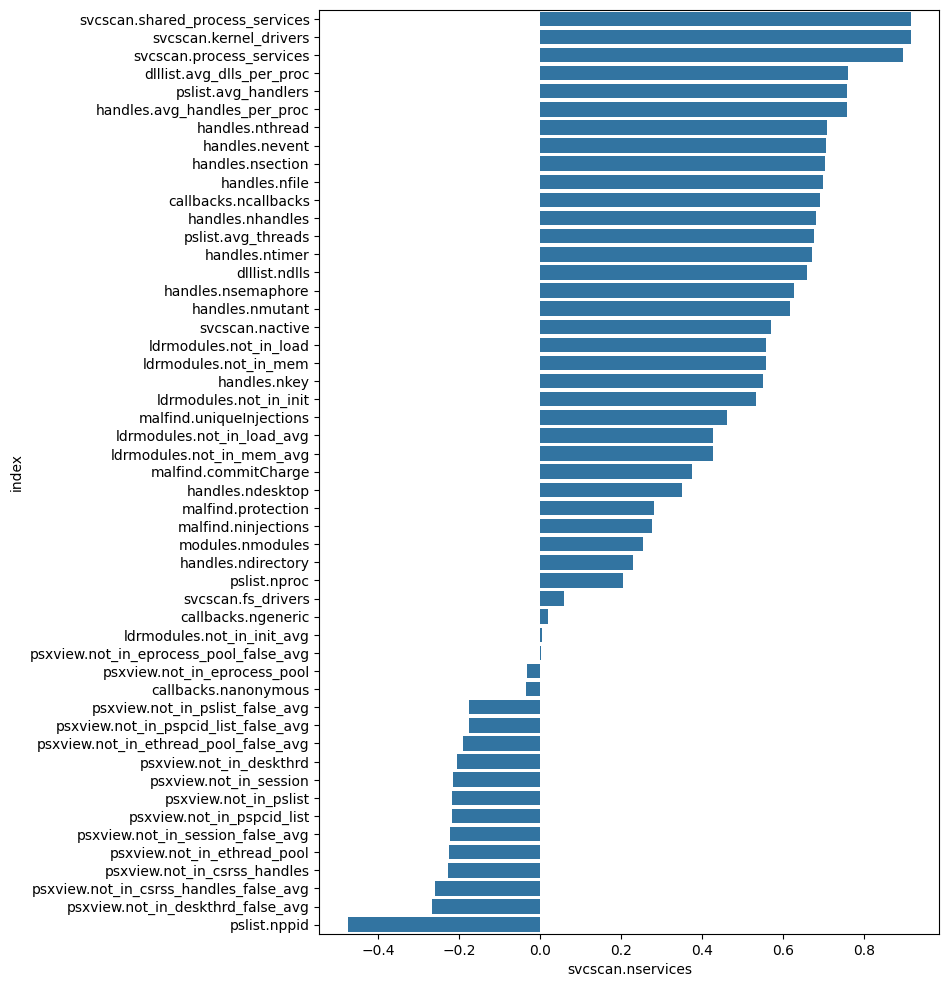

,svcscan.kernel_drivers
mean,221.410219
median,222.000000
std,1.999526
max,222.000000
min,55.000000


svcscan.kernel_drivers                           
                          mean median       std  max  min
Class                                                    
Benign              221.990524  222.0  0.127124  222  220
Malware             220.821557  221.0  2.710974  222   55

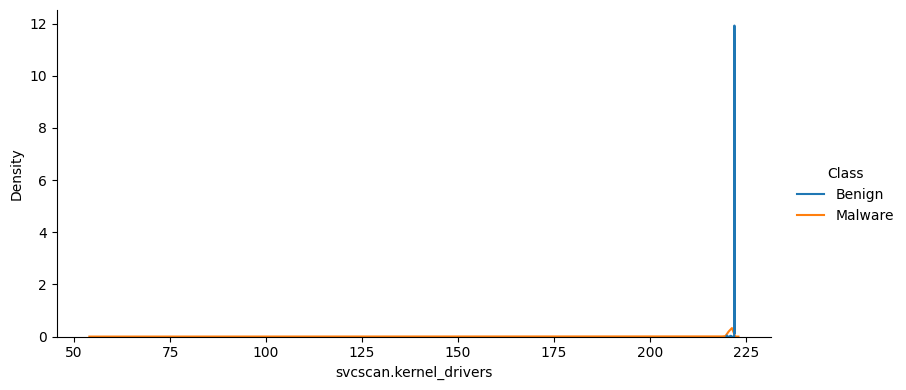

svcscan.kernel_drivers                           
                             mean median       std  max  min
Category                                                    
Benign                 221.990524  222.0  0.127124  222  220
Ransomware             220.684653  221.0  3.993994  222   55
Spyware                220.839246  221.0  2.397230  222   58
Trojan                 220.940823  221.0  0.575899  222  189

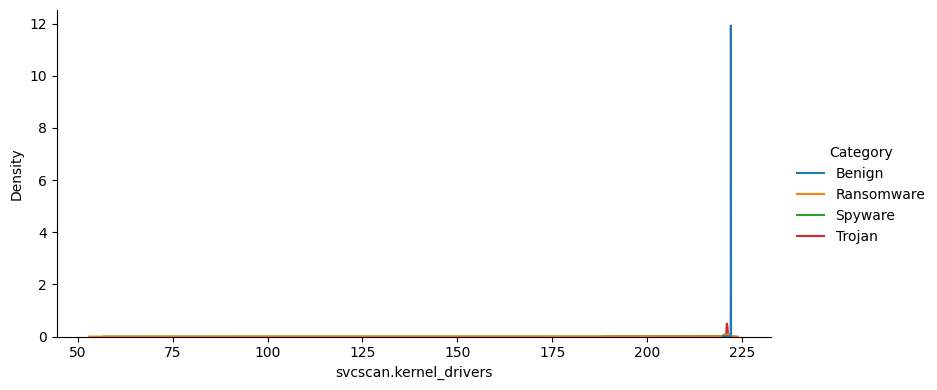

svcscan.kernel_drivers                           
                               mean median       std  max  min
Family                                                        
180solutions             220.839920  221.0  2.625506  221  107
Ako                      220.656000  221.0  5.166722  221   55
Benign                   221.990524  222.0  0.127124  222  220
CWS                      220.804000  221.0  2.753430  221  150
Conti                    220.611475  221.0  3.716005  222  172
Emotet                   220.880020  221.0  1.164865  221  189
Gator                    220.931795  221.0  0.302792  221  219
Maze                     220.876283  221.0  1.773249  221  174
Pysa                     220.879976  221.0  1.969152  221  172
Reconyc                  220.947066  221.0  0.293088  222  219
Refroso                  220.957916  221.0  0.235310  221  219
Scar                     220.945000  221.0  0.277513  221  219
Shade                    220.469676  221.0  5.267081  221   59
TIBS                     220.664062  221.0  0.515641  221  219
Transponder              220.893732  221.0  3.337021  222   58
Zeus                     220.975372  221.0  0.185205  221  219

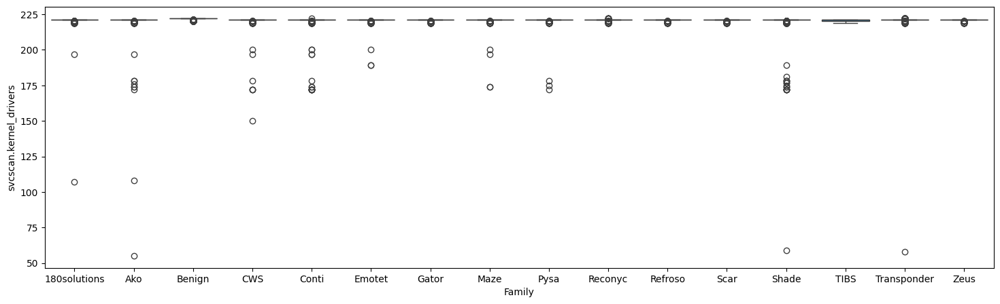

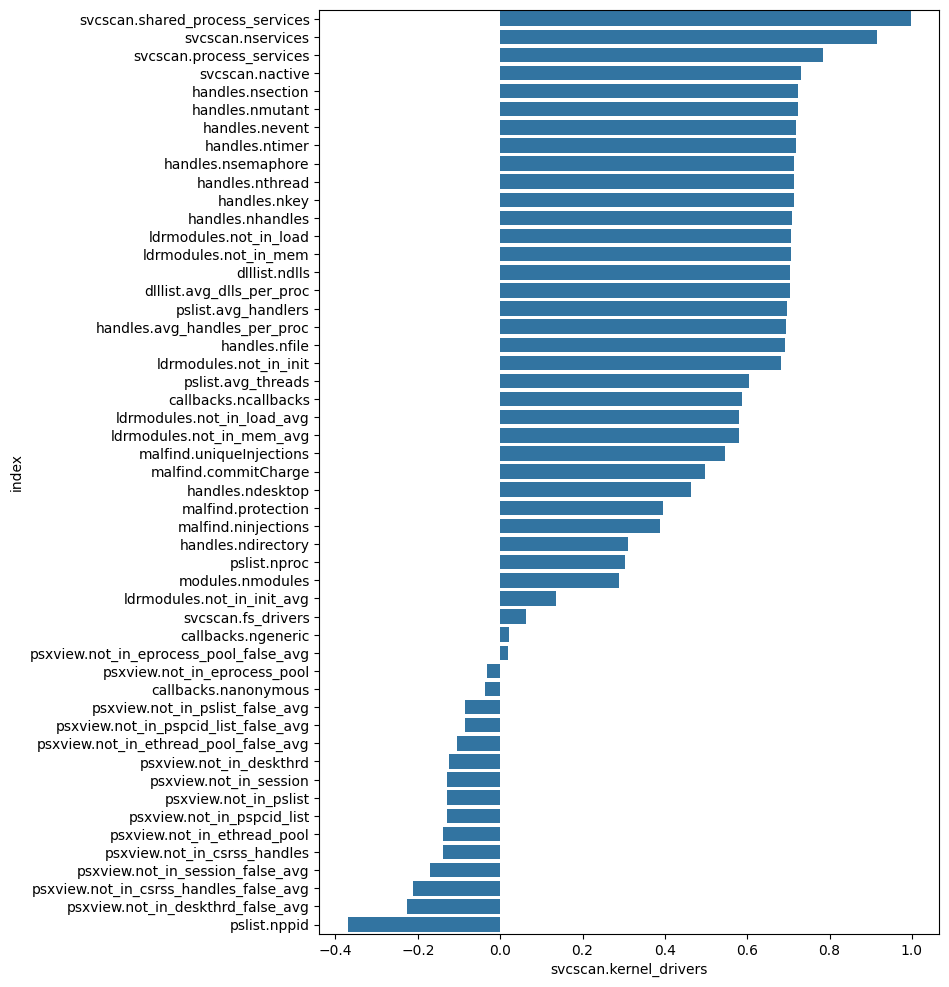

,svcscan.fs_drivers
mean,25.996210
median,26.000000
std,0.171596
max,26.000000
min,6.000000


svcscan.fs_drivers                         
                      mean median       std max min
Class                                              
Benign           26.000000   26.0  0.000000  26  26
Malware          25.992365   26.0  0.243487  26   6

/tmp/ipykernel_5371/2560809373.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(x=col_name,hue='Class',data=data,kind='kde',height=4,aspect=2)


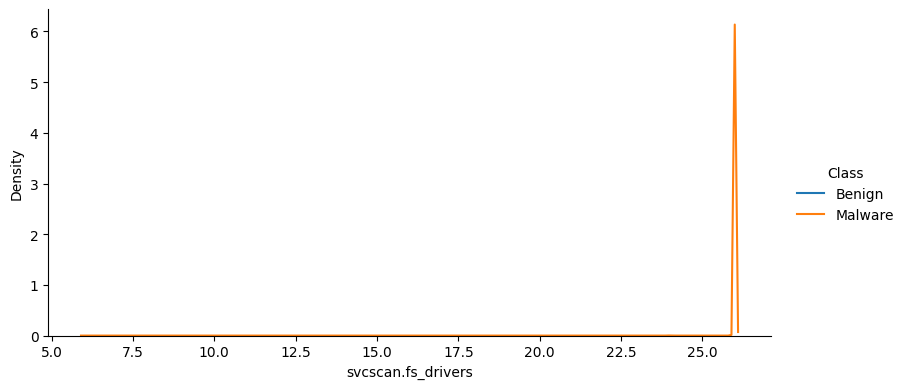

svcscan.fs_drivers                         
                         mean median       std max min
Category                                              
Benign              26.000000   26.0  0.000000  26  26
Ransomware          25.982784   26.0  0.351849  26   6
Spyware             25.994801   26.0  0.229964  26   9
Trojan              25.999473   26.0  0.030809  26  24

/tmp/ipykernel_5371/2560809373.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(x=col_name,hue='Category',data=data,kind='kde',height=4,aspect=2)


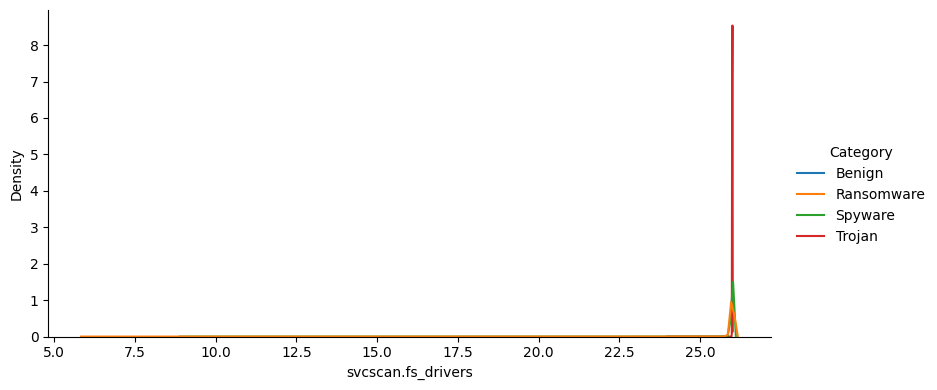

svcscan.fs_drivers                         
                           mean median       std max min
Family                                                  
180solutions          25.992496   26.0  0.294160  26  13
Ako                   25.973500   26.0  0.579626  26   6
Benign                26.000000   26.0  0.000000  26  26
CWS                   25.990500   26.0  0.168594  26  22
Conti                 25.980876   26.0  0.228036  26  23
Emotet                25.997458   26.0  0.067612  26  24
Gator                 26.000000   26.0  0.000000  26  26
Maze                  25.994869   26.0  0.114429  26  23
Pysa                  25.995778   26.0  0.101201  26  23
Reconyc               26.000000   26.0  0.000000  26  26
Refroso               26.000000   26.0  0.000000  26  26
Scar                  26.000000   26.0  0.000000  26  26
Shade                 25.973202   26.0  0.413480  26  10
TIBS                  26.000000   26.0  0.000000  26  26
Transponder           25.992943   26.0  0.346362  26   9
Zeus                  26.000000   26.0  0.000000  26  26

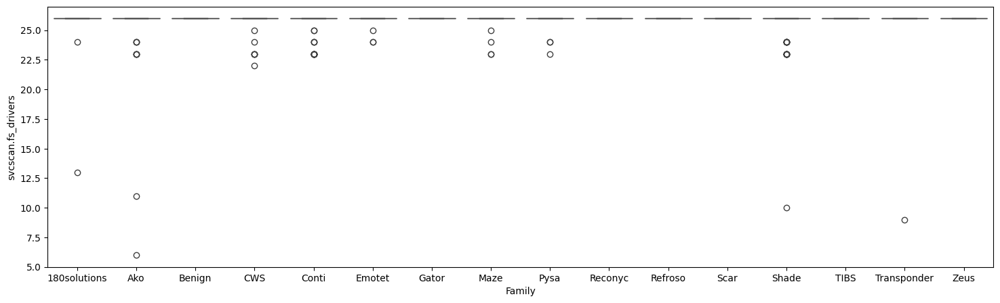

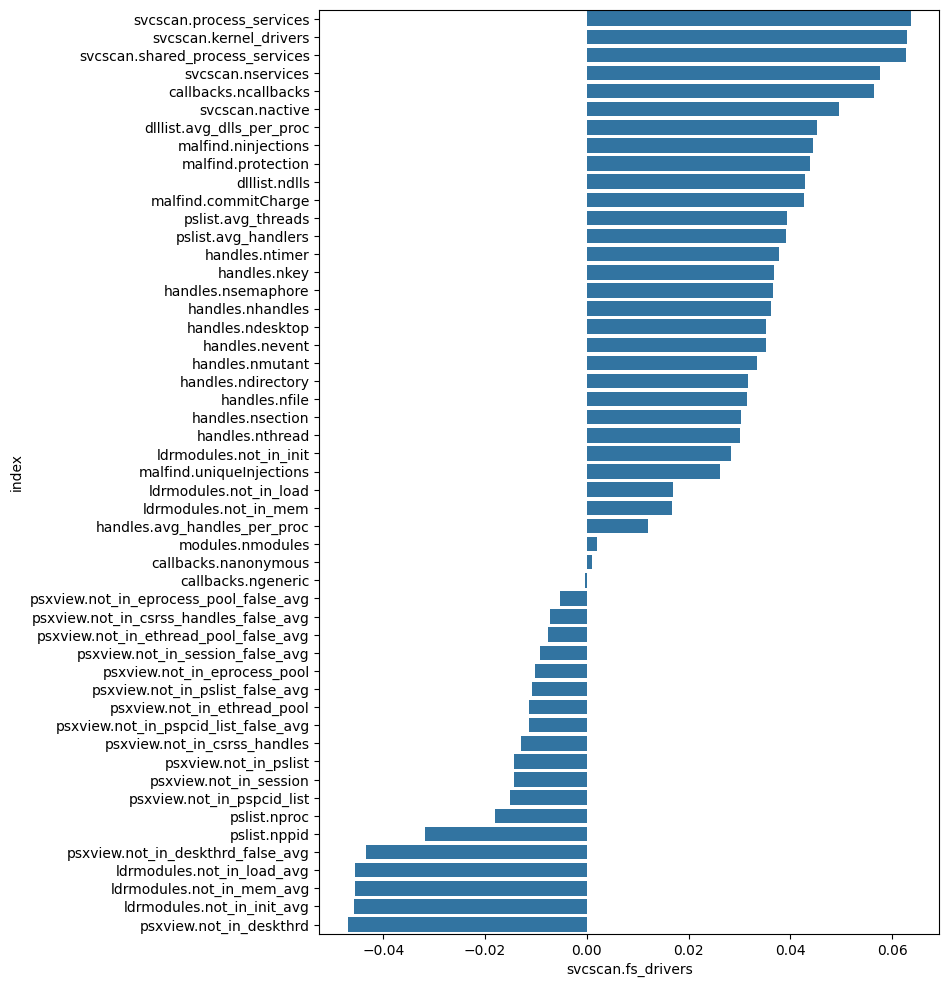

,svcscan.process_services
mean,25.071701
median,24.000000
std,1.531068
max,27.000000
min,7.000000


svcscan.process_services                         
                            mean median       std max min
Class                                                    
Benign                 26.230885   27.0  1.297103  27  24
Malware                23.895822   24.0  0.519255  24   7

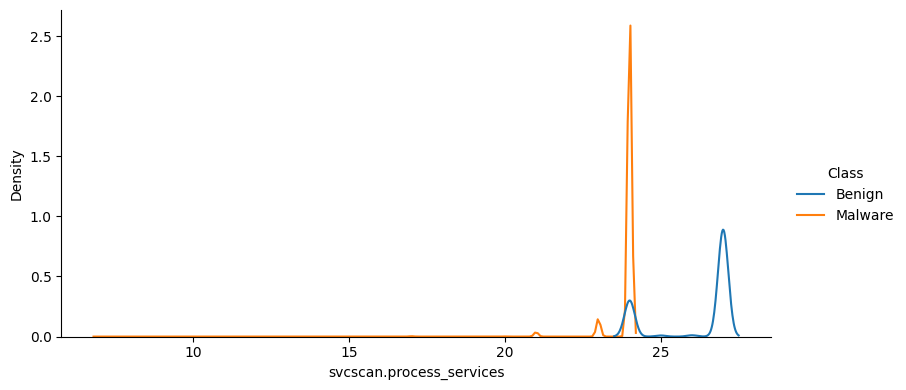

svcscan.process_services                         
                               mean median       std max min
Category                                                    
Benign                    26.230885   27.0  1.297103  27  24
Ransomware                23.882952   24.0  0.636303  24   7
Spyware                   23.869623   24.0  0.526807  24   7
Trojan                    23.935865   24.0  0.350877  24  20

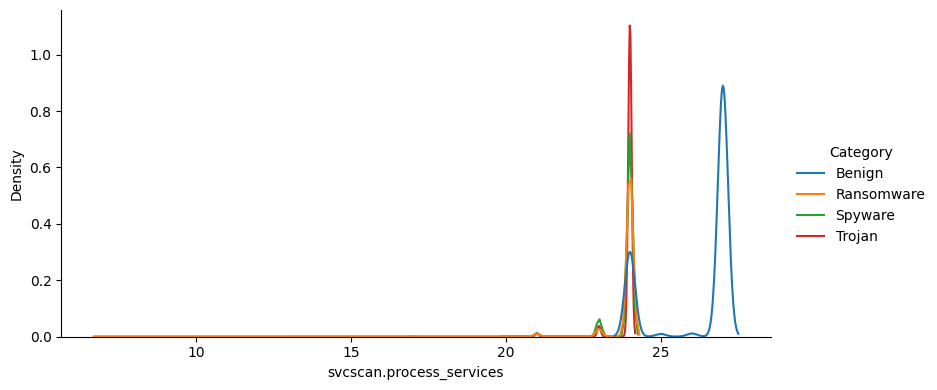

svcscan.process_services                         
                                 mean median       std max min
Family                                                        
180solutions                23.877439   24.0  0.576905  24   9
Ako                         23.894500   24.0  0.708252  24   7
Benign                      26.230885   27.0  1.297103  27  24
CWS                         23.923500   24.0  0.500773  24  17
Conti                       23.859084   24.0  0.686712  24  17
Emotet                      23.900864   24.0  0.427720  24  20
Gator                       23.915747   24.0  0.401856  24  21
Maze                        23.932155   24.0  0.423851  24  17
Pysa                        23.945718   24.0  0.368587  24  17
Reconyc                     23.929209   24.0  0.372253  24  21
Refroso                     23.949399   24.0  0.305250  24  21
Scar                        23.929500   24.0  0.374967  24  21
Shade                       23.804890   24.0  0.797465  24   9
TIBS                        23.637784   24.0  0.599259  24  21
Transponder                 23.915733   24.0  0.514690  24   7
Zeus                        23.969215   24.0  0.246279  24  21

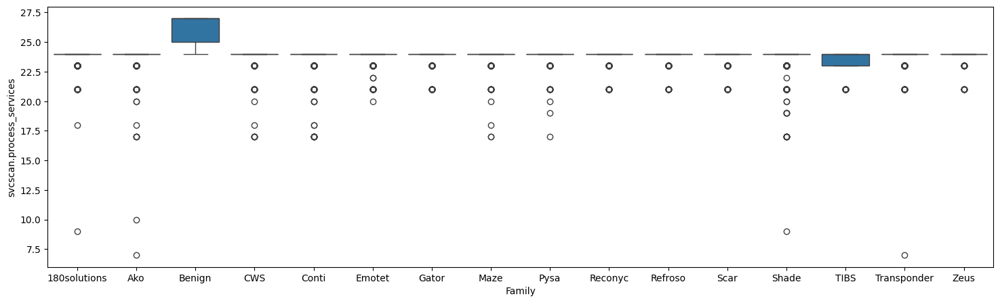

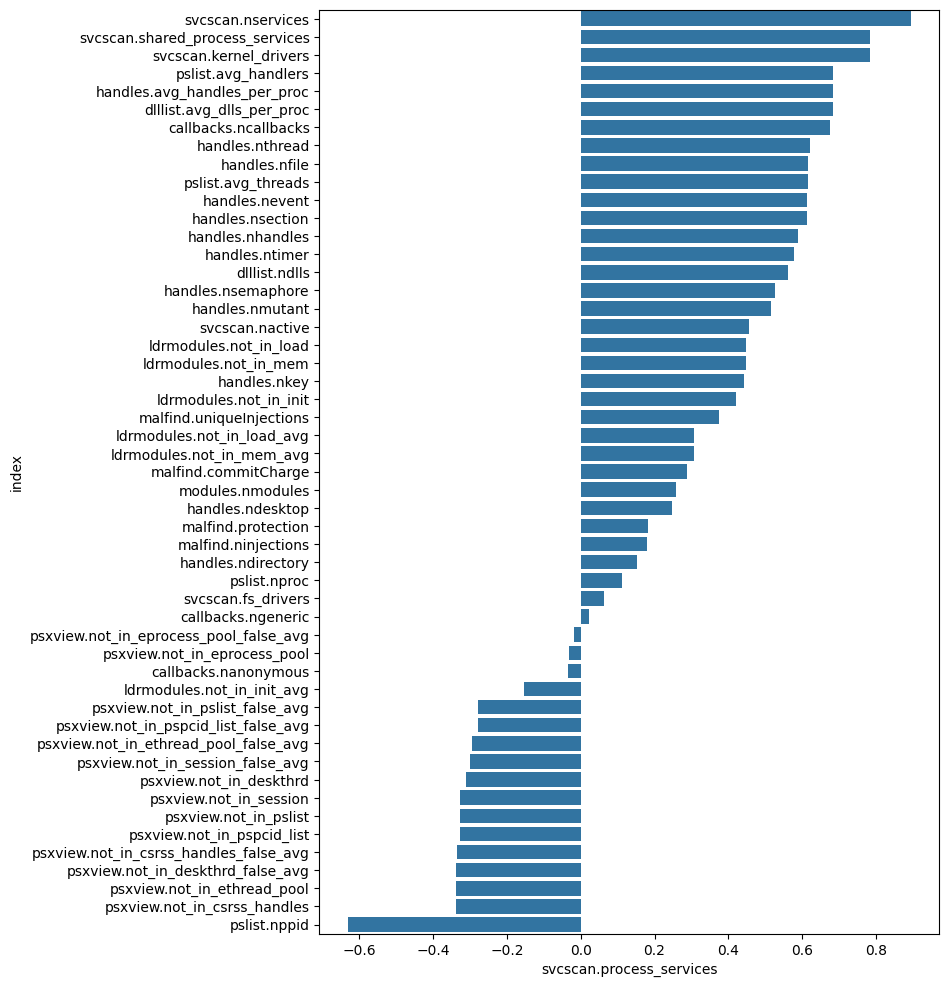

,svcscan.shared_process_services
mean,116.887746
median,118.000000
std,1.551283
max,118.000000
min,26.000000


svcscan.shared_process_services                           
                                   mean median       std  max  min
Class                                                             
Benign                       117.981766  118.0  0.251528  118  114
Malware                      115.777971  116.0  1.528961  118   26

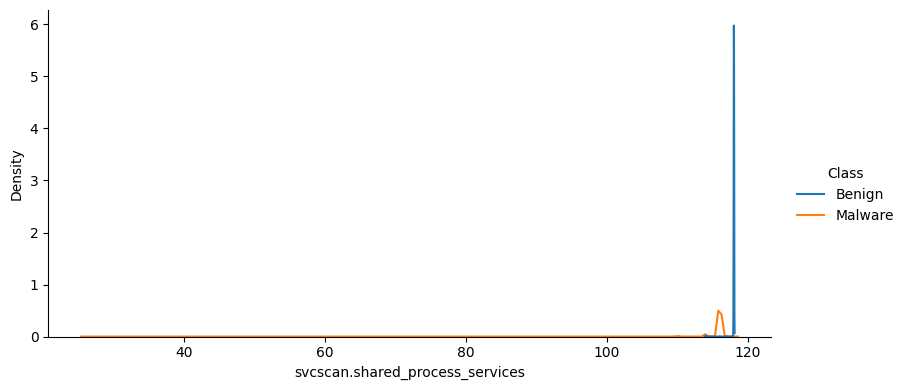

svcscan.shared_process_services                           
                                      mean median       std  max  min
Category                                                             
Benign                          117.981766  118.0  0.251528  118  114
Ransomware                      115.720449  116.0  2.077465  116   26
Spyware                         115.739348  116.0  1.479961  118   31
Trojan                          115.875738  116.0  0.699013  118  109

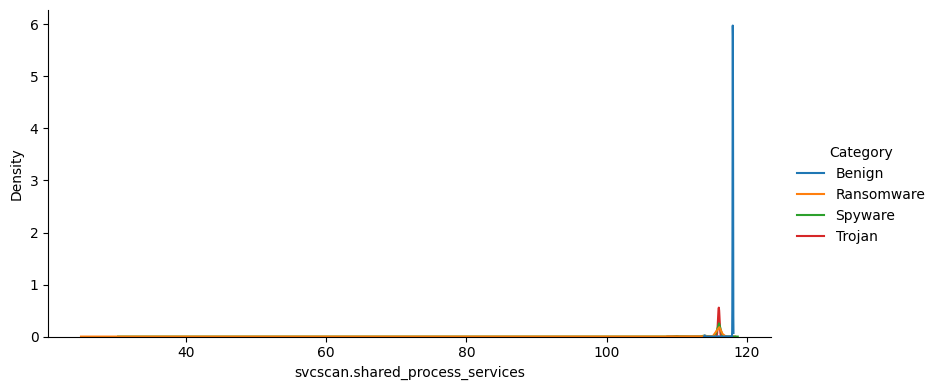

svcscan.shared_process_services                           
                                        mean median       std  max  min
Family                                                                 
180solutions                      115.745873  116.0  1.436146  116   69
Ako                               115.726000  116.0  2.688594  116   26
Benign                            117.981766  118.0  0.251528  118  114
CWS                               115.815000  116.0  1.556273  116   79
Conti                             115.658279  116.0  2.037534  116   91
Emotet                            115.807321  116.0  0.840837  116  109
Gator                             115.833501  116.0  0.800377  116  110
Maze                              115.852338  116.0  1.111768  116   92
Pysa                              115.881182  116.0  0.951952  116   91
Reconyc                           115.869260  116.0  0.762138  118  110
Refroso                           115.899800  116.0  0.608198  116  110
Scar                              115.862000  116.0  0.744468  116  110
Shade                             115.539257  116.0  2.620068  116   37
TIBS                              115.280540  116.0  1.195284  116  110
Transponder                       115.861353  116.0  1.919658  118   31
Zeus                              115.939456  116.0  0.489550  116  110

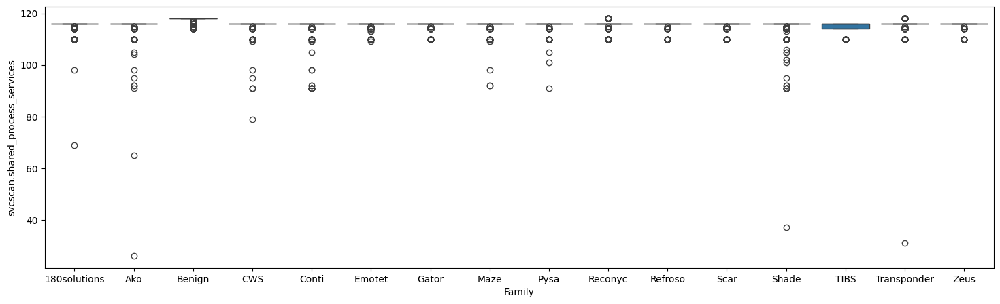

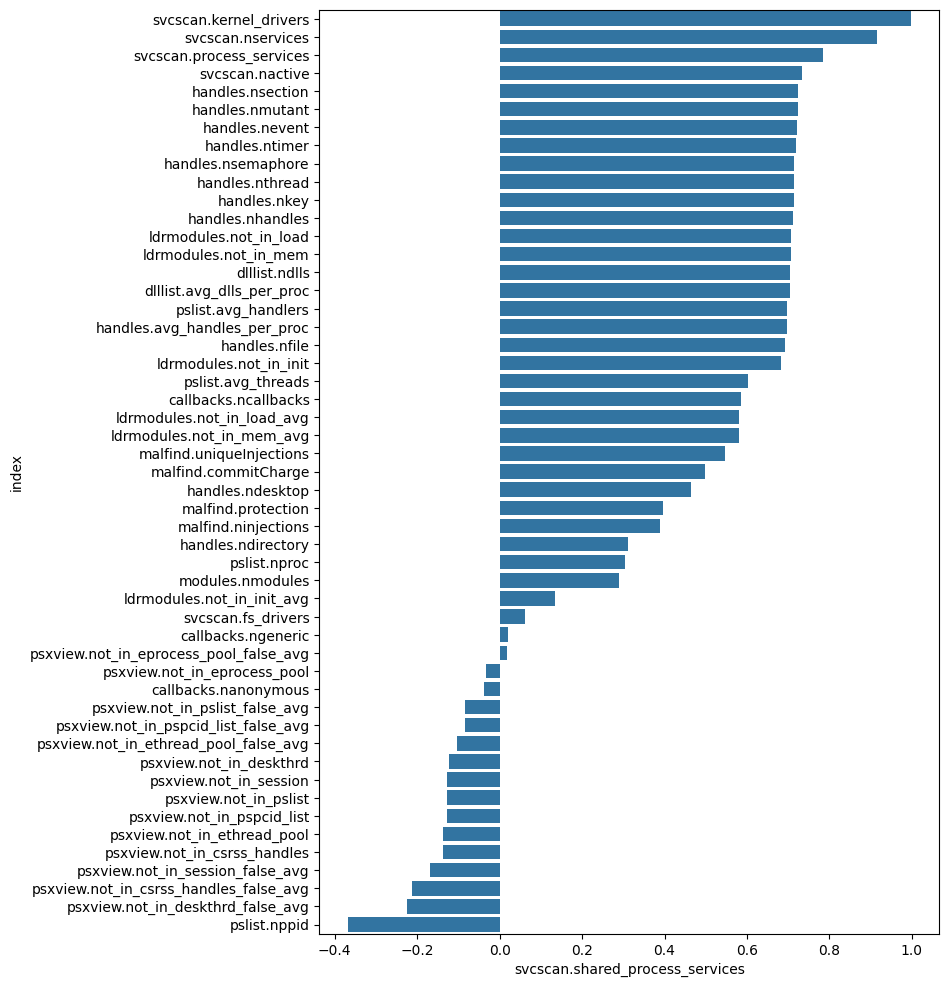

,svcscan.nactive
mean,122.011852
median,122.000000
std,2.819465
max,129.000000
min,30.000000


svcscan.nactive                           
                   mean median       std  max  min
Class                                             
Benign       123.840033  123.0  1.667565  129  113
Malware      120.157343  121.0  2.522476  125   30

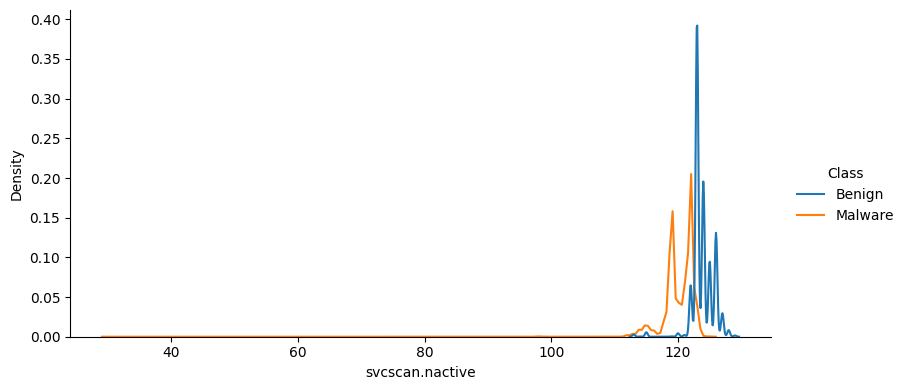

svcscan.nactive                           
                      mean median       std  max  min
Category                                             
Benign          123.840033  123.0  1.667565  129  113
Ransomware      120.186227  121.0  2.815884  124   30
Spyware         119.986137  120.0  2.650008  124   34
Trojan          120.305485  121.0  2.013597  125  108

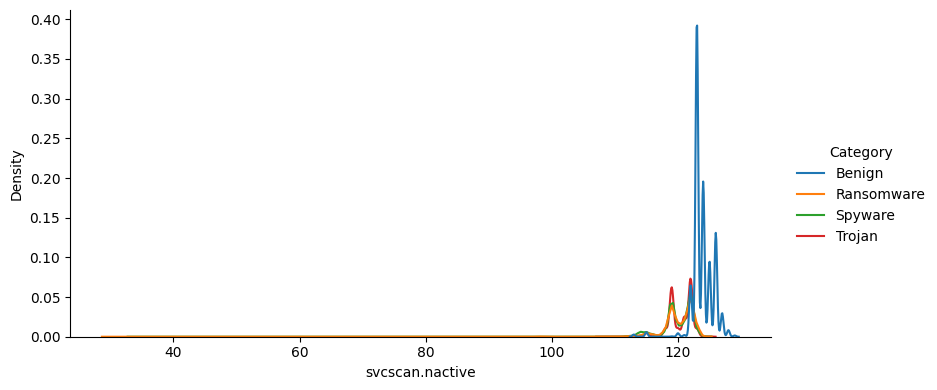

svcscan.nactive                           
                        mean median       std  max  min
Family                                                 
180solutions      120.058029  121.0  2.564217  123   70
Ako               120.307500  121.0  3.320912  123   30
Benign            123.840033  123.0  1.667565  129  113
CWS               120.420000  121.0  2.314363  123   88
Conti             120.060896  121.0  2.742346  124   98
Emotet            120.146416  121.0  2.271482  123  108
Gator             120.118857  121.0  2.098530  123  112
Maze              120.170468  121.0  2.183539  123   99
Pysa              120.360676  121.0  2.061270  123   98
Reconyc           120.302934  121.0  2.063928  123  112
Refroso           120.396794  121.0  1.873672  123  112
Scar              120.341500  121.0  2.038371  125  112
Shade             120.066291  121.0  3.289401  123   44
TIBS              118.512784  119.0  3.083276  123  112
Transponder       120.317559  121.0  2.819609  124   34
Zeus              120.337609  121.0  1.788891  124  112

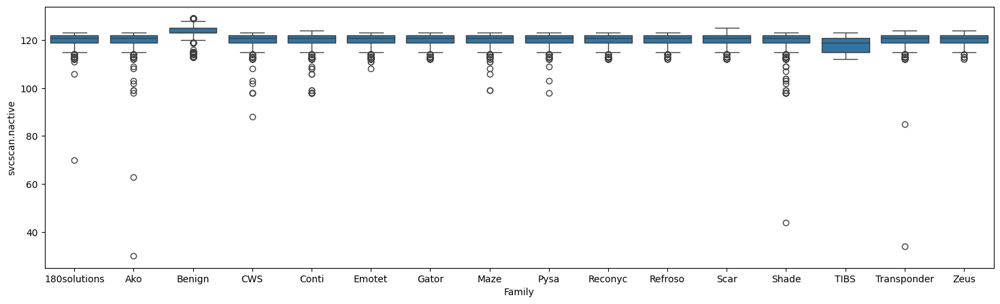

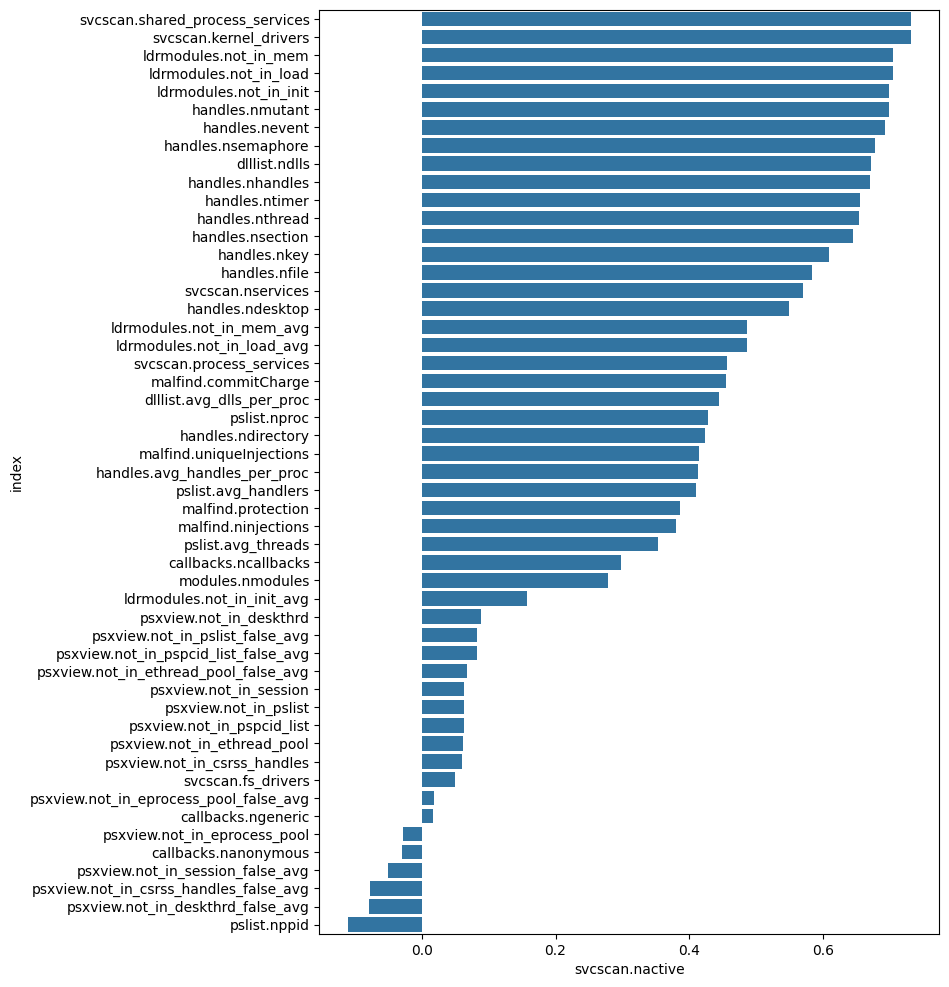

,callbacks.ncallbacks
mean,86.913036
median,87.000000
std,3.115690
max,89.000000
min,50.000000


callbacks.ncallbacks                         
                        mean median       std max min
Class                                                
Benign             87.738394   88.0  0.439517  88  87
Malware            86.075791   87.0  4.238772  89  50

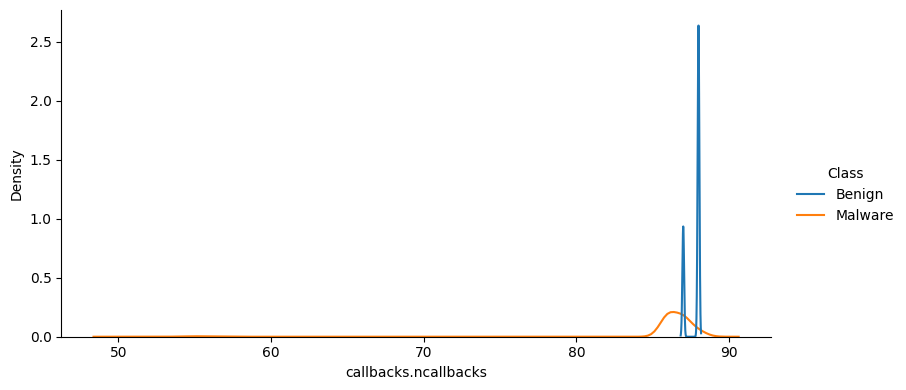

callbacks.ncallbacks                         
                           mean median       std max min
Category                                                
Benign                87.738394   88.0  0.439517  88  87
Ransomware            85.598467   86.0  5.609657  89  50
Spyware               86.314475   87.0  3.614755  88  51
Trojan                86.308439   87.0  3.022197  89  54

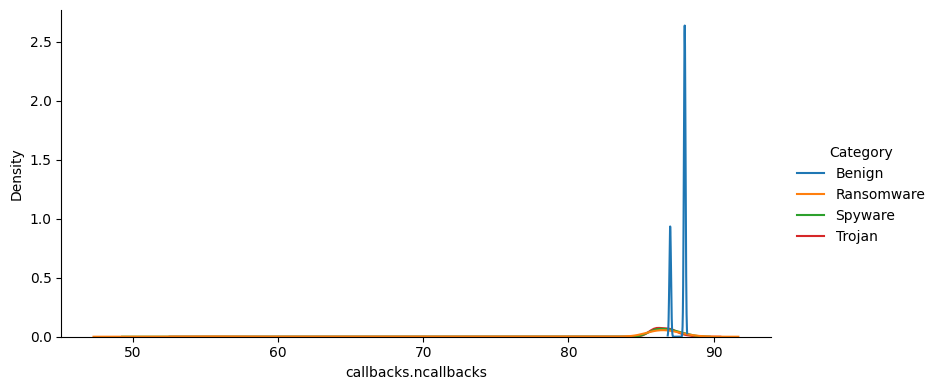

callbacks.ncallbacks                         
                             mean median       std max min
Family                                                    
180solutions            86.255128   86.0  3.484693  88  53
Ako                     85.519000   86.0  5.624630  88  54
Benign                  87.738394   88.0  0.439517  88  87
CWS                     85.993500   87.0  4.363597  88  51
Conti                   85.640664   86.0  5.534085  88  53
Emotet                  85.454499   87.0  6.089769  88  54
Gator                   85.946841   87.0  4.563559  88  54
Maze                    86.261117   87.0  3.298292  89  53
Pysa                    86.337756   87.0  2.886597  89  53
Reconyc                 86.566964   86.0  0.641556  88  86
Refroso                 86.555611   86.0  0.638304  88  86
Scar                    86.575000   87.0  0.628150  89  86
Shade                   84.511048   87.0  8.073786  88  50
TIBS                    87.296875   88.0  0.805942  88  86
Transponder             86.360315   86.0  2.993435  88  54
Zeus                    86.435608   87.0  2.218455  88  55

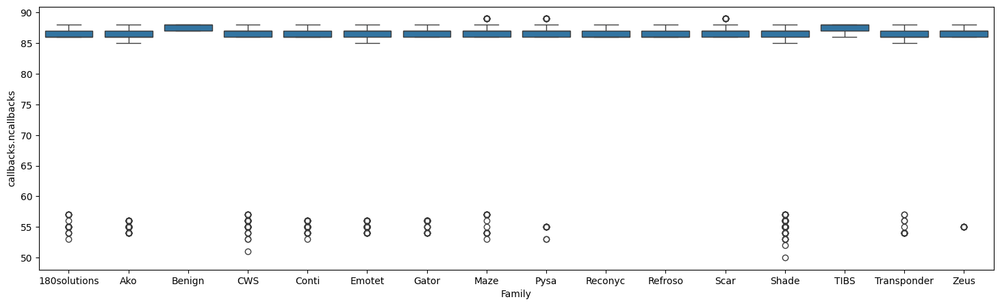

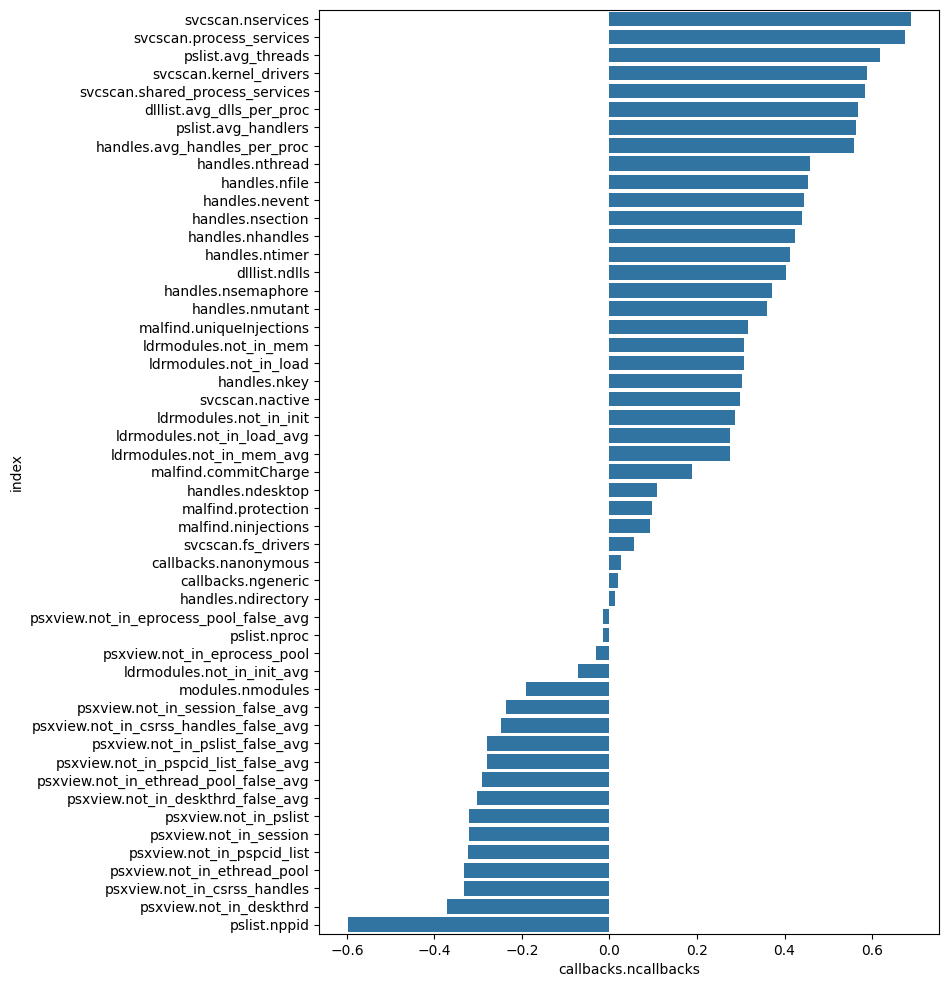

,callbacks.nanonymous
mean,0.000861
median,0.000000
std,0.029337
max,1.000000
min,0.000000


callbacks.nanonymous                        
                        mean median      std max min
Class                                               
Benign              0.000000    0.0  0.00000   0   0
Malware             0.001735    0.0  0.04162   1   0

/tmp/ipykernel_5371/2560809373.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(x=col_name,hue='Class',data=data,kind='kde',height=4,aspect=2)


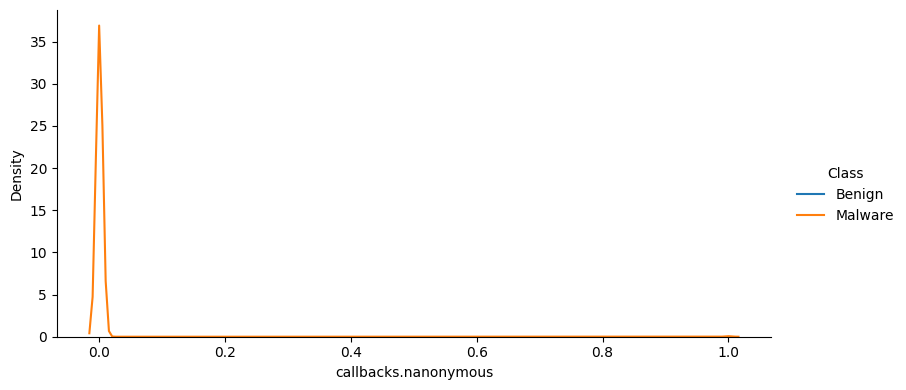

callbacks.nanonymous                         
                           mean median       std max min
Category                                                
Benign                 0.000000    0.0  0.000000   0   0
Ransomware             0.003149    0.0  0.056033   1   0
Spyware                0.000000    0.0  0.000000   0   0
Trojan                 0.002110    0.0  0.045885   1   0

/tmp/ipykernel_5371/2560809373.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(x=col_name,hue='Category',data=data,kind='kde',height=4,aspect=2)


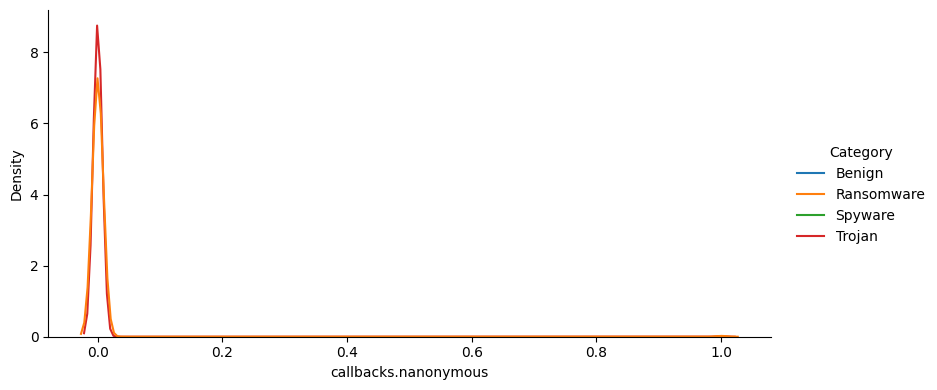

callbacks.nanonymous                         
                             mean median       std max min
Family                                                    
180solutions             0.000000    0.0  0.000000   0   0
Ako                      0.000000    0.0  0.000000   0   0
Benign                   0.000000    0.0  0.000000   0   0
CWS                      0.000000    0.0  0.000000   0   0
Conti                    0.000000    0.0  0.000000   0   0
Emotet                   0.000000    0.0  0.000000   0   0
Gator                    0.000000    0.0  0.000000   0   0
Maze                     0.011403    0.0  0.106202   1   0
Pysa                     0.006031    0.0  0.077451   1   0
Reconyc                  0.000000    0.0  0.000000   0   0
Refroso                  0.000000    0.0  0.000000   0   0
Scar                     0.005000    0.0  0.070551   1   0
Shade                    0.000000    0.0  0.000000   0   0
TIBS                     0.000000    0.0  0.000000   0   0
Transponder              0.000000    0.0  0.000000   0   0
Zeus                     0.005131    0.0  0.071464   1   0

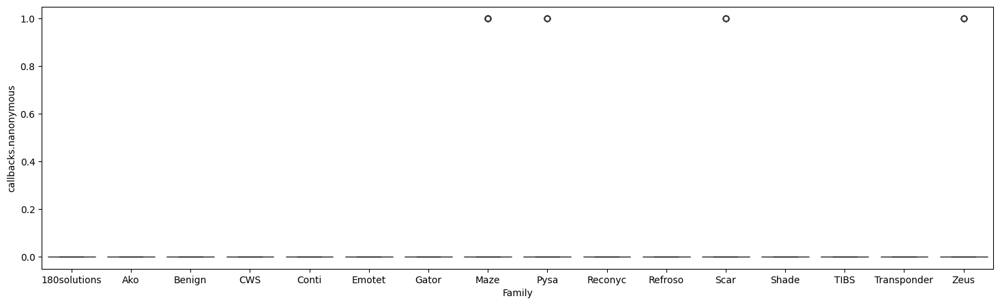

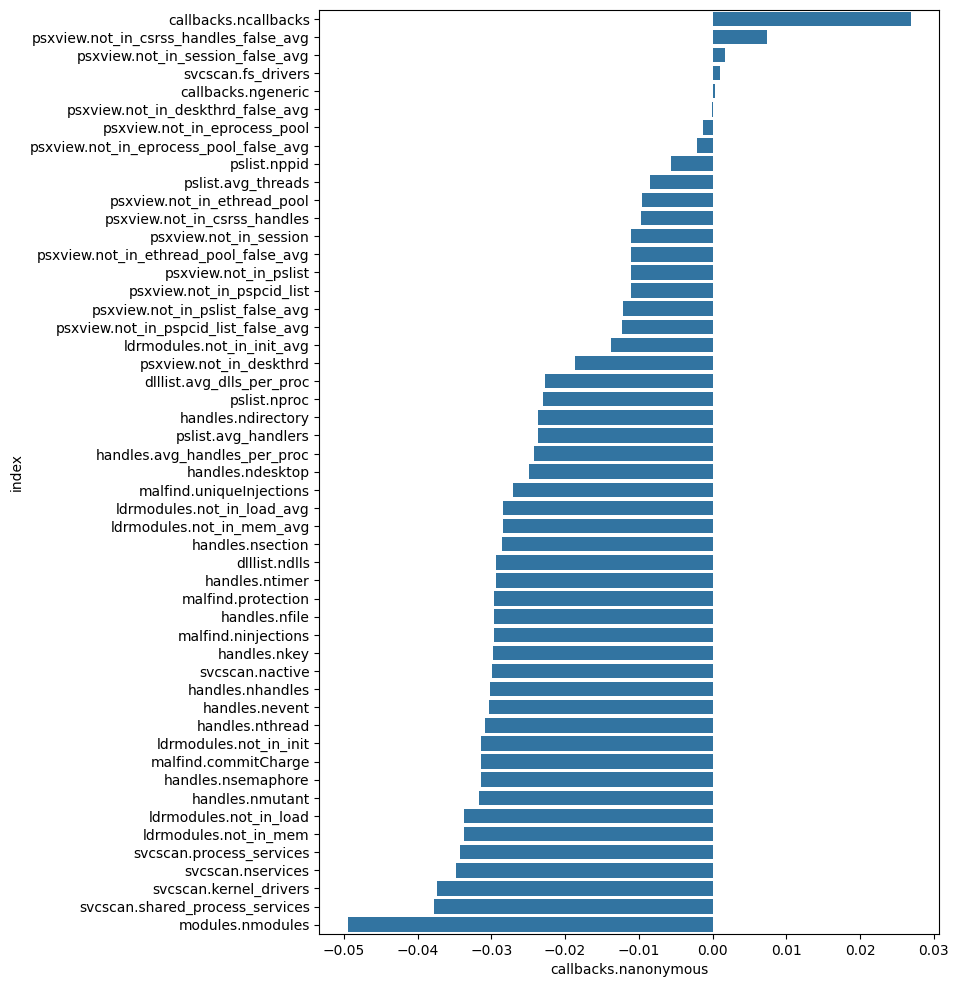

,callbacks.ngeneric
mean,7.999879
median,8.000000
std,0.010981
max,8.000000
min,7.000000


callbacks.ngeneric                         
                      mean median       std max min
Class                                              
Benign            8.000000    8.0  0.000000   8   8
Malware           7.999757    8.0  0.015584   8   7

/tmp/ipykernel_5371/2560809373.py:6: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(x=col_name,hue='Class',data=data,kind='kde',height=4,aspect=2)


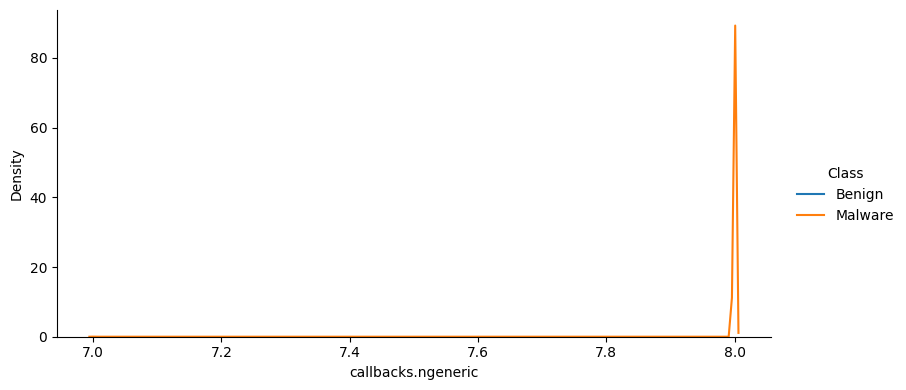

callbacks.ngeneric                         
                         mean median       std max min
Category                                              
Benign               8.000000    8.0  0.000000   8   8
Ransomware           7.999370    8.0  0.025090   8   7
Spyware              7.999898    8.0  0.010096   8   7
Trojan               8.000000    8.0  0.000000   8   8

/tmp/ipykernel_5371/2560809373.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.displot(x=col_name,hue='Category',data=data,kind='kde',height=4,aspect=2)


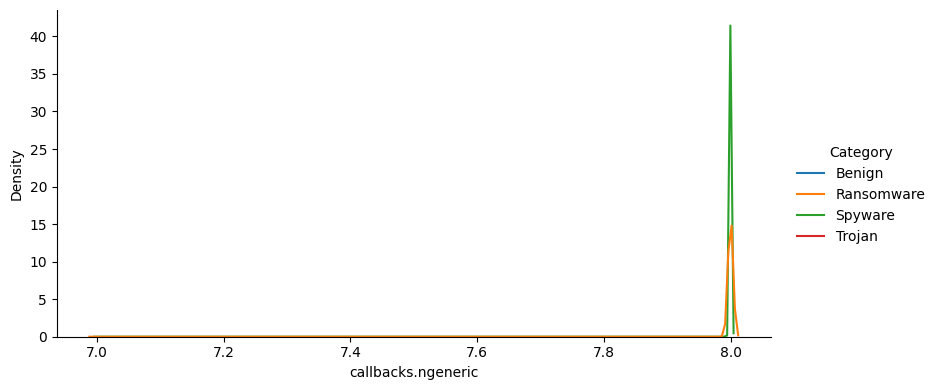

callbacks.ngeneric                         
                           mean median       std max min
Family                                                  
180solutions           8.000000    8.0  0.000000   8   8
Ako                    7.997000    8.0  0.054704   8   7
Benign                 8.000000    8.0  0.000000   8   8
CWS                    8.000000    8.0  0.000000   8   8
Conti                  8.000000    8.0  0.000000   8   8
Emotet                 8.000000    8.0  0.000000   8   8
Gator                  8.000000    8.0  0.000000   8   8
Maze                   8.000000    8.0  0.000000   8   8
Pysa                   8.000000    8.0  0.000000   8   8
Reconyc                8.000000    8.0  0.000000   8   8
Refroso                8.000000    8.0  0.000000   8   8
Scar                   8.000000    8.0  0.000000   8   8
Shade                  8.000000    8.0  0.000000   8   8
TIBS                   8.000000    8.0  0.000000   8   8
Transponder            7.999585    8.0  0.020374   8   7
Zeus                   8.000000    8.0  0.000000   8   8

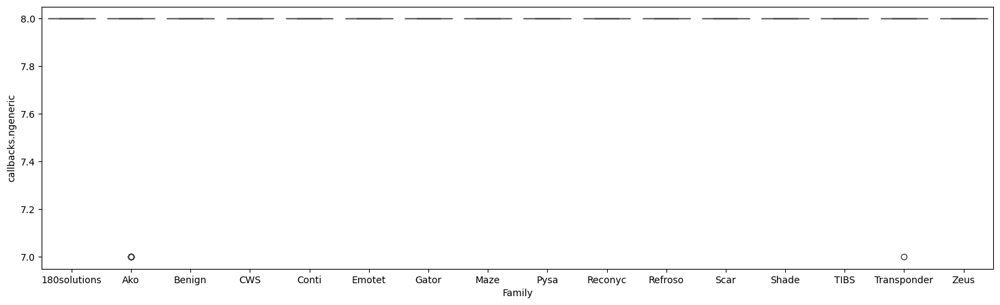

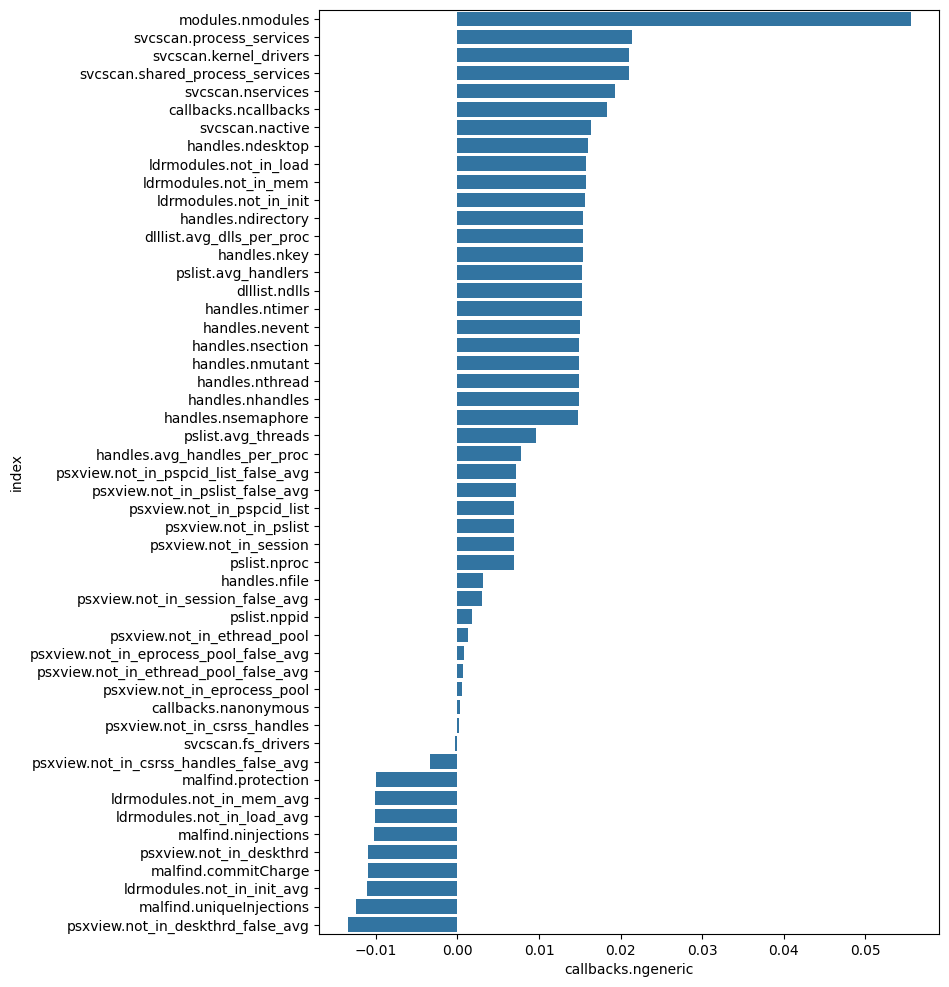

In [79]:
for col_name in df.columns[:-3]:
    plotFeatures(col_name,df)